---
# B18.G2.Property Click Prediction

Edward Bujak

version 20231123

InnovatiCS  
Batch 18 - Data Science and Machne Learning  
June - December 2023

Group Project # 2 : Property Click Prediction
---
+ Team Members:
Name                    | Email Address            | Phone Number |
:-----------------------|:-------------------------|:-------------
Aseel Al Soub (Nashmia) |                          | 214-394-3969 |
Sami Abdelghani         |                          | 626-241-0621 |
Muhammad Rehman         |                          | 734-620-1167 |
Fahad Ali               |                          | 513-227-1952 |
Edward Bujak            | Edward_Bujak@hotmail.com | 267-476-4312 |
+ Dropbox (original material):
    + https://www.dropbox.com/sh/l1zl4s7claxgi42/AADLlkpd-GJmyUR3uV8yV361a?dl=0
+ Google Drive (PPTX, code, data, etc.):
    + https://drive.google.com - CHANGE THIS
---
from "Property Click Prediction.docx":  

Project # 2 : Property Click Prediction

This data project has been used in the recruitment process for the data science positions at NoBroker Data Sciences.
Properties form one of the most important data entity in nobroker data ecosystem. Properties receive interactions on NoBroker. One interaction is defined as one user requesting an owner contact on a property. A property can receive 0 to many interactions. This research will focus on studying and modelling the interactions received by properties.

Assignment

We are interested in studying and statistically modelling property interactions. We would like to have a predictive model that would say the number of interactions that a property would receive in a period. For simplicity let’s say we would like to predict the number of interactions that a property would receive within 3 days of its activation and 7 days of its activation. However, this part is open ended and you could bring your own time intervals into the problem. This is the part of your artistry in data science. In the end we need to profess the number of interactions that a certain kind of property would receive within a given number of days. We cannot do a time series forecasting here considering the limited amount of data that could be shared as a part of an assignment. You may clean the data, merge them, do an EDA, visualize, and build your model.


---
# ToDo - Ideas/Thoughs

+ handle NaN
+ Transformations
    + datetime - convert all appropriate columns/features to datetime
    + encoding
        + categorical
            + ordinal - label encoding
            + nominal - OHE (dummy)
    + exapand columns
        + type -> num_bedrooms [1,2,3,4,5], has_hall [0,1]
    + MORE
+ outliers
+ machine learning algorihtms
    + regression
        + number of days to interact
        + number of intractions between start and end days after activation date
    + binary classification - MAYBE
        + interact within 3 days
        + interact within 7 days    


---
<a id='jupyter-notebook-environment'></a>
# Jupyter Notebook Environment

<div style="text-align:right">
    <a href="#top">top</a>
</div>

In [1]:
%%javascript
// Prevent scrolling within output cells
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [2]:
# multiple cell outputs in __repr__()
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

---
# Imports

In [3]:
# data manipulation, mangling, munging, ...
import pandas as pd

# data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# utilities, functions, classes
import ed_utils   # for head(), ...


## Versions

In [4]:
from watermark import watermark
 
# print(watermark(packages='pyspark,numpy,pandas'))   # no spaces within string
print(watermark(packages='pandas,pd,matplotlib,matplotlib.pyplot,plt,ed_utils'))

pandas           : 1.5.3
pd               : not installed
matplotlib       : 3.7.1
matplotlib.pyplot: unknown
plt              : not installed
ed_utils         : 0.3.8e



Leave empty to get software and hardware information.

In [5]:
from watermark import watermark

# print(watermark(packages='pyspark,numpy,pandas'))   # no spaces within string
print(watermark(packages=''))

Last updated: 2023-12-02T17:19:16.517352-08:00

Python implementation: CPython
Python version       : 3.11.4
IPython version      : 8.12.0

Compiler    : MSC v.1916 64 bit (AMD64)
OS          : Windows
Release     : 10
Machine     : AMD64
Processor   : Intel64 Family 6 Model 142 Stepping 12, GenuineIntel
CPU cores   : 8
Architecture: 64bit



In [6]:
help(ed_utils)

Help on module ed_utils:

NAME
    ed_utils

DESCRIPTION
    File name: ed_utils.py
    Author: Edward Bujak
    Date created: 2018.04.28
    Date last modified: 2023.10.29
    Python Version: 3.9.12 (that ed_utils was tested with)
    
    collection of utility functions and classes
    
    Functions:
        _inspector
        adder
        column_str
        five_number_summary
        five_number_summary2
        get_memory_info
        grep
        head
        inspector
        is_this_life_as_we_know_it
        ls_l - only available on unix-like Operating systems, not Windows
        meaning_of_life
        pp
        speak
        tail
        tree
        wc
    
    Classes:
        HiddenPrints
        DummyContextManager
    
    
    anytime ed_utils.py is changed, also need to restart kernel for all .IPYNB files that import ed_utils
    or
    you must reload it:
    
    import importlib
    importlib.reload(ed_utils)
    ed_utils.__version__

CLASSES
    builtins.Excep

# Helper Functions

In [7]:
from typing import Union

def is_latitude(latitude: Union[int, float]) -> bool:
    """
    Check if a value is a valid latitude.

    Parameters:
        latitude (float or int): The value to check as a latitude.

    Returns:
        bool: True if the value is a valid latitude, False otherwise.
    """
    if not isinstance(latitude, (float, int)):
        raise TypeError("Latitude must be a float or an integer")

    return -90 <= latitude <= 90


# Assert statements with error messages for testing
assert is_latitude(45.678) == True, "Expected True for a valid latitude"
assert is_latitude(-90) == True, "Expected True for -90"
assert is_latitude(90) == True, "Expected True for 90"
assert is_latitude(91) == False, "Expected False for 91"
# assert is_latitude("invalid") == False, "Expected False for invalid input"


In [8]:
from typing import Union

def is_longitude(longitude: Union[int, float]) -> bool:
    """
    Check if a value is a valid longitude.

    Parameters:
        longitude (float or int): The value to check as a longitude.

    Returns:
        bool: True if the value is a valid longitude, False otherwise.
    """
    if not isinstance(longitude, (float, int)):
        raise TypeError("Longitude must be a float or an integer")

    return -180 <= longitude <= 180

# Assert statements with error messages for testing
assert is_longitude(45.678) == True, "Expected True for a valid longitude"
assert is_longitude(-180) == True, "Expected True for -180"
assert is_longitude(180) == True, "Expected True for 180"
assert is_longitude(181) == False, "Expected False for 181"
# assert is_longitude("invalid") == False, "Expected False for invalid input"


In [9]:
# from typing import Optional, Union

# def your_function(bar_annotation_type: Optional[Union[str, None]] = 'count_and_percentage'):
#     pass #code here later?

# Usage examples:
# your_function()  # Uses the default value 'count_and_percentage'
# your_function('count')  # Accepts a string value
# your_function(None)  # Accepts None as a valid value


In [10]:
s = 'Count  '
# s = None

if s is None:
    s = ''

len(s)
s = s.strip().lower()
len(s)
s

7

5

'count'

In [11]:
bar_annotation_type = 'Count   '
bar_annotation_type = ' Percentage   '
bar_annotation_type = 'Percentage'
bar_annotation_type = 'Count_and_Percentage'
# bar_annotation_type = '     '
# bar_annotation_type = '  car  '

# Default bar_annotation_type (if None specifiied) is 'count_and_percentage'
if bar_annotation_type is None:
    bar_annotation_type = 'count_and_percentage'

# Convert to lower case for case-insensitive comparison
bar_annotation_type = bar_annotation_type.strip().lower()

# Default bar_annotation_type is 'count_and_percentage'
if bar_annotation_type == "":
    bar_annotation_type = 'count_and_percentage'

print(f'{bar_annotation_type = }')

# Check if the value is one of the allowed options
if bar_annotation_type in ['', 'count', 'percentage', 'count_and_percentage']:
    print("bar_annotation_type is valid.")
else:
    print("bar_annotation_type is not valid.  It should be in [None, '', 'count', 'percentage', 'count_and_percentage'].")

# Check if the value is one of the allowed options
if bar_annotation_type not in [None, '', 'count', 'percentage', 'count_and_percentage']:
    raise ValueError(f"{bar_annotation_type=} is not a valid.  It should be in [None, '', 'count', 'percentage', 'count_and_percentage'].")


bar_annotation_type = 'count_and_percentage'
bar_annotation_type is valid.


In [12]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Optional, Tuple, Union


def plot_bar_categorical(
    category_value_dict: dict,   # can be from pandas.Series.value_counts(), or collections.Counter()
    title: Optional[str] = None,
    xlabel: Optional[str] = 'Category',
    ylabel_on_left: Optional[str] = 'Count',
    ylabel_on_right: Optional[str] = 'Percentage',
    xtick_rotation: Optional[int] = 0,
    figsize: Optional[Tuple[int, int]] = (10, 6),
    fontsize_top_of_bar: Optional[int] = 11,
    # display y-axis ticks on the left; i.e. the count/frequency
    y_ticks_on_left_counts: Optional[bool] = True,
    # display y-axis ticks on the right; i.e. the percentage
    y_ticks_on_right_percentage: Optional[bool] = True,

    bar_annotation_type: Optional[Union[str, None]] = 'count_and_percentage',
    # can also be: [None, '', 'count', 'percentage', 'count_and_percentage']
    
    # if total==0 then this is a relative frequency, then this will calculate total
    # if total!=0 then this is an absolute frequency, and needs to be provided
    total: Optional[int] = 0,   # CHANGE
    file_path: Optional[str] = None,
) -> None:
    """
    Create and display a bar plot for categorical data. 
    The left y-axis will be the count. 
    The right y_axis will be the percentage.
    On the top of each bar will be the count and the percentage.
    The percentage is absolute if total is provided (i.e. not 0).
    The percentage is relative if total is not provided (i.e. default is 0).    
    
    Parameters:
        - category_value_dict: (dict): A dictionary containing category names as keys and their corresponding values.
        - title: Optional[str]: Title for the bar plot. Defaults to None.
        - xlabel: Optional[str]: Label for the x-axis. Defaults to 'Category'.
        - ylabel_on_left: Optional[str]: Label for the left y-axis. Defaults to 'Count'.
        - ylabel_on_right: Optional[str]: Label for the right y-axis. Defaults to 'Percentage'.
        - xtick_rotation: Optional[int]: Rotation angle for x-axis labels. Defaults to 0.
        - figsize: Optional[Tuple[int, int]]: Figure size. Defaults to (10, 6).
        - fontsize_top_of_bar: Optional[int]: Font size for text on top of the bars. Defaults to 11.
        - y_ticks_on_left_counts: Optional[bool]: display y-axis ticks on the left; i.e. the count/frequency.  Default is True.
        - y_ticks_on_right_percentage: Optional[bool]: display y-axis ticks on the right; i.e. the percentage.  Default is True.

        - bar_annotation_type: Optional[Union[str, None]]: Annotation at the top of each bar. Default is 'count_and_percentage'.
            Can also be: [None, '', 'count', 'percentage', 'count_and_percentage']
        
        - total: Optional[int]: Total value for calculating percentages. If set to 0, it will calculate the total
            from the values in the dictionary. Defaults to 0.
        - file_path: Optional[str]: file_path to save image to. Default is None, i.e. no image file is saved,

    Raises:
        - ValueError: If the input 'category_value_dict' is not a dictionary or if 'total' is not a non-negative integer.
    """
    if not isinstance(category_value_dict, dict):
        raise ValueError(f"Input 'category_value_dict' must be a dictionary; you passed a {type(category_value_dict)}.")
    
    if not isinstance(total, (int, np.int8, np.int16, np.int32, np.int64, np.uint8, np.uint16, np.uint32, np.uint64)):
        raise ValueError(f"{type(total) = }  total must be a non-negative integer.")

    if total < 0:
        raise ValueError(f"{total = }  total must be a non-negative integer.")

    # ------------------------------------
    
    # Convert to lower case for case-insensitive comparison
    if bar_annotation_type is not None:
        bar_annotation_type = bar_annotation_type.strip().lower()

    # print(f'{bar_annotation_type = }')
    
    # Check if the value is one of the allowed options
    if bar_annotation_type not in [None, '', 'count', 'percentage', 'count_and_percentage']:
        raise ValueError(f"{bar_annotation_type=} is not a valid.  It should be in [None, '', 'count', 'percentage', 'count_and_percentage'].")
    
    # ------------------------------------

    if total == 0:
        total = sum(category_value_dict.values())    
    
    fig, ax1 = plt.subplots(figsize=figsize)

    # Convert keys to strings - so the plotting of the x is exactly as
    # specified and not numeric order
    # - this is ingenious to prevent "visual" rearrangement of the various bars sorted numerically
    name_value_dict = {str(k): v
                       for k, v in category_value_dict.items()}
    # print(d_str)

    # First plot on ax1
    bars = plt.bar(
        name_value_dict.keys(),
        name_value_dict.values(),
        # color='blue',
        alpha=0.6)
    ax1.set_ylabel(ylabel_on_left, fontsize=14)

    # Increase y-limit to add space
    max_y = max(name_value_dict.values())
    ax1.set_ylim(0, max_y * 1.06)

    # Second plot on ax2 (twin of ax1)
    ax2 = ax1.twinx()
    percentage = [value / total * 100
                  for value in name_value_dict.values()]
    ax2.set_ylabel(ylabel_on_right, fontsize=14)


    # Annotate bars
    # bar_annotation_type can be in [None, '', 'count', 'percentage', 'count_and_percentage']
    if bar_annotation_type not in [None, '']:
        for bar, count, pct in zip(bars, name_value_dict.values(), percentage):
            if bar_annotation_type == 'count_and_percentage':
                annotation_str = f'{count} ({pct:.1f}%)'
            elif bar_annotation_type == 'count':
                annotation_str = f'{count}'
            elif bar_annotation_type == 'percentage':
                annotation_str = f'{pct:.1f}%'
    
            ax1.text(bar.get_x() + bar.get_width() / 2,
                     count + max_y * 0.01,
                     # f'{count} ({pct:.1f}%)',
                     annotation_str,
                     ha='center',
                     color='black',
                     fontsize=fontsize_top_of_bar)


    # Add title and x-axis label
    ax1.set_title(title, fontsize=16)
    ax1.set_xlabel(xlabel, fontsize=14)

    # Set custom x-tick labels
    # the number of xticks
    # ax1.set_xticks(list(range(len(name_value_dict.keys()))))

    # ax1.set_xticks(list(name_value_dict.keys()))
    ax1.set_xticks(range(len(name_value_dict.keys())))
    ax1.set_xticklabels(list(name_value_dict.keys()), rotation=xtick_rotation)

    # ax1.set_xticklabels(['Not Cancelled', 'Cancelled'])   # the valus at the xticks

    if total != 0:
        # Need to slide/adjust the right y axis, i.e. percentage, to match
        # the left y axis, i.e. the absolute count
        lower_limit, upper_limit = ax1.get_ylim()
        # print("ax1 Lower Limit:", lower_limit)
        # print("ax1 Upper Limit:", upper_limit)
        ax2.set_ylim([lower_limit / total * 100, upper_limit / total * 100])

    # Optionally suppress y-ticks on the left y-axis (count/frequency)
    if not y_ticks_on_left_counts:
        ax1.set_yticks([])

    # Optionally suppress y-ticks on the right y-axis (percentage)
    if not y_ticks_on_right_percentage:
        ax2.set_yticks([])
    
    # plt.tight_layout()
    # Optionally write the chart out as a file
    if file_path is not None:
        plt.savefig(file_path,
                    # dpi=1000
                    )
        
    # plt.show()

---
# Directory

In [13]:
# Windows and unix
# recursive
!tree

Folder PATH listing for volume OS
Volume serial number is A240-F140
C:.
+---.ipynb_checkpoints
+---data
+---Dropbox
¦   +---2 - Property Click Prediction
¦       +---BBDS_Data
+---__pycache__


In [14]:
ed_utils.tree()   # default path is here

.
|-- B18.G2.Property Click Prediction.10.ipynb
|-- B18.G2.Property Click Prediction.11.ipynb
|-- B18.G2.Property Click Prediction.2.ipynb
|-- B18.G2.Property Click Prediction.3.ipynb
|-- Dropbox
    |-- 2 - Property Click Prediction
        |-- BBDS_Data
            |-- Data Preparation_20230307RB.rmp
            |-- Map of UK.twb
            |-- Map.of.UK_20230307RB.twb
            |-- Property.Click.Prediction_20230311RB.docx
            `-- insurance_claims_BBDS_20230307RB.csv
        |-- Property Click Prediction.docx
        |-- property_data_set.csv
        |-- property_interactions.csv
        `-- property_photos.tsv
    |-- 2 - Property Click Prediction.zip
    `-- _2 - Property Click Prediction - Dropbox.webloc
|-- Property Click Prediction.docx
|-- Property Click Prediction.txt
|-- Property Clicks interactions Within 0-7 Days.csv
|-- Property.Click.Prediction_20230311RB.docx
|-- __pycache__
    `-- ed_utils.cpython-311.pyc
|-- data
    |-- property_data_set.csv
    |-- prope

(5, 28)

# Data Files

The 3 data files are in the "data" subfolder. 

In [15]:
!tree data

Folder PATH listing for volume OS
Volume serial number is A240-F140
C:\USERS\SABDE\ONEDRIVE\DESKTOP\INNOVATICS - BATCH 18\B18.G2.PROPERTY CLICK PREDICTION.3\B18.G2.PROPERTY CLICK PREDICTION\DATA
No subfolders exist 



In [16]:
%ls -l data

 Volume in drive C is OS
 Volume Serial Number is A240-F140

 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction


 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction\data

10/29/2023  01:41 PM    <DIR>          .
11/30/2023  01:02 AM    <DIR>          ..
10/29/2023  01:41 PM         4,726,585 property_data_set.csv
10/29/2023  01:41 PM         9,724,856 property_interactions.csv
10/29/2023  01:41 PM        35,466,940 property_photos.tsv
               3 File(s)     49,918,381 bytes
               2 Dir(s)  194,535,124,992 bytes free


File Not Found


3 data files:
+ Property - property_data_set.csv
+ Photos - property_photos.tsv
+ Interactions - property_interactions.csv

Let's look at the first few lines of each of the data files in the "data" subfolder. 

In [17]:
# we could look at every file in the "data" subfolder,
# but let's only look at the source data files.
data_file_paths = ('data/property_data_set.csv',
                   'data/property_interactions.csv',
                   'data/property_photos.tsv')
data_file_paths

('data/property_data_set.csv',
 'data/property_interactions.csv',
 'data/property_photos.tsv')

In [18]:
for data_file_path in data_file_paths:
    print(data_file_path)
    ed_utils.head(data_file_path, num_lines=2)
    print('-'*90)

data/property_data_set.csv
property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,lease_type,lift,locality,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type
ff808081469fd6e20146a5af948000ea,BHK2,09-03-2017 14:36,1,3,4,SEMI_FURNISHED,1,12.87617415,77.59657101,FAMILY,1,Hulimavu,BOTH,2,850,1,560076,12000,120000,AP
------------------------------------------------------------------------------------------
data/property_interactions.csv
"property_id","request_date"
"ff808081469fd6e20146a5af948000ea","2017-03-10 17:42:34"
------------------------------------------------------------------------------------------
data/property_photos.tsv
"property_id"	"photo_urls"
"ff808081469fd6e20146a5af948000ea"	"[{\"title\":\"Balcony\",\"name\":\"IMG_20131006_120837.jpg\",\"imagesMap\":{\"original\":\"ff808081469fd6e20146a5af948000ea_65149_original.jpg\",\"thumbnail\":\"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg\",\"medium\"

---
# Property - "property_data_set.csv'

+ from "Property Click Prediction.docx":  
    property_data_set.csv:  
    + Properties data containing various features like activation_date, BHK type, locality, property size, property age, rent, apartment type, etc.
    + activation_date is the date the property got activated on NoBroker. Fields like lift, gym, etc are binary-valued - 1 indicating presence and 0 indicating absence. All other fields are self-explanatory.
    + You may use these along with the rest of the data sets to engineer the features that you would use in your study.
+ Detailed description of each column/feature below in each specific column/feature analysis.

## Data

In [19]:
df_property = pd.read_csv(r'data/property_data_set.csv')
df_property

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,lift,locality,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type
0,ff808081469fd6e20146a5af948000ea,BHK2,09-03-2017 14:36,1,3,4.0,SEMI_FURNISHED,1,12.876174,77.596571,...,1,Hulimavu,BOTH,2,850,1,560076.0,12000,120000,AP
1,ff8080814702d3d10147068359d200cd,BHK2,07-03-2017 12:02,2,4,11.0,SEMI_FURNISHED,1,13.018444,77.678122,...,1,Ramamurthy Nagar,BOTH,1,1233,1,560016.0,20000,150000,AP
2,ff808081470c645401470fb03f5800a6,BHK2,10-03-2017 13:43,2,0,4.0,NOT_FURNISHED,1,12.975072,77.665865,...,1,GM Palya,FOUR_WHEELER,0,1200,0,560075.0,15000,75000,AP
3,ff808081470c6454014715eaa5960281,BHK3,09-03-2017 22:16,2,3,4.0,SEMI_FURNISHED,0,12.888169,77.591282,...,0,Arakere,BOTH,1,1300,0,560076.0,17000,150000,AP
4,ff808081474aa867014771a0298f0aa6,BHK1,15-03-2017 18:29,1,1,2.0,SEMI_FURNISHED,0,12.990243,77.712962,...,0,Hoodi,BOTH,4,450,0,560048.0,6500,40000,IF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,30-03-2017 21:42,1,0,2.0,SEMI_FURNISHED,0,12.942613,77.621890,...,0,Koramangala,BOTH,15,1200,0,560030.0,23000,200000,IF
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,30-03-2017 22:14,2,3,3.0,SEMI_FURNISHED,0,12.906331,77.591790,...,1,JP Nagar 5th Phase,BOTH,8,1310,0,560078.0,22000,125000,AP
28885,ff8081815b1fdda8015b2000369205fd,BHK2,30-03-2017 21:47,2,6,14.0,SEMI_FURNISHED,1,12.904363,77.526863,...,1,Subramanyapura,BOTH,0,975,1,NaN,12500,50000,AP
28886,ff8081815b200540015b20158b0103c9,BHK2,30-03-2017 22:30,1,1,2.0,SEMI_FURNISHED,0,12.938007,77.629097,...,0,Koramangala,TWO_WHEELER,5,600,0,560034.0,14000,80000,IF


In [20]:
df_property.shape

(28888, 21)

In [21]:
df_property.head()

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,lift,locality,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type
0,ff808081469fd6e20146a5af948000ea,BHK2,09-03-2017 14:36,1,3,4.0,SEMI_FURNISHED,1,12.876174,77.596571,...,1,Hulimavu,BOTH,2,850,1,560076.0,12000,120000,AP
1,ff8080814702d3d10147068359d200cd,BHK2,07-03-2017 12:02,2,4,11.0,SEMI_FURNISHED,1,13.018444,77.678122,...,1,Ramamurthy Nagar,BOTH,1,1233,1,560016.0,20000,150000,AP
2,ff808081470c645401470fb03f5800a6,BHK2,10-03-2017 13:43,2,0,4.0,NOT_FURNISHED,1,12.975072,77.665865,...,1,GM Palya,FOUR_WHEELER,0,1200,0,560075.0,15000,75000,AP
3,ff808081470c6454014715eaa5960281,BHK3,09-03-2017 22:16,2,3,4.0,SEMI_FURNISHED,0,12.888169,77.591282,...,0,Arakere,BOTH,1,1300,0,560076.0,17000,150000,AP
4,ff808081474aa867014771a0298f0aa6,BHK1,15-03-2017 18:29,1,1,2.0,SEMI_FURNISHED,0,12.990243,77.712962,...,0,Hoodi,BOTH,4,450,0,560048.0,6500,40000,IF


In [22]:
df_property.columns

Index(['property_id', 'type', 'activation_date', 'bathroom', 'floor',
       'total_floor', 'furnishing', 'gym', 'latitude', 'longitude',
       'lease_type', 'lift', 'locality', 'parking', 'property_age',
       'property_size', 'swimming_pool', 'pin_code', 'rent', 'deposit',
       'building_type'],
      dtype='object')

+ Look at the dtype of each column/feature.
+ Look at the missing values for each column/feature.

In [23]:
df_property.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28888 entries, 0 to 28887
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   property_id      28888 non-null  object 
 1   type             28888 non-null  object 
 2   activation_date  28888 non-null  object 
 3   bathroom         28888 non-null  int64  
 4   floor            28888 non-null  int64  
 5   total_floor      28845 non-null  float64
 6   furnishing       28888 non-null  object 
 7   gym              28888 non-null  int64  
 8   latitude         28888 non-null  float64
 9   longitude        28888 non-null  float64
 10  lease_type       28888 non-null  object 
 11  lift             28888 non-null  int64  
 12  locality         28888 non-null  object 
 13  parking          28888 non-null  object 
 14  property_age     28888 non-null  int64  
 15  property_size    28888 non-null  int64  
 16  swimming_pool    28888 non-null  int64  
 17  pin_code    

Look at the descriptive statistics.

In [24]:
df_property.describe()

,bathroom,floor,total_floor,gym,latitude,longitude,lift,property_age,property_size,swimming_pool,pin_code,rent,deposit
count,28888.000000,28888.000000,28845.000000,28888.000000,28888.000000,28888.000000,28888.000000,28888.000000,28888.000000,28888.000000,2.856300e+04,28888.000000,2.888800e+04
mean,1.795867,1.786659,3.518807,0.165951,12.957859,77.605186,0.279009,4.380539,966.338999,0.142585,5.615600e+05,14430.768797,1.233257e+05
std,0.778676,2.361768,3.362536,0.372043,0.219500,0.921003,0.448520,7.458914,619.390016,0.349655,8.979452e+04,9055.133718,1.255028e+05
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,1000.000000,0.000000e+00
25%,1.000000,0.000000,2.000000,0.000000,12.906324,77.563295,0.000000,0.000000,600.000000,0.000000,5.600400e+05,8000.000000,5.000000e+04
50%,2.000000,1.000000,3.000000,0.000000,12.953939,77.614568,0.000000,3.000000,900.000000,0.000000,5.600670e+05,12500.000000,1.000000e+05
75%,2.000000,2.000000,4.000000,0.000000,13.009369,77.669235,1.000000,6.000000,1200.000000,0.000000,5.600840e+05,18000.000000,1.500000e+05
max,22.000000,123.000000,38.000000,1.000000,21.176277,80.256293,1.000000,800.000000,40000.000000,1.000000,5.601000e+06,75000.000000,4.200000e+06


In [25]:
df_property.describe().shape

(8, 13)

In [26]:
df_property.describe().T

,count,mean,std,min,25%,50%,75%,max
bathroom,28888.0,1.795867,0.778676,0.0,1.000000,2.000000,2.000000,2.200000e+01
floor,28888.0,1.786659,2.361768,0.0,0.000000,1.000000,2.000000,1.230000e+02
total_floor,28845.0,3.518807,3.362536,0.0,2.000000,3.000000,4.000000,3.800000e+01
gym,28888.0,0.165951,0.372043,0.0,0.000000,0.000000,0.000000,1.000000e+00
latitude,28888.0,12.957859,0.219500,0.0,12.906324,12.953939,13.009369,2.117628e+01
longitude,28888.0,77.605186,0.921003,0.0,77.563295,77.614568,77.669235,8.025629e+01
lift,28888.0,0.279009,0.448520,0.0,0.000000,0.000000,1.000000,1.000000e+00
property_age,28888.0,4.380539,7.458914,0.0,0.000000,3.000000,6.000000,8.000000e+02
property_size,28888.0,966.338999,619.390016,0.0,600.000000,900.000000,1200.000000,4.000000e+04
swimming_pool,28888.0,0.142585,0.349655,0.0,0.000000,0.000000,0.000000,1.000000e+00


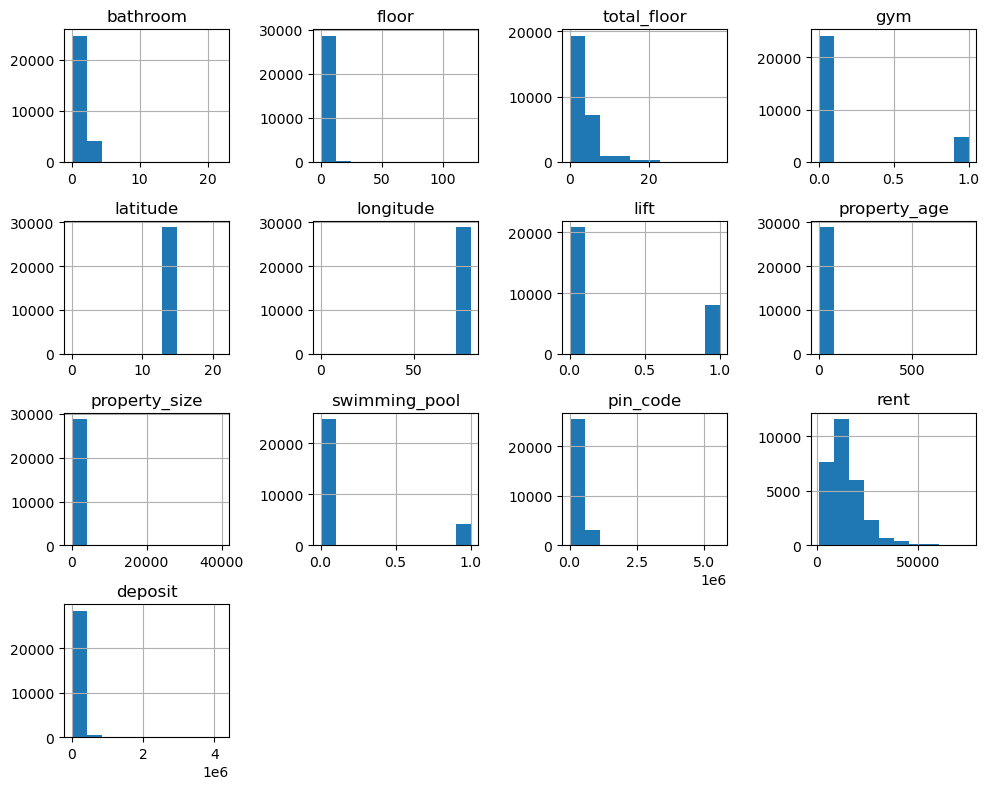

In [27]:
df_property.hist(figsize=(10,8))   # pandas plotting
plt.tight_layout()
plt.show();

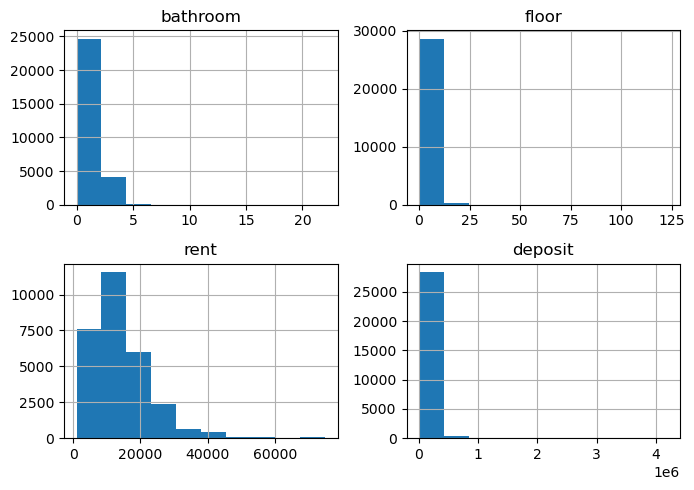

In [28]:
# can also select columns/features
df_property[['type', 'bathroom', 'floor', 'rent', 'deposit']].hist(figsize=(7,5))   # pandas plotting
plt.tight_layout()
plt.show();

## Continuous vs Discrete Columns/Features

In [29]:
df_property.shape

(28888, 21)

### Continuous Columns/Features

In [30]:
continuous_columns = df_property.select_dtypes(include=['int64', 'float64']).columns
continuous_columns

Index(['bathroom', 'floor', 'total_floor', 'gym', 'latitude', 'longitude',
       'lift', 'property_age', 'property_size', 'swimming_pool', 'pin_code',
       'rent', 'deposit'],
      dtype='object')

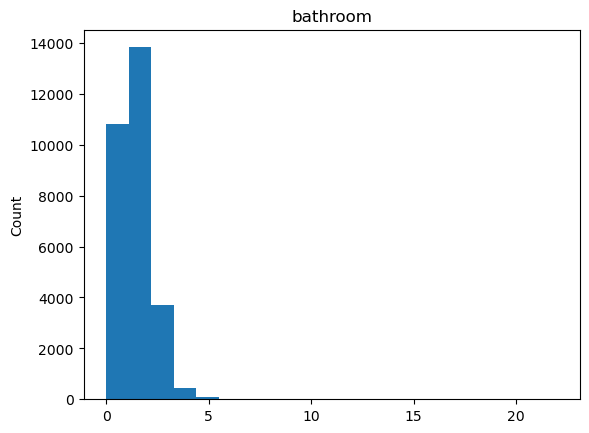

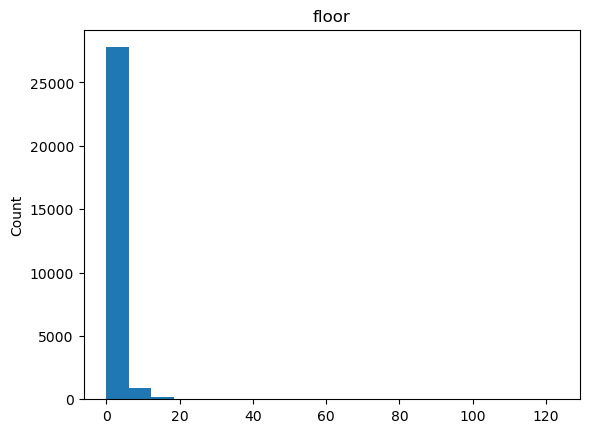

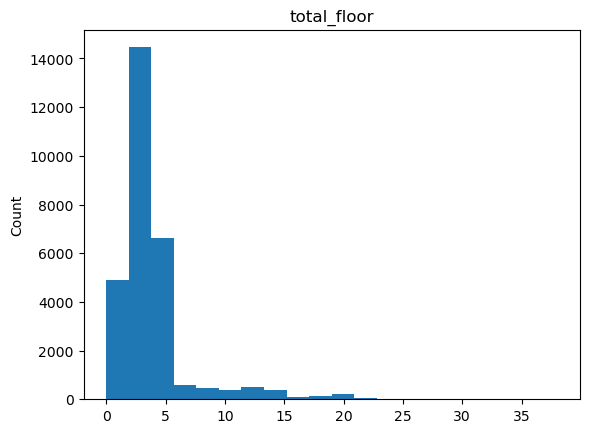

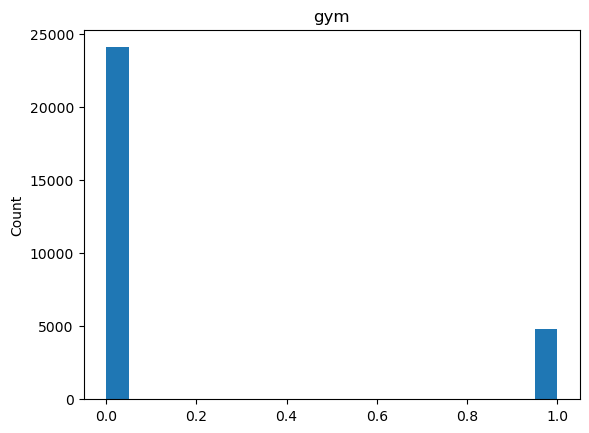

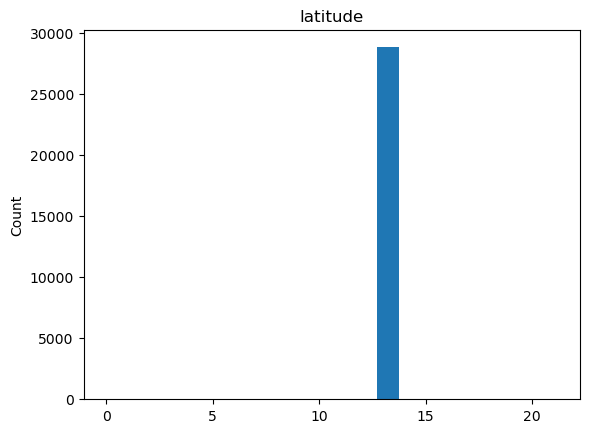

...

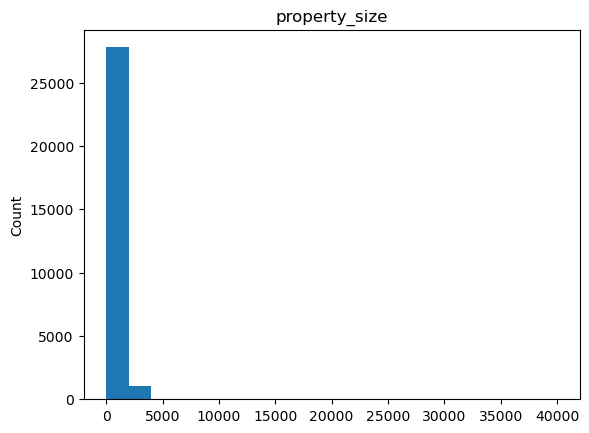

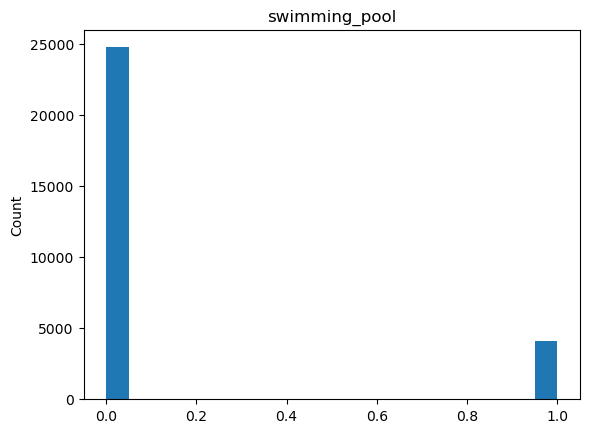

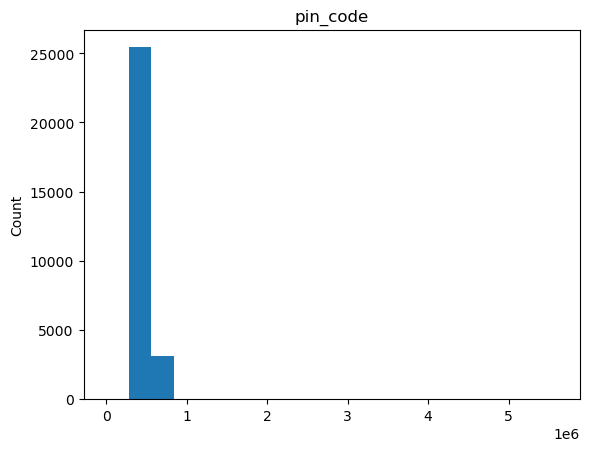

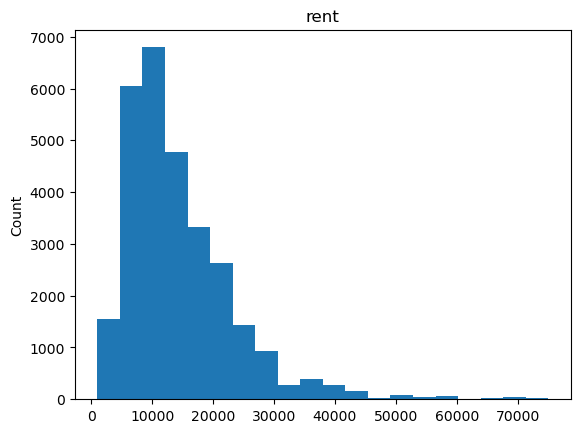

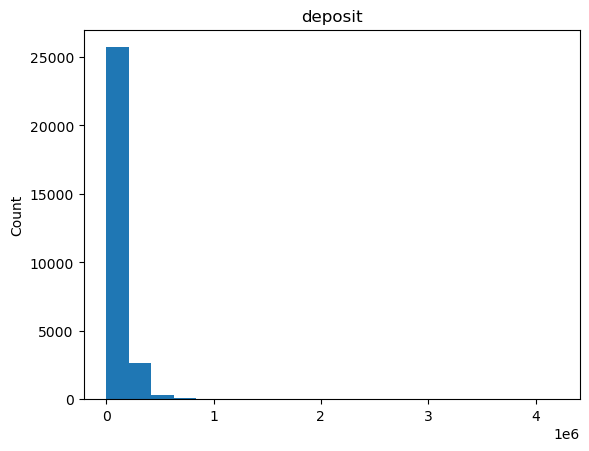

In [31]:
import matplotlib.pyplot as plt

for col in continuous_columns:
    _ = plt.hist(df_property[col], bins=20)
    _ = plt.ylabel('Count')
    _ = plt.title(col)
    _ = plt.show();

Notes:

+ Not correct!
+ This technique for identifying continuous features is not good.
+ For example, these are obviously binary: gym, lift, swimming_pool $\implies$ categorical.
+ Others are numeric, but have low cardinality $\implies$ categorical.
+ We will do better after we analyze each individual column/feature.

### Discrete Columns/Features

In [32]:
discrete_columns = df_property.select_dtypes(exclude=['int64', 'float64']).columns
discrete_columns

Index(['property_id', 'type', 'activation_date', 'furnishing', 'lease_type',
       'locality', 'parking', 'building_type'],
      dtype='object')

In [33]:
# for col in discrete_columns:
#     print(df_property[col].value_counts())

Notes:

+ Not correct!
+ This technique for identifying discrete features is not good.
+ For example, these are obviously binary: gym, lift, swimming_pool $\implies$ categorical.
+ Others are numeric, but have low cardinality $\implies$ categorical.
+ We will do better after we analyze each individual column/feature.

## Better Column/Feature Identification - human!

In [34]:
df_property.head()

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,lift,locality,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type
0,ff808081469fd6e20146a5af948000ea,BHK2,09-03-2017 14:36,1,3,4.0,SEMI_FURNISHED,1,12.876174,77.596571,...,1,Hulimavu,BOTH,2,850,1,560076.0,12000,120000,AP
1,ff8080814702d3d10147068359d200cd,BHK2,07-03-2017 12:02,2,4,11.0,SEMI_FURNISHED,1,13.018444,77.678122,...,1,Ramamurthy Nagar,BOTH,1,1233,1,560016.0,20000,150000,AP
2,ff808081470c645401470fb03f5800a6,BHK2,10-03-2017 13:43,2,0,4.0,NOT_FURNISHED,1,12.975072,77.665865,...,1,GM Palya,FOUR_WHEELER,0,1200,0,560075.0,15000,75000,AP
3,ff808081470c6454014715eaa5960281,BHK3,09-03-2017 22:16,2,3,4.0,SEMI_FURNISHED,0,12.888169,77.591282,...,0,Arakere,BOTH,1,1300,0,560076.0,17000,150000,AP
4,ff808081474aa867014771a0298f0aa6,BHK1,15-03-2017 18:29,1,1,2.0,SEMI_FURNISHED,0,12.990243,77.712962,...,0,Hoodi,BOTH,4,450,0,560048.0,6500,40000,IF


### GREAT

In [35]:
#with ed_utils.HiddenPrints():   # suppress print() output
with ed_utils.DummyContextManager():   # substitue this is you want to see all the print() below
    print(f'{df_property.shape = }')
    
    print('-'*95)
    
    print('                             num_')
    print('   column          dtype     nans  nunique  unique')
    print('-'*95)
    df_property_features = pd.DataFrame(columns=['column', 'dtype', 'num_nans', 'nunique', 'unique'])
    
    for index, col in enumerate(df_property.columns):
        record = []
        dtype = df_property[col].dtype
        num_nans = df_property[col].isna().sum()
        print(f'{index:2} {col:15} {str(dtype):8} {num_nans:5}', end='')
        record.extend([col, str(dtype), num_nans])
        try:
            nunique = df_property[col].nunique()
            print(f'{nunique:9,} ', end='')
            record.append(nunique)
            if nunique < 40:
                # cannot sort with Nan in sequence
                # so do not sort if nan is there
                try:
                    # "building_type" has problems with sorted() since there is NaN                
                    unique = sorted(df_property[col].unique())
                except:
                    unique = df_property[col].unique()
                print(f' {unique}')
                record.append(unique)
            else:
                print()
                record.append(float('nan'))
        except:
            print('unhandled exception')
        
        # print(record)
        df_property_features.loc[len(df_property_features)] = record


df_property_features


df_property.shape = (28888, 21)
-----------------------------------------------------------------------------------------------
                             num_
   column          dtype     nans  nunique  unique
-----------------------------------------------------------------------------------------------
 0 property_id     object       0   28,888 
 1 type            object       0        6  ['BHK1', 'BHK2', 'BHK3', 'BHK4', 'BHK4PLUS', 'RK1']
 2 activation_date object       0   18,534 
 3 bathroom        int64        0       15  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 20, 21, 22]
 4 floor           int64        0       29  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 123]
 5 total_floor     float64     43       36  [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, nan, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 34.0, 35.0, 38.0]
 6 f

,column,dtype,num_nans,nunique,unique
0,property_id,object,0,28888,NaN
1,type,object,0,6,"[BHK1, BHK2, BHK3, BHK4, BHK4PLUS, RK1]"
2,activation_date,object,0,18534,NaN
3,bathroom,int64,0,15,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 20, 21,..."
4,floor,int64,0,29,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
5,total_floor,float64,43,36,"[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ..."
6,furnishing,object,0,3,"[FULLY_FURNISHED, NOT_FURNISHED, SEMI_FURNISHED]"
7,gym,int64,0,2,"[0, 1]"
8,latitude,float64,0,26476,NaN
9,longitude,float64,0,26404,NaN


## 0 - "property_id"

+ property_id
    + str - unique - key
    + discrete - technically categorical, but high cardinality
    + no missing property_id
    + should not be dropped nor should property_id be binned since this is the key that ties together the 3 data files:
        + Property - "property_data_set.csv'
        + Request - "property_data_set.csv"
        + Images - "property_photos.csv"

In [36]:
df_property_features.query("column == 'property_id'")

,column,dtype,num_nans,nunique,unique
0,property_id,object,0,28888,NaN


### Duplicate "proprety_id"

In [37]:
df_property['property_id']

0        ff808081469fd6e20146a5af948000ea
1        ff8080814702d3d10147068359d200cd
2        ff808081470c645401470fb03f5800a6
3        ff808081470c6454014715eaa5960281
4        ff808081474aa867014771a0298f0aa6
                       ...               
28883    ff8081815b1fdda8015b1fe675ae0146
28884    ff8081815b1fdda8015b1ffee8a305d2
28885    ff8081815b1fdda8015b2000369205fd
28886    ff8081815b200540015b20158b0103c9
28887    ff8081815b2007fc015b201c77a20395
Name: property_id, Length: 28888, dtype: object

In [38]:
df_property['property_id'].nunique()

28888

Notes:

+ No duplicate "property_id" $\implies$ good, since this is the key we will join/merge with the other 2 data files.

## 1 - "type"

+ BHK type
    + Categorical - nominal
    + In real estate and housing, "BHK" typically refers to the number of bedrooms, hall, and kitchen in an apartment or house. For example:
        + 0.5BK: smaller than a standard-sized bedroom, a bath/toilet, and a kitchen
        + 1 BHK: One bedroom, one hall (living room), and one kitchen.
        + 2 BHK: Two bedrooms, one hall, and one kitchen.
        + 3 BHK: Three bedrooms, one hall, and one kitchen.
        + 4 BHK:
        + BHK4PLUS:
        + 1 RK: 1 room and 1 kitchen. There is no hall in a 1 RK. Also, 1RK has a lower space compared to a 1BHK. Bachelors prefer to rent 1RK more than 1BHK as they are cost-effective.

In [39]:
df_property.head()

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,lift,locality,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type
0,ff808081469fd6e20146a5af948000ea,BHK2,09-03-2017 14:36,1,3,4.0,SEMI_FURNISHED,1,12.876174,77.596571,...,1,Hulimavu,BOTH,2,850,1,560076.0,12000,120000,AP
1,ff8080814702d3d10147068359d200cd,BHK2,07-03-2017 12:02,2,4,11.0,SEMI_FURNISHED,1,13.018444,77.678122,...,1,Ramamurthy Nagar,BOTH,1,1233,1,560016.0,20000,150000,AP
2,ff808081470c645401470fb03f5800a6,BHK2,10-03-2017 13:43,2,0,4.0,NOT_FURNISHED,1,12.975072,77.665865,...,1,GM Palya,FOUR_WHEELER,0,1200,0,560075.0,15000,75000,AP
3,ff808081470c6454014715eaa5960281,BHK3,09-03-2017 22:16,2,3,4.0,SEMI_FURNISHED,0,12.888169,77.591282,...,0,Arakere,BOTH,1,1300,0,560076.0,17000,150000,AP
4,ff808081474aa867014771a0298f0aa6,BHK1,15-03-2017 18:29,1,1,2.0,SEMI_FURNISHED,0,12.990243,77.712962,...,0,Hoodi,BOTH,4,450,0,560048.0,6500,40000,IF


In [40]:
df_property_features.query("column == 'type'")

,column,dtype,num_nans,nunique,unique
1,type,object,0,6,"[BHK1, BHK2, BHK3, BHK4, BHK4PLUS, RK1]"


In [41]:
df_property['type'].nunique()

6

In [42]:
sorted(df_property['type'].unique())

['BHK1', 'BHK2', 'BHK3', 'BHK4', 'BHK4PLUS', 'RK1']

In [43]:
vc_type = df_property['type'].value_counts()
vc_type

BHK2        14071
BHK1         6565
BHK3         5725
RK1          2015
BHK4          440
BHK4PLUS       72
Name: type, dtype: int64

In [44]:
type(vc_type)

pandas.core.series.Series

In [45]:
vc_type.shape

(6,)

In [46]:
vc_type.index

Index(['BHK2', 'BHK1', 'BHK3', 'RK1', 'BHK4', 'BHK4PLUS'], dtype='object')

In [47]:
vc_type.values

array([14071,  6565,  5725,  2015,   440,    72], dtype=int64)

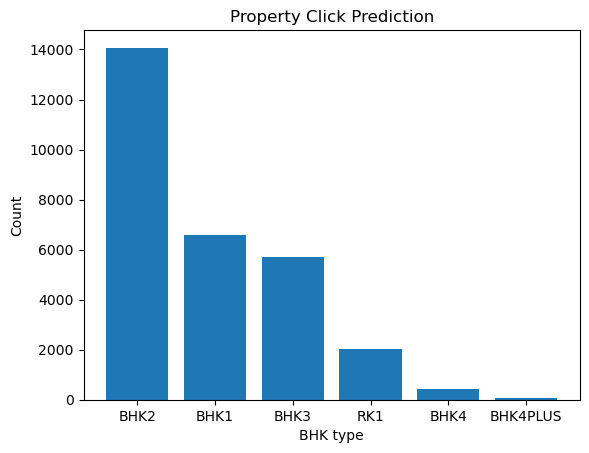

In [48]:
plt.bar(vc_type.index, vc_type.values)
plt.xlabel('BHK type')
plt.ylabel('Count')
plt.title('Property Click Prediction')
plt.show();

+ Better, cleaner.
+ Plus, save the chart/graph as a file.

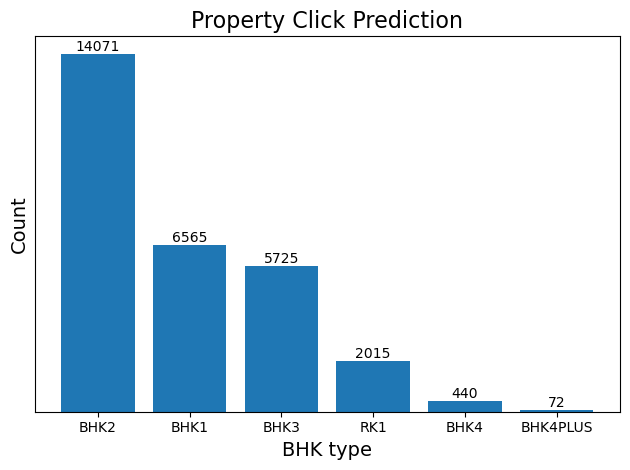

In [49]:
import matplotlib.pyplot as plt


# Create the bar plot
plt.bar(vc_type.index, vc_type.values)

# Add count labels on top of each bar
for i, v in enumerate(vc_type.values):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.xlabel('BHK type', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Property Click Prediction', fontsize=16)
# plt.xticks(rotation=45)  # Rotate x-axis labels if needed
# Remove y-axis ticks
plt.yticks([])   # no yticks
plt.tight_layout()  # Ensure labels are not cut off

plt.savefig('temp.type.png',
            # dpi=1000
           )

plt.show();


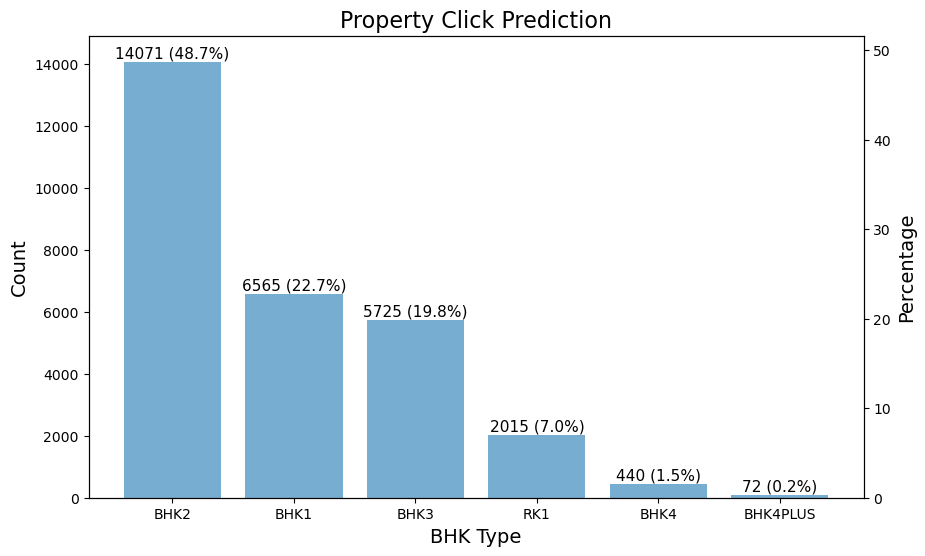

In [50]:
plot_bar_categorical(dict(vc_type),
                     title='Property Click Prediction',
                     xlabel='BHK Type',
                    )

### Feature Extraction

In [51]:
def map_bedroom_type(type):
    bedroom_type_mapping = {
        'BHK1': 1,
        'BHK2': 2,
        'BHK3': 3,
        'BHK4': 4,
        'BHK4PLUS': 5,
        'RK1': 0
    }

    # Use get() method to handle cases where the type is not in the dictionary
    return bedroom_type_mapping.get(type, None)

# Example usage
bedroom_types = ['BHK2', 'BHK1', 'BHK3', 'RK1', 'BHK4', 'BHK4PLUS']
mapped_values = [map_bedroom_type(bhk) for bhk in bedroom_types]

print(mapped_values)


[2, 1, 3, 0, 4, 5]


In [52]:
# Creating Bedroom column
df_property["bedroom"] = df_property['type'].apply(map_bedroom_type)
df_property[['type',"bedroom"]]


,type,bedroom
0,BHK2,2
1,BHK2,2
2,BHK2,2
3,BHK3,3
4,BHK1,1
...,...,...
28883,BHK2,2
28884,BHK3,3
28885,BHK2,2
28886,BHK2,2


In [53]:
df_property[df_property["type"] == "RK1"]

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,locality,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type,bedroom
11,ff80808147ed5e680147f326ca4c02d2,RK1,07-02-2017 16:10,2,3,3.0,SEMI_FURNISHED,0,12.983430,77.643376,...,Indira Nagar,TWO_WHEELER,10,200,0,560038.0,6500,20000,IF,0
22,ff808081485677b101485a6921bd01ae,RK1,18-02-2017 16:07,1,3,3.0,NOT_FURNISHED,0,12.954545,77.738749,...,Whitefield,BOTH,0,500,0,560066.0,7000,30000,IF,0
53,ff80808149393cef014960f1e0fb16d4,RK1,04-03-2017 14:33,1,2,2.0,SEMI_FURNISHED,0,12.928378,77.626491,...,Koramangala,TWO_WHEELER,10,280,0,560030.0,8500,51000,IF,0
89,ff8080814b317233014b350040fd0296,RK1,10-03-2017 13:49,1,4,4.0,SEMI_FURNISHED,0,12.878760,77.638318,...,Singasandra,TWO_WHEELER,0,300,0,560068.0,5500,35000,IF,0
126,ff8081814bd62607014bd94d014f03f0,RK1,19-02-2017 10:59,1,4,4.0,NOT_FURNISHED,0,12.922365,77.619699,...,Madiwala,TWO_WHEELER,5,150,0,560034.0,7500,15000,IF,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28810,ff8081815b1ebf9e015b1ec53bf4025a,RK1,30-03-2017 16:05,1,3,3.0,SEMI_FURNISHED,0,13.009558,77.635160,...,"Ramaswamipalya,Lingarajapuram",TWO_WHEELER,0,250,0,560084.0,7000,70000,IF,0
28817,ff8081815b1ebf9e015b1eea48791127,RK1,30-03-2017 16:55,1,1,1.0,NOT_FURNISHED,0,13.022340,77.632546,...,"Krishnappa Layout,Kacharakanahalli",BOTH,10,300,0,560043.0,4000,40000,IF,0
28818,ff8081815b1ebf9e015b1eeb2ca41177,RK1,30-03-2017 17:37,1,3,3.0,SEMI_FURNISHED,0,12.938229,77.747433,...,Varthur,TWO_WHEELER,1,450,0,560087.0,6500,25000,AP,0
28834,ff8081815b1ebf9e015b1f2785402d01,RK1,30-03-2017 18:00,1,4,4.0,NOT_FURNISHED,0,12.972196,77.497594,...,Srigandada Kaval,TWO_WHEELER,0,350,0,560091.0,4000,40000,IF,0


In [54]:
def map_hall_type(type):
    hall_type_mapping = {
        'BHK1': 1,
        'BHK2': 1,
        'BHK3': 1,
        'BHK4': 1,
        'BHK4PLUS': 1,
        'RK1': 0
    }

    # Use get() method to handle cases where the type is not in the dictionary
    return hall_type_mapping.get(type, None)

# Example usage
hall_types = ['BHK2', 'BHK1', 'BHK3', 'RK1', 'BHK4', 'BHK4PLUS']
mapped_values = [map_hall_type(bhk) for bhk in hall_types]

print(mapped_values)


[1, 1, 1, 0, 1, 1]


In [55]:
# Creating Hall column
df_property["hall"] = df_property['type'].apply(map_hall_type)
df_property[['type', "bedroom", "hall"]]

,type,bedroom,hall
0,BHK2,2,1
1,BHK2,2,1
2,BHK2,2,1
3,BHK3,3,1
4,BHK1,1,1
...,...,...,...
28883,BHK2,2,1
28884,BHK3,3,1
28885,BHK2,2,1
28886,BHK2,2,1


In [56]:
df_property[df_property["type"] == "RK1"]

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type,bedroom,hall
11,ff80808147ed5e680147f326ca4c02d2,RK1,07-02-2017 16:10,2,3,3.0,SEMI_FURNISHED,0,12.983430,77.643376,...,TWO_WHEELER,10,200,0,560038.0,6500,20000,IF,0,0
22,ff808081485677b101485a6921bd01ae,RK1,18-02-2017 16:07,1,3,3.0,NOT_FURNISHED,0,12.954545,77.738749,...,BOTH,0,500,0,560066.0,7000,30000,IF,0,0
53,ff80808149393cef014960f1e0fb16d4,RK1,04-03-2017 14:33,1,2,2.0,SEMI_FURNISHED,0,12.928378,77.626491,...,TWO_WHEELER,10,280,0,560030.0,8500,51000,IF,0,0
89,ff8080814b317233014b350040fd0296,RK1,10-03-2017 13:49,1,4,4.0,SEMI_FURNISHED,0,12.878760,77.638318,...,TWO_WHEELER,0,300,0,560068.0,5500,35000,IF,0,0
126,ff8081814bd62607014bd94d014f03f0,RK1,19-02-2017 10:59,1,4,4.0,NOT_FURNISHED,0,12.922365,77.619699,...,TWO_WHEELER,5,150,0,560034.0,7500,15000,IF,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28810,ff8081815b1ebf9e015b1ec53bf4025a,RK1,30-03-2017 16:05,1,3,3.0,SEMI_FURNISHED,0,13.009558,77.635160,...,TWO_WHEELER,0,250,0,560084.0,7000,70000,IF,0,0
28817,ff8081815b1ebf9e015b1eea48791127,RK1,30-03-2017 16:55,1,1,1.0,NOT_FURNISHED,0,13.022340,77.632546,...,BOTH,10,300,0,560043.0,4000,40000,IF,0,0
28818,ff8081815b1ebf9e015b1eeb2ca41177,RK1,30-03-2017 17:37,1,3,3.0,SEMI_FURNISHED,0,12.938229,77.747433,...,TWO_WHEELER,1,450,0,560087.0,6500,25000,AP,0,0
28834,ff8081815b1ebf9e015b1f2785402d01,RK1,30-03-2017 18:00,1,4,4.0,NOT_FURNISHED,0,12.972196,77.497594,...,TWO_WHEELER,0,350,0,560091.0,4000,40000,IF,0,0


## 2 - "activation_date"

+ continuous, not discrete
+ convert to `pandas` datetime dtype

In [57]:
df_property_features.query("column == 'activation_date'")

,column,dtype,num_nans,nunique,unique
2,activation_date,object,0,18534,NaN


In [58]:
df_property['activation_date'].dtype

dtype('O')

any blank "activation_date'

In [59]:
df_property['activation_date'].isna().sum()

0

Notes:

+ no missing "activation_date"

In [60]:
df_property['activation_date']

0        09-03-2017 14:36
1        07-03-2017 12:02
2        10-03-2017 13:43
3        09-03-2017 22:16
4        15-03-2017 18:29
               ...       
28883    30-03-2017 21:42
28884    30-03-2017 22:14
28885    30-03-2017 21:47
28886    30-03-2017 22:30
28887    30-03-2017 22:33
Name: activation_date, Length: 28888, dtype: object

Notes:

+ Convert to `pandas` datetime dtype, but note the special format of the datetime in the original column/feature.
+ The order is "day-month-year 24hour:minute" (hint: look at record with index=4).

In [61]:
df_property['activation_date'] = pd.to_datetime(df_property['activation_date'],
                                                format="%d-%m-%Y %H:%M")

In [62]:
df_property

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type,bedroom,hall
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4.0,SEMI_FURNISHED,1,12.876174,77.596571,...,BOTH,2,850,1,560076.0,12000,120000,AP,2,1
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11.0,SEMI_FURNISHED,1,13.018444,77.678122,...,BOTH,1,1233,1,560016.0,20000,150000,AP,2,1
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4.0,NOT_FURNISHED,1,12.975072,77.665865,...,FOUR_WHEELER,0,1200,0,560075.0,15000,75000,AP,2,1
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4.0,SEMI_FURNISHED,0,12.888169,77.591282,...,BOTH,1,1300,0,560076.0,17000,150000,AP,3,1
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2.0,SEMI_FURNISHED,0,12.990243,77.712962,...,BOTH,4,450,0,560048.0,6500,40000,IF,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2.0,SEMI_FURNISHED,0,12.942613,77.621890,...,BOTH,15,1200,0,560030.0,23000,200000,IF,2,1
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3.0,SEMI_FURNISHED,0,12.906331,77.591790,...,BOTH,8,1310,0,560078.0,22000,125000,AP,3,1
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14.0,SEMI_FURNISHED,1,12.904363,77.526863,...,BOTH,0,975,1,NaN,12500,50000,AP,2,1
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2.0,SEMI_FURNISHED,0,12.938007,77.629097,...,TWO_WHEELER,5,600,0,560034.0,14000,80000,IF,2,1


In [63]:
df_property.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28888 entries, 0 to 28887
Data columns (total 23 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   property_id      28888 non-null  object        
 1   type             28888 non-null  object        
 2   activation_date  28888 non-null  datetime64[ns]
 3   bathroom         28888 non-null  int64         
 4   floor            28888 non-null  int64         
 5   total_floor      28845 non-null  float64       
 6   furnishing       28888 non-null  object        
 7   gym              28888 non-null  int64         
 8   latitude         28888 non-null  float64       
 9   longitude        28888 non-null  float64       
 10  lease_type       28888 non-null  object        
 11  lift             28888 non-null  int64         
 12  locality         28888 non-null  object        
 13  parking          28888 non-null  object        
 14  property_age     28888 non-null  int64

Check by exploring the `pandas` datetime capabilities on record with index=0.

In [64]:
dt = df_property.iloc[0]['activation_date']
dt

Timestamp('2017-03-09 14:36:00')

In [65]:
dt.day

9

In [66]:
dt.month

3

In [67]:
dt.year

2017

In [68]:
dt.hour

14

In [69]:
dt.minute

36

When were these "activation_date" data collected?

In [70]:
df_property['activation_date']

0       2017-03-09 14:36:00
1       2017-03-07 12:02:00
2       2017-03-10 13:43:00
3       2017-03-09 22:16:00
4       2017-03-15 18:29:00
                ...        
28883   2017-03-30 21:42:00
28884   2017-03-30 22:14:00
28885   2017-03-30 21:47:00
28886   2017-03-30 22:30:00
28887   2017-03-30 22:33:00
Name: activation_date, Length: 28888, dtype: datetime64[ns]

In [71]:
df_property['activation_date'].dt.month.unique()

array([3, 2], dtype=int64)

In [72]:
df_property['activation_date'].dt.year.unique()

array([2017], dtype=int64)

Notes:

+ "property_data_set.csv' has "activation_date" only from February 2017 and March 2017
+ Roughly balanced between February 2017 and March 2017.

In [73]:
df_property['activation_date'].dt.month.value_counts()

3    16036
2    12852
Name: activation_date, dtype: int64

In [74]:
df_property['activation_date'].dt.year.value_counts()

2017    28888
Name: activation_date, dtype: int64

## 3 - "bathroom"

+ bathroom
    + discrete/categorical - 15 unique integers
    + no missing values

In [75]:
df_property_features.query("column == 'bathroom'")

,column,dtype,num_nans,nunique,unique
3,bathroom,int64,0,15,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 20, 21,..."


In [76]:
sorted(df_property['bathroom'].unique())

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 20, 21, 22]

In [77]:
cat_bathroom = df_property_features.query("column == 'bathroom'")['unique'].tolist()[0]
# or
cat_bathroom2 = sorted(df_property['bathroom'].unique())

cat_bathroom
cat_bathroom2
cat_bathroom == cat_bathroom2

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 20, 21, 22]

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 20, 21, 22]

True

In [78]:
vc_bathroom = df_property['bathroom'].value_counts()
vc_bathroom

2     13827
1     10807
3      3696
4       433
5        75
0        24
6        15
7         3
10        2
21        1
22        1
12        1
20        1
8         1
9         1
Name: bathroom, dtype: int64

In [79]:
# demo/test

# Convert the index to strings
# x_labels is the str version of the xticks
# this is to prevent the matplolib bar() method from ordering numeric x values numerically
# i.e. want to preserve the order in the given data x values, so it is from highest count (most frequent) to least

# same, but dramatically different run times

x_labels = [str(label) for label in vc_bathroom.index]   # ~4 µs
# or
x_labels2 = vc_bathroom.index.to_series().apply(str)   # ~310 µs, to_series() taks a lot of time
# or
x_labels3 = vc_bathroom.index.astype(str)   # ~60 µs

(x_labels == x_labels2).all()
(x_labels2 == x_labels3).all()


True

True

In [80]:
%%timeit
[str(label) for label in vc_bathroom.index]

5.41 µs ± 295 ns per loop (mean ± std. dev. of 7 runs, 100,000 loops each)


In [81]:
%%timeit
vc_bathroom.index.to_series().apply(str)

252 µs ± 13.2 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


In [82]:
%%timeit
vc_bathroom.index.astype(str)

90.4 µs ± 12.2 µs per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


In [83]:
# Convert the index to strings
# x_labels is the str version of the xticks
# this is to prevent the matplolib bar() method from ordering numeric x values numerically
# i.e. want to preserve the order in the given data x values, so it is from highest count (most frequent) to least
x_labels = [str(label) for label in vc_bathroom.index]


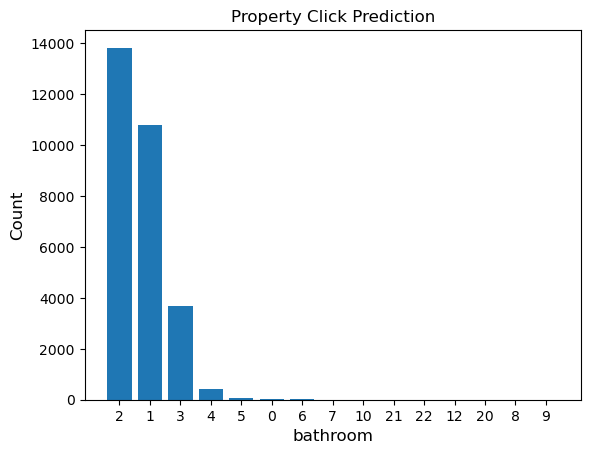

In [84]:
plt.bar(x_labels, vc_bathroom.values)
plt.xlabel('bathroom', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Property Click Prediction', fontsize=12)
plt.show();

Put count at the top of each bar.

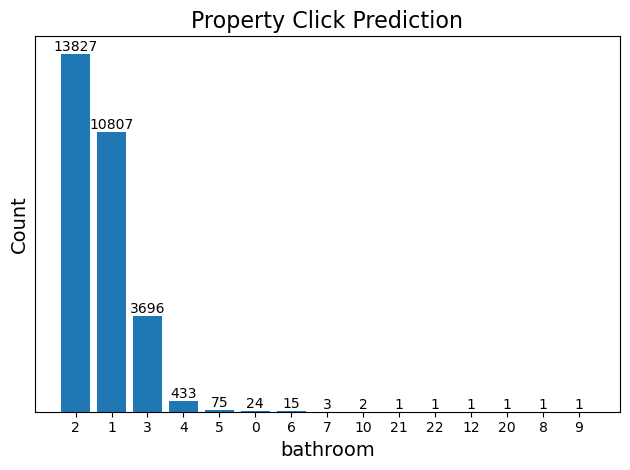

In [85]:
# Create the bar plot
plt.bar(x_labels, vc_bathroom.values)

# Add count labels on top of each bar
for i, v in enumerate(vc_bathroom.values):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.xlabel('bathroom', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Property Click Prediction', fontsize=16)
# plt.xticks(rotation=45)  # Rotate x-axis labels if needed
# Remove y-axis ticks
plt.yticks([])   # no yticks
plt.tight_layout()  # Ensure labels are not cut off

plt.savefig('temp.bathroom.png',
            # dpi=1000
           )

plt.show();


Put count and percentage at the top of each bar.

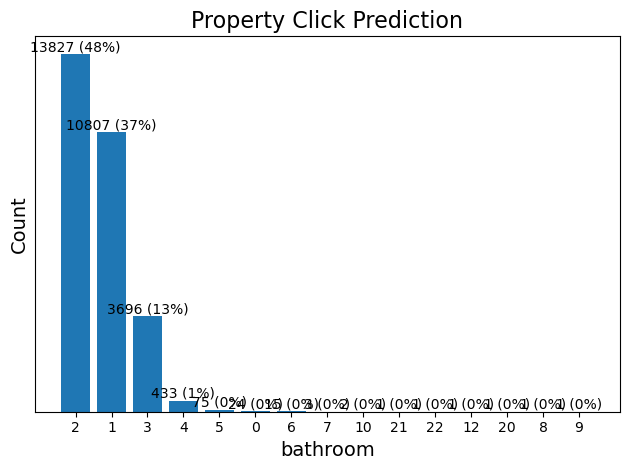

In [86]:
# Convert the index to strings
x_labels = vc_bathroom.index.astype(str)

# Create the bar plot
plt.bar(x_labels, vc_bathroom.values)

# Calculate percentages
total = vc_bathroom.sum()
percentages = [(v / total) * 100 for v in vc_bathroom.values]

# Add count and percentage labels on top of each bar
for i, (v, p) in enumerate(zip(vc_bathroom.values, percentages)):
    plt.text(i, v, f'{v} ({p:0.0f}%)', ha='center', va='bottom')   # round percentage to 0 decimal places
    # plt.text(i, v, f'{v} ({p:0.1f}%)', ha='center', va='bottom')   # round percentage to 1 decimal places

plt.xlabel('bathroom', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Property Click Prediction', fontsize=16)
plt.yticks([])  # Remove y-axis ticks
plt.tight_layout()

plt.savefig('temp.bathroom.png',
            # dpi=1000
           )

plt.show();


In [87]:
# help(plot_bar_categorical)

In [88]:
vc_bathroom = df_property['bathroom'].value_counts()
vc_bathroom

2     13827
1     10807
3      3696
4       433
5        75
0        24
6        15
7         3
10        2
21        1
22        1
12        1
20        1
8         1
9         1
Name: bathroom, dtype: int64

In [89]:
N = vc_bathroom.sum()
N

28888

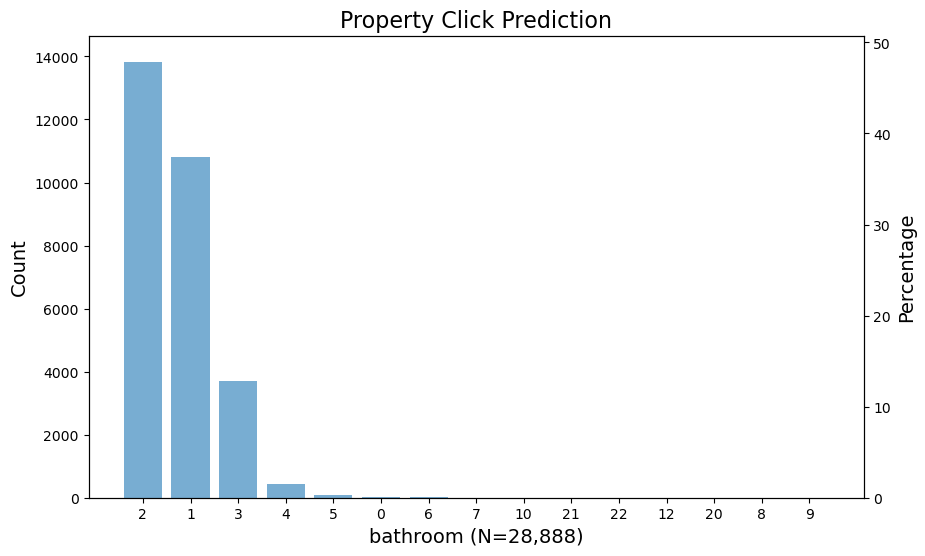

In [90]:
plot_bar_categorical(dict(vc_bathroom),
                     title='Property Click Prediction',
                     xlabel=f'bathroom ({N=:,})',
                     bar_annotation_type=None,
                    )

In [91]:
n_largest = 8

In [92]:
vc_bathroom_n_largest = dict(list(vc_bathroom.items())[:n_largest])
vc_bathroom_n_largest

{2: 13827, 1: 10807, 3: 3696, 4: 433, 5: 75, 0: 24, 6: 15, 7: 3}

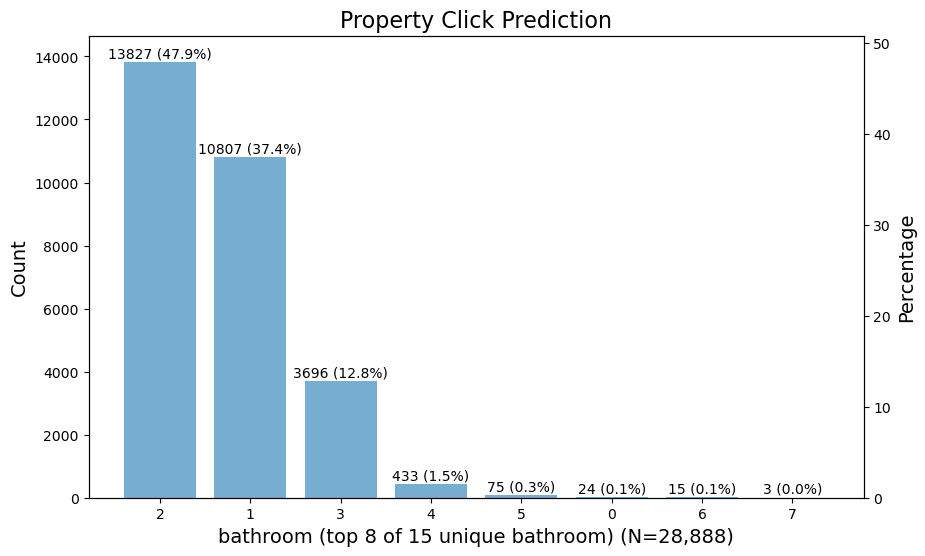

In [93]:
plot_bar_categorical(dict(vc_bathroom_n_largest),
                     title='Property Click Prediction',
                     # xlabel=f'bathroom ({N=:,})',
                     xlabel=f'bathroom (top {n_largest} of {len(vc_bathroom):,} unique bathroom) ({N=:,})',
                     fontsize_top_of_bar=10
                    )

In [94]:
%ls -l temp*

 Volume in drive C is OS
 Volume Serial Number is A240-F140

 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction


 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction

12/02/2023  05:19 PM            25,085 temp.bathroom.png
11/29/2023  09:00 PM         1,106,116 temp.map.html
12/02/2023  05:19 PM            18,167 temp.type.png
               3 File(s)      1,149,368 bytes
               0 Dir(s)  194,532,020,224 bytes free


## 4 - "floor"

+ floor
    + discrete integers - categorical, 29 unique values
    + no missing values
    + can covert dtype to uint8

In [95]:
df_property_features.query("column == 'floor'")

,column,dtype,num_nans,nunique,unique
4,floor,int64,0,29,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."


In [96]:
cat_floor = sorted(df_property['floor'].unique())
print(cat_floor)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 123]


Notes:

+ can change dtype to uint8

In [97]:
category_floor = df_property_features.query("column == 'floor'")['unique'].tolist()[0]
# or
category_floor2 = sorted(df_property['floor'].unique())

print(f'{category_floor = }')
print(f'{category_floor2 = }')
print(f'{category_floor == category_floor2 = }')

category_floor = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 123]
category_floor2 = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 123]
category_floor == category_floor2 = True


In [98]:
vc_floor = df_property['floor'].value_counts()
vc_floor

1      8035
0      7982
2      6327
3      3397
4      1414
5       348
6       268
7       224
8       175
9       160
10      118
11      118
12       89
14       52
13       45
15       37
16       28
17       22
18       17
19       15
20        4
21        3
25        2
27        2
24        2
123       1
26        1
22        1
28        1
Name: floor, dtype: int64

In [99]:
N = vc_floor.sum()
N

28888

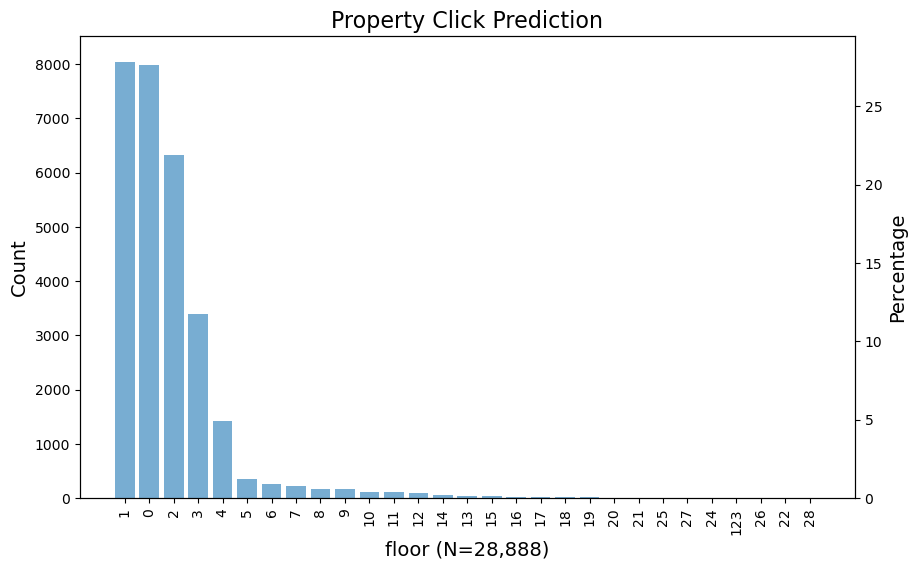

In [100]:
plot_bar_categorical(dict(vc_floor),
                     title='Property Click Prediction',
                     xlabel=f'floor ({N=:,})',
                     xtick_rotation=90,
                     bar_annotation_type=None,
                    )

## 5 - "total_floor"

+ total_floor
   + real values integers - categorical, 36 unique values
   + 43 missing values - WHAT TO IMPUTE?  OR DROP?
   + Change the NaN to a unique 'sentinel" value; maybe -1 or 36, then convert the dtype to uint8

In [101]:
df_property_features.query("column == 'total_floor'")

,column,dtype,num_nans,nunique,unique
5,total_floor,float64,43,36,"[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ..."


In [102]:
print(sorted(df_property['total_floor'].unique()))

[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, nan, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 34.0, 35.0, 38.0]


In [103]:
vc_total_floor = df_property['total_floor'].value_counts()
vc_total_floor

2.0     8208
3.0     6250
4.0     5163
1.0     4056
5.0     1450
0.0      831
7.0      332
14.0     300
12.0     298
8.0      280
6.0      250
13.0     217
10.0     198
9.0      192
11.0     179
19.0     138
18.0     136
15.0     100
20.0      63
16.0      50
17.0      42
21.0      34
23.0      18
22.0      14
27.0      14
24.0       9
26.0       6
25.0       5
32.0       2
30.0       2
35.0       2
29.0       2
34.0       1
31.0       1
28.0       1
38.0       1
Name: total_floor, dtype: int64

In [104]:
# Replace NaN values in the 'total_floor' column with a specific value, e.g., -1
df_property['total_floor'] = df_property['total_floor'].fillna(-1)

In [105]:
df_property['total_floor'].isna().sum()

0

In [106]:
df_property['total_floor'] = df_property['total_floor'].astype("int")

In [107]:
vc_total_floor = df_property['total_floor'].value_counts()

In [108]:
N = vc_total_floor.sum()
N

28888

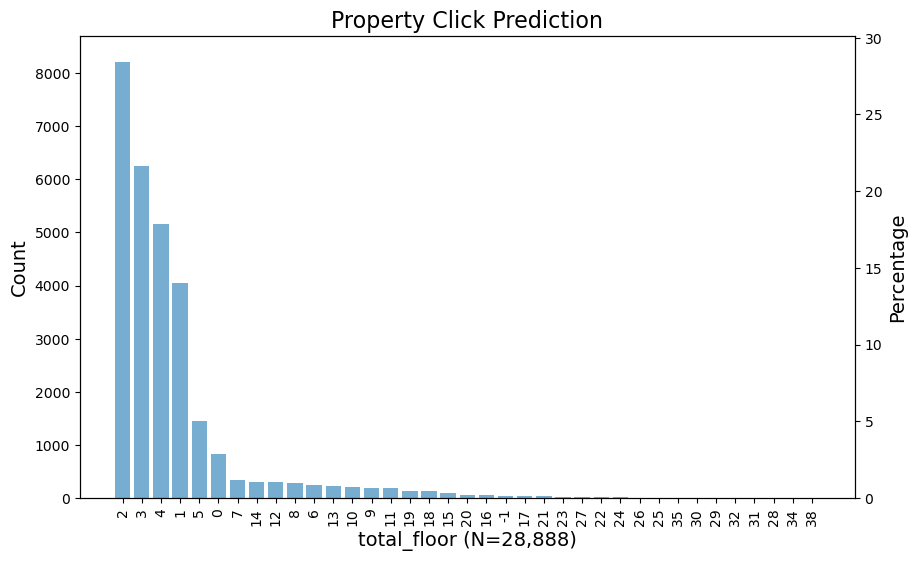

In [109]:
plot_bar_categorical(dict(vc_total_floor),
                     title='Property Click Prediction',
                     xlabel=f'total_floor ({N=:,})',
                     xtick_rotation=90,
                     bar_annotation_type=None,
                    )

## 6 - "furnishing"

+ furnishing
    + discrete - categorical - 3 classes
    + nominal

In [110]:
df_property_features.query("column == 'furnishing'")

,column,dtype,num_nans,nunique,unique
6,furnishing,object,0,3,"[FULLY_FURNISHED, NOT_FURNISHED, SEMI_FURNISHED]"


In [111]:
vc_furnishing = df_property['furnishing'].value_counts()
vc_furnishing

SEMI_FURNISHED     22463
NOT_FURNISHED       4863
FULLY_FURNISHED     1562
Name: furnishing, dtype: int64

In [112]:
N = vc_furnishing.sum()
N

28888

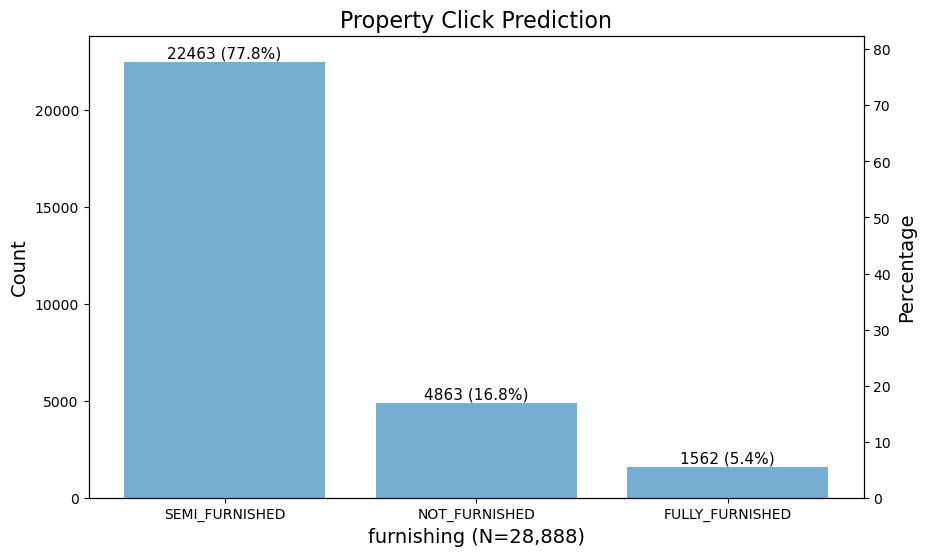

In [113]:
plot_bar_categorical(dict(vc_furnishing),
                     title='Property Click Prediction',
                     xlabel=f'furnishing ({N=:,})',
                    )

### Feature encoding

In [114]:
help(pd.get_dummies)

Help on function get_dummies in module pandas.core.reshape.encoding:

get_dummies(data, prefix=None, prefix_sep='_', dummy_na: 'bool' = False, columns=None, sparse: 'bool' = False, drop_first: 'bool' = False, dtype: 'Dtype | None' = None) -> 'DataFrame'
    Convert categorical variable into dummy/indicator variables.
    
    Parameters
    ----------
    data : array-like, Series, or DataFrame
        Data of which to get dummy indicators.
    prefix : str, list of str, or dict of str, default None
        String to append DataFrame column names.
        Pass a list with length equal to the number of columns
        when calling get_dummies on a DataFrame. Alternatively, `prefix`
        can be a dictionary mapping column names to prefixes.
    prefix_sep : str, default '_'
        If appending prefix, separator/delimiter to use. Or pass a
        list or dictionary as with `prefix`.
    dummy_na : bool, default False
        Add a column to indicate NaNs, if False NaNs are ignored.
 

In [115]:
import pandas as pd

# Example data
#furnishing = {'color': ['red', 'green', 'blue', 'red', 'blue', 'green', 'red', 'green', 'blue', 'red']}
#df_property[""] = pd.DataFrame(df_property["furnishing"])

# One hot encode the "color" feature
one_hot_encoded = pd.get_dummies(df_property['furnishing'], prefix='furnishing')

# Concatenate the one hot encoded columns with the original dataframe
df_encoded = pd.concat([df_property, one_hot_encoded], axis=1)

# Drop one of the encoded columns, for example, 'furnishing_blue'
df_encoded = df_encoded.drop('furnishing_NOT_FURNISHED', axis=1)

df_encoded

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,property_size,swimming_pool,pin_code,rent,deposit,building_type,bedroom,hall,furnishing_FULLY_FURNISHED,furnishing_SEMI_FURNISHED
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,850,1,560076.0,12000,120000,AP,2,1,0,1
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,1233,1,560016.0,20000,150000,AP,2,1,0,1
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,1200,0,560075.0,15000,75000,AP,2,1,0,0
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4,SEMI_FURNISHED,0,12.888169,77.591282,...,1300,0,560076.0,17000,150000,AP,3,1,0,1
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2,SEMI_FURNISHED,0,12.990243,77.712962,...,450,0,560048.0,6500,40000,IF,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2,SEMI_FURNISHED,0,12.942613,77.621890,...,1200,0,560030.0,23000,200000,IF,2,1,0,1
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3,SEMI_FURNISHED,0,12.906331,77.591790,...,1310,0,560078.0,22000,125000,AP,3,1,0,1
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14,SEMI_FURNISHED,1,12.904363,77.526863,...,975,1,NaN,12500,50000,AP,2,1,0,1
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,600,0,560034.0,14000,80000,IF,2,1,0,1


## 7 - "gym"

+ gym
    + discrete - categorical, 2 classes

In [116]:
df_property_features.query("column == 'gym'")

,column,dtype,num_nans,nunique,unique
7,gym,int64,0,2,"[0, 1]"


In [117]:
vc_gym = df_property['gym'].value_counts()
vc_gym

0    24094
1     4794
Name: gym, dtype: int64

In [118]:
N = vc_gym.sum()
N

28888

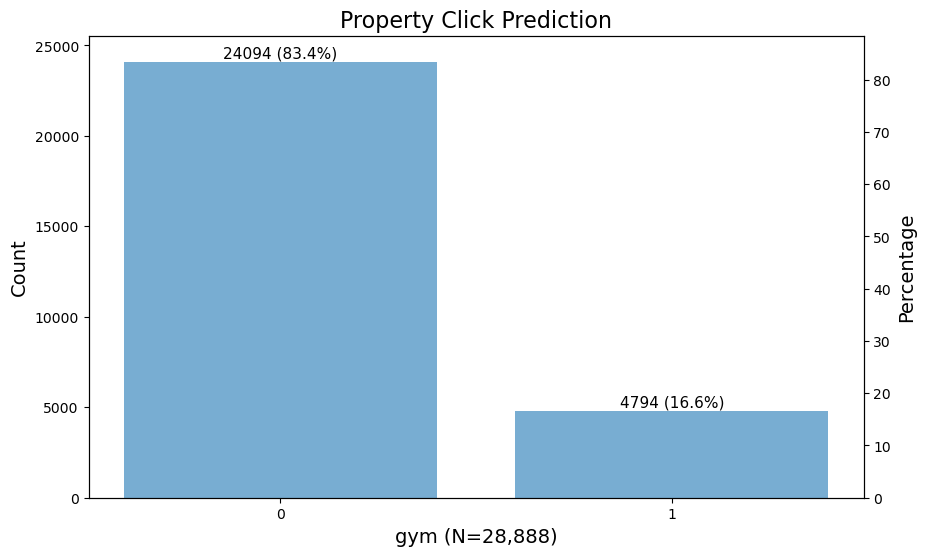

In [119]:
plot_bar_categorical(dict(vc_gym),
                     title='Property Click Prediction',
                     xlabel=f'gym ({N=:,})',
                    )

## 8 - "latitude"
## 9 - "longitude"

+ latitude
    + continuous - float64
    + -90 ≤ latitude ≤ 90
    + [-90, 90]
+ logitude
    + continuous - float64
    + -180 ≤ latitude ≤ 180
    + [-180, 180]


### "latitude"

In [120]:
df_property_features.query("column == 'latitude'")

,column,dtype,num_nans,nunique,unique
8,latitude,float64,0,26476,NaN


Check that all "latitude" values are legitimte.

In [121]:
# Apply the is_latitude() function to the 'latitude' column
# df_property['latitude_is_valid'] = df_property['latitude'].apply(is_latitude)
df_property['latitude'].apply(is_latitude)

0        True
1        True
2        True
3        True
4        True
         ... 
28883    True
28884    True
28885    True
28886    True
28887    True
Name: latitude, Length: 28888, dtype: bool

In [122]:
df_property['latitude'].apply(is_latitude).sum()

28888

Notes:

+ All latitudes are legitimate values.

In [123]:
df_property['latitude']

0        12.876174
1        13.018444
2        12.975072
3        12.888169
4        12.990243
           ...    
28883    12.942613
28884    12.906331
28885    12.904363
28886    12.938007
28887    12.978731
Name: latitude, Length: 28888, dtype: float64

In [124]:
df_property['latitude'].describe()

count    28888.000000
mean        12.957859
std          0.219500
min          0.000000
25%         12.906324
50%         12.953939
75%         13.009369
max         21.176277
Name: latitude, dtype: float64

Notes:

+ close proximity for 'latitude'

### "longitude"

In [125]:
df_property_features.query("column == 'longitude'")

,column,dtype,num_nans,nunique,unique
9,longitude,float64,0,26404,NaN


Check that all "longitude" values are legitimte.

In [126]:
# Apply the is_longitude() function to the 'longitude' column
# df_property['latitude_is_valid'] = df_property['latitude'].apply(is_longitude)
df_property['longitude'].apply(is_longitude)

0        True
1        True
2        True
3        True
4        True
         ... 
28883    True
28884    True
28885    True
28886    True
28887    True
Name: longitude, Length: 28888, dtype: bool

In [127]:
df_property['longitude'].apply(is_longitude).sum()

28888

Notes:

+ All longitudes are legitimate values.

### Cartography - GIS

In [128]:
# calculate map center latitude and map center longitude

center_lat = df_property['latitude'].mean()
center_lat

center_lon = df_property['longitude'].mean()
center_lon

12.95785925452596

77.60518630025028

In [129]:
for index, row in df_property.head(10).iterrows():   # only first 10 records/rows
    location = row['latitude'], row['longitude']
    print(location)

(12.87617415, 77.59657101)
(13.0184435, 77.6781215)
(12.9750721, 77.665865)
(12.88816886, 77.59128199)
(12.99024289, 77.71296243)
(12.93655693, 77.558291)
(12.93022886, 77.63331054)
(12.99250871, 77.65895736)
(12.97994442, 77.53887529)
(12.95865423, 77.7172075)


In [130]:
df_property.columns

Index(['property_id', 'type', 'activation_date', 'bathroom', 'floor',
       'total_floor', 'furnishing', 'gym', 'latitude', 'longitude',
       'lease_type', 'lift', 'locality', 'parking', 'property_age',
       'property_size', 'swimming_pool', 'pin_code', 'rent', 'deposit',
       'building_type', 'bedroom', 'hall'],
      dtype='object')

In [131]:
!pip install chime

In [132]:
!pip install folium

In [133]:
import chime   # audible sounds used for alert when complete
from datetime import datetime
import time
import folium   # GIS 
import pandas as pd
# from tqdm.notebook import tqdm   # progress bar    WHY THIS NOT WORK?
from tqdm import tqdm   # progress bar


print('Processing Folium map ...')

start_time = datetime.now()

# Create a Folium map centered at a specific latitude and longitude
map_center = [center_lat, center_lon]

# Adjust the zoom level as needed
# zoom_start = 0 world/earth zoom, ~5 country/India, ~10 ok for this data
m = folium.Map(location=map_center,
               zoom_start=10)

# Add your scatter plot data as markers on the map
# for index, row in tqdm(df_property.iterrows(), total=total=len(df_property), desc="Processing Rows"):
for index, row in tqdm(df_property.head(1000).iterrows(), total=1000, desc="Processing Rows"):
    _ = folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=3,
        color='blue',
        # fill=True,
        # fill_color='blue',
        fill_opacity=0.4,
        # popup=f"Row#: {row['row#']}, Latitude: {row['from_lat']}, Longitude: {row['from_long']}, Car_Cancellation: {row['Car_Cancellation']}"
        popup=f"property_id: {row['property_id']}, Latitude: {row['latitude']}, Longitude: {row['longitude']}"
    ).add_to(m)

# Save the HTML map
m.save('temp.map.html')  # Save the map to an HTML file
print('Folium map saved to "temp.map.html"')

end_time = datetime.now()
elapsed_time = end_time - start_time
print("Elapsed time:", elapsed_time)
for _ in range(3):
    chime.info()
    time.sleep(0.5)


Processing Folium map ...


Processing Rows: 100%|███████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 5487.85it/s]


Folium map saved to "temp.map.html"
Elapsed time: 0:00:01.328357


In [134]:
%ls -l temp.map.html

 Volume in drive C is OS
 Volume Serial Number is A240-F140

 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction


 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction

12/02/2023  05:20 PM         1,106,116 temp.map.html
               1 File(s)      1,106,116 bytes
               0 Dir(s)  194,591,989,760 bytes free


To get the actual html code.

In [135]:
html_map = m._repr_html_()
len(html_map)
html_map[:500]

1349091

'<div style="width:100%;"><div style="position:relative;width:100%;height:0;padding-bottom:60%;"><span style="color:#565656">Make this Notebook Trusted to load map: File -> Trust Notebook</span><iframe srcdoc="&lt;!DOCTYPE html&gt;\n&lt;html&gt;\n&lt;head&gt;\n    \n    &lt;meta http-equiv=&quot;content-type&quot; content=&quot;text/html; charset=UTF-8&quot; /&gt;\n    \n        &lt;script&gt;\n            L_NO_TOUCH = false;\n            L_DISABLE_3D = false;\n        &lt;/script&gt;\n    \n    &lt;style&g'

In [136]:
# render in Jupyter Notebook, using folium map __repr__()
m

#### Outliers

+ outside of D km (or miles) outside of the center

In [137]:
center_lat = df_property['latitude'].mean()
center_lat

center_lon = df_property['longitude'].mean()
center_lon

12.95785925452596

77.60518630025028

In [138]:
lat1 = center_lat
lon1 = center_lon

In [139]:
!pip install geopy

In [140]:
# demo/test
from geopy.distance import geodesic

# Define the coordinates
coords_1 = (lat1, lon1)
coords_2 = (center_lat, center_lon)

# Calculate the distance
distance = geodesic(coords_1, coords_2).kilometers

print(f"Distance between the two points is: {distance} kilometers")


Distance between the two points is: 0.0 kilometers


#### All

In [141]:
import pandas as pd
from geopy.distance import geodesic

# Define a lambda function that applies the geodesic function to each row
calculate_distance = lambda row: geodesic((row['latitude'], row['longitude']),
                                          (center_lat, center_lon)).kilometers

# Apply the function to each row and create a new Series
df_property['distance_to_center'] = df_property.apply(calculate_distance, axis=1)


In [142]:
df_property[['latitude', 'longitude', 'distance_to_center']]

,latitude,longitude,distance_to_center
0,12.876174,77.596571,9.085040
1,13.018444,77.678122,10.369874
2,12.975072,77.665865,6.853463
3,12.888169,77.591282,7.856098
4,12.990243,77.712962,12.229796
...,...,...,...
28883,12.942613,77.621890,2.475888
28884,12.906331,77.591790,5.882955
28885,12.904363,77.526863,10.356790
28886,12.938007,77.629097,3.399258


In [143]:
df_property['distance_to_center'].describe()

count    28888.000000
mean        11.796848
std        103.678807
min          0.026493
25%          7.158326
50%          9.339312
75%         12.214216
max       8673.539467
Name: distance_to_center, dtype: float64

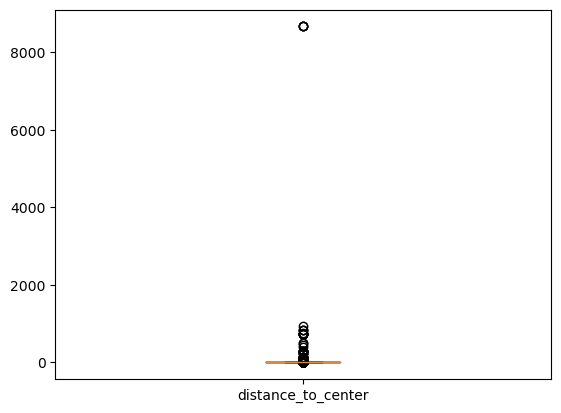

In [144]:
plt.boxplot(df_property['distance_to_center'])
plt.xticks([1], ['distance_to_center'])
plt.show();

#### Far from Center

In [145]:
df_property_far_from_center = df_property.query("distance_to_center > 100")
df_property_far_from_center.shape
df_property_far_from_center


(45, 24)

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type,bedroom,hall,distance_to_center
1239,ff8081814f6e2c87014f6eefaaf707f4,BHK3,2017-02-10 21:06:00,3,1,2,SEMI_FURNISHED,0,12.334932,76.616745,...,10,1500,0,570017.0,27000,270000,AP,3,1,127.590961
4128,ff80818154809dad0154898b796f6ff2,BHK2,2017-02-26 17:10:00,2,2,3,SEMI_FURNISHED,0,18.522452,73.778390,...,5,1000,0,411021.0,16000,50000,AP,2,1,739.725711
4236,ff80818154aefc2e0154b3e8f5414466,BHK2,2017-02-01 17:26:00,2,4,11,SEMI_FURNISHED,0,18.509120,73.927971,...,5,900,0,411028.0,5000,12500,AP,2,1,729.733440
4331,ff80818154d230860154d3683858237d,BHK1,2017-02-26 14:35:00,1,2,4,SEMI_FURNISHED,0,0.000000,0.000000,...,0,600,0,560048.0,12500,80000,IF,1,1,8673.539467
4722,ff808181557246fd015572cbc3a518b5,BHK3,2017-02-19 14:39:00,3,8,11,NOT_FURNISHED,1,18.522826,73.767260,...,0,1550,1,411008.0,20000,75000,AP,3,1,740.421280
4731,ff8081815576fd4f01557764c55d1572,BHK3,2017-03-15 14:04:00,2,3,4,SEMI_FURNISHED,1,9.146778,76.590183,...,1,1400,0,560043.0,26000,250000,AP,3,1,435.903861
5001,ff80818155e478330155e483b23200a2,BHK1,2017-03-20 16:17:00,1,6,6,SEMI_FURNISHED,0,18.565076,73.805238,...,0,300,0,411007.0,13000,30000,AP,1,1,742.051275
5046,ff80818155f3f9b90155f8200320586d,RK1,2017-03-21 18:51:00,1,1,1,FULLY_FURNISHED,0,0.000000,0.000000,...,0,250,0,560055.0,3500,20000,IF,0,0,8673.539467
5297,ff808181565a773d01565acad47a1257,BHK1,2017-03-17 14:38:00,1,4,4,NOT_FURNISHED,0,18.458923,73.914316,...,2,630,0,411060.0,8400,25000,AP,1,1,725.886575
5600,ff80818156cd94740156d13011137d01,BHK2,2017-03-21 21:38:00,2,0,3,SEMI_FURNISHED,0,0.000000,0.000000,...,10,1000,0,560095.0,23000,150000,IF,2,1,8673.539467


In [146]:
df_property_far_from_center[['latitude', 'longitude', 'distance_to_center']]

,latitude,longitude,distance_to_center
1239,12.334932,76.616745,127.590961
4128,18.522452,73.778390,739.725711
4236,18.509120,73.927971,729.733440
4331,0.000000,0.000000,8673.539467
4722,18.522826,73.767260,740.421280
4731,9.146778,76.590183,435.903861
5001,18.565076,73.805238,742.051275
5046,0.000000,0.000000,8673.539467
5297,18.458923,73.914316,725.886575
5600,0.000000,0.000000,8673.539467


Notes:

+ PLOT RINGS ON MAP AT [50, 100, 200, 500] km from center

In [147]:
# demo/test
# check
coords_1 = 18.462204, 73.862391   # index = 22979
coords_2 = (center_lat, center_lon)

# Calculate the distance
distance = geodesic(coords_1, coords_2).kilometers

print(f"Distance between the two points is: {distance} kilometers")


Distance between the two points is: 729.2332645098028 kilometers


#### Near to Center

In [148]:
df_property_near_to_center = df_property.query("distance_to_center <= 20")
df_property_near_to_center.shape
df_property_near_to_center

(28069, 24)

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type,bedroom,hall,distance_to_center
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,2,850,1,560076.0,12000,120000,AP,2,1,9.085040
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,1,1233,1,560016.0,20000,150000,AP,2,1,10.369874
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,0,1200,0,560075.0,15000,75000,AP,2,1,6.853463
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4,SEMI_FURNISHED,0,12.888169,77.591282,...,1,1300,0,560076.0,17000,150000,AP,3,1,7.856098
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2,SEMI_FURNISHED,0,12.990243,77.712962,...,4,450,0,560048.0,6500,40000,IF,1,1,12.229796
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2,SEMI_FURNISHED,0,12.942613,77.621890,...,15,1200,0,560030.0,23000,200000,IF,2,1,2.475888
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3,SEMI_FURNISHED,0,12.906331,77.591790,...,8,1310,0,560078.0,22000,125000,AP,3,1,5.882955
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14,SEMI_FURNISHED,1,12.904363,77.526863,...,0,975,1,NaN,12500,50000,AP,2,1,10.356790
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,5,600,0,560034.0,14000,80000,IF,2,1,3.399258


Noes:

+ about 800 properties are outside 20 km from center; i.. ~ 2.8%


In [149]:
(28888 - 28069) / 28888

0.02835087233453337

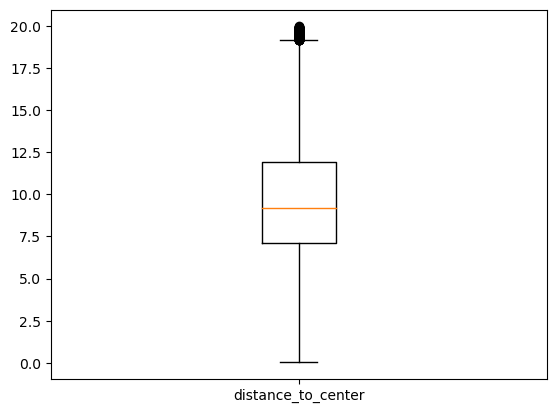

In [150]:
plt.boxplot(df_property_near_to_center['distance_to_center'])
plt.xticks([1], ['distance_to_center'])
plt.show();

### 10 - "lease_type"

+ lease_type
    + discrete - categorical - 3 classes


In [151]:
df_property_features.query("column == 'lease_type'")

,column,dtype,num_nans,nunique,unique
10,lease_type,object,0,4,"[ANYONE, BACHELOR, COMPANY, FAMILY]"


In [152]:
vc_lease_type = df_property['lease_type'].value_counts()
vc_lease_type

FAMILY      14885
ANYONE      12721
BACHELOR     1211
COMPANY        71
Name: lease_type, dtype: int64

In [153]:
N = vc_lease_type.sum()
N

28888

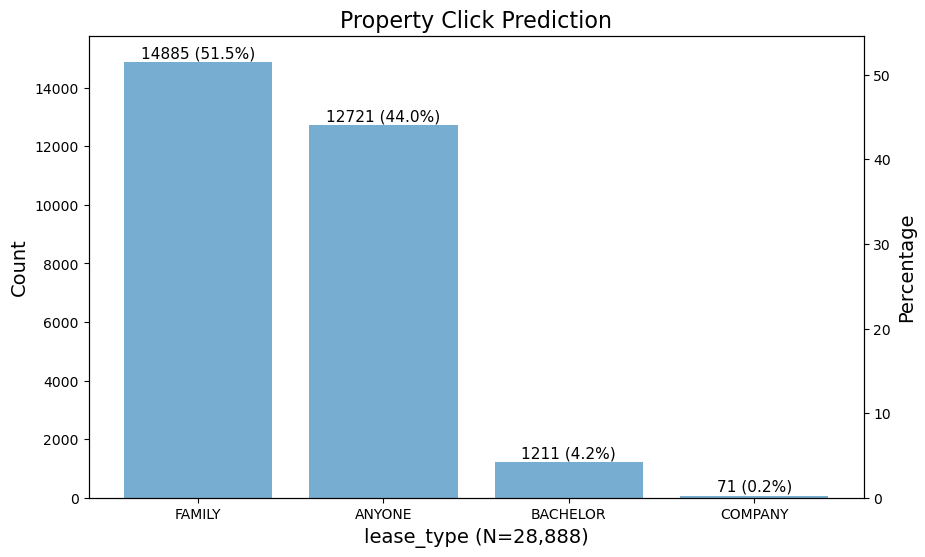

In [154]:
plot_bar_categorical(dict(vc_lease_type),
                     title='Property Click Prediction',
                     xlabel=f'lease_type ({N=:,})',
                    )

In [155]:
### Feature Encoding

In [156]:
import pandas as pd

# One hot encode the "lease_type" feature, dropping the first column
one_hot_encoded = pd.get_dummies(df_encoded['lease_type'], prefix='lease_type', drop_first=True)

# Concatenate the one hot encoded columns with the original dataframe
df_encoded = pd.concat([df_encoded, one_hot_encoded], axis=1)

#copy paste and watch out for version number
df_encoded

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,rent,deposit,building_type,bedroom,hall,furnishing_FULLY_FURNISHED,furnishing_SEMI_FURNISHED,lease_type_BACHELOR,lease_type_COMPANY,lease_type_FAMILY
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,12000,120000,AP,2,1,0,1,0,0,1
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,20000,150000,AP,2,1,0,1,0,0,1
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,15000,75000,AP,2,1,0,0,0,0,0
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4,SEMI_FURNISHED,0,12.888169,77.591282,...,17000,150000,AP,3,1,0,1,0,0,0
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2,SEMI_FURNISHED,0,12.990243,77.712962,...,6500,40000,IF,1,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2,SEMI_FURNISHED,0,12.942613,77.621890,...,23000,200000,IF,2,1,0,1,0,0,1
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3,SEMI_FURNISHED,0,12.906331,77.591790,...,22000,125000,AP,3,1,0,1,0,0,1
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14,SEMI_FURNISHED,1,12.904363,77.526863,...,12500,50000,AP,2,1,0,1,0,0,1
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,14000,80000,IF,2,1,0,1,0,0,0


## 11 - "lift"

+ lift
    + discrete - categorical - 2 classs


In [157]:
df_property_features.query("column == 'lift'")

,column,dtype,num_nans,nunique,unique
11,lift,int64,0,2,"[0, 1]"


In [158]:
vc_lift = df_property['lift'].value_counts()
vc_lift

0    20828
1     8060
Name: lift, dtype: int64

In [159]:
N = vc_lift.sum()
N

28888

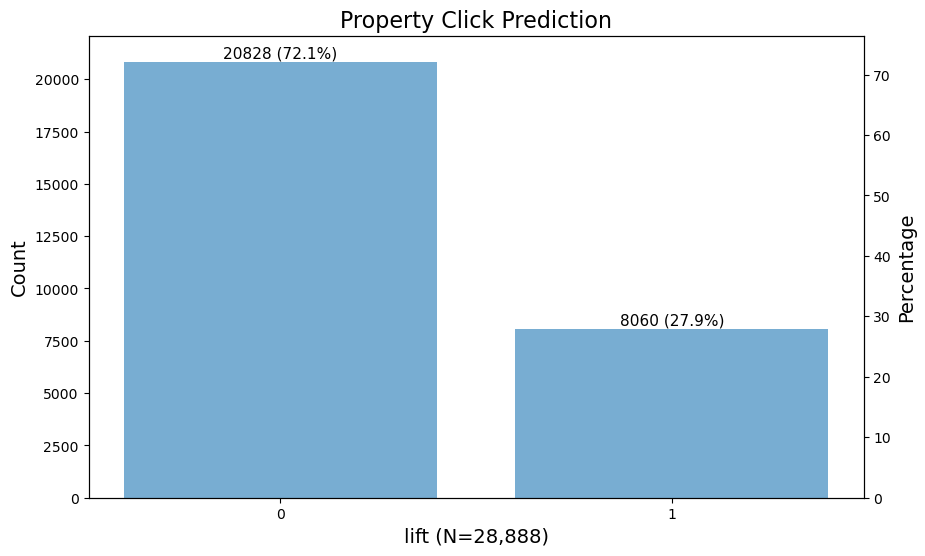

In [160]:
plot_bar_categorical(dict(vc_lift),
                     title='Property Click Prediction',
                     xlabel=f'lift ({N=:,})',
                    )

## 12 - "locality"

+ locality
    + continuous?


In [161]:
df_property_features.query("column == 'locality'")

,column,dtype,num_nans,nunique,unique
12,locality,object,0,2368,NaN


In [162]:
vc_locality = df_property['locality'].value_counts()
vc_locality

Whitefield                                  745
JP Nagar                                    655
Electronic City                             630
Ramamurthy Nagar                            522
Marathahalli                                494
                                           ... 
Sultanpalya, Bengaluru, Karnataka, India      1
Anjanapura BDA Layout                         1
JP Nagar 1st Phase,                           1
Bharath Nagar                                 1
Hosakote                                      1
Name: locality, Length: 2368, dtype: int64

In [163]:
# help(plot_bar_categorical)

In [164]:
vc_locality[:8]

Whitefield          745
JP Nagar            655
Electronic City     630
Ramamurthy Nagar    522
Marathahalli        494
Banashankari        487
HSR Layout          430
BTM Layout          410
Name: locality, dtype: int64

In [165]:
N = vc_locality.sum()
N

28888

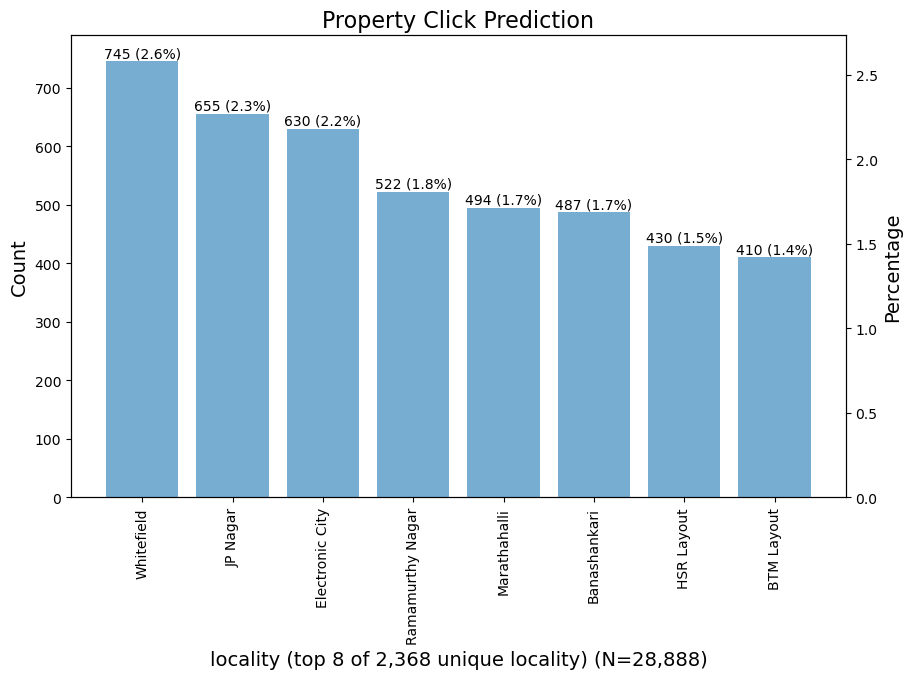

In [166]:
n_largest = 8

plot_bar_categorical(dict(vc_locality[:n_largest]),
                     title='Property Click Prediction',
                     xlabel=f'locality (top {n_largest} of {len(vc_locality):,} unique locality) ({N=:,})',
                     xtick_rotation=90,
                     fontsize_top_of_bar=10,
                     total=N,   # <---------
                    )

## 13 - "parking"

+ parking
    + discrete - categorical - 4 classes
    + no missing values


In [167]:
df_property_features.query("column == 'parking'")

,column,dtype,num_nans,nunique,unique
13,parking,object,0,4,"[BOTH, FOUR_WHEELER, NONE, TWO_WHEELER]"


In [168]:
vc_parking = df_property['parking'].value_counts()
vc_parking

BOTH            13809
TWO_WHEELER     12806
NONE             1277
FOUR_WHEELER      996
Name: parking, dtype: int64

In [169]:
N = vc_parking.sum()
N

28888

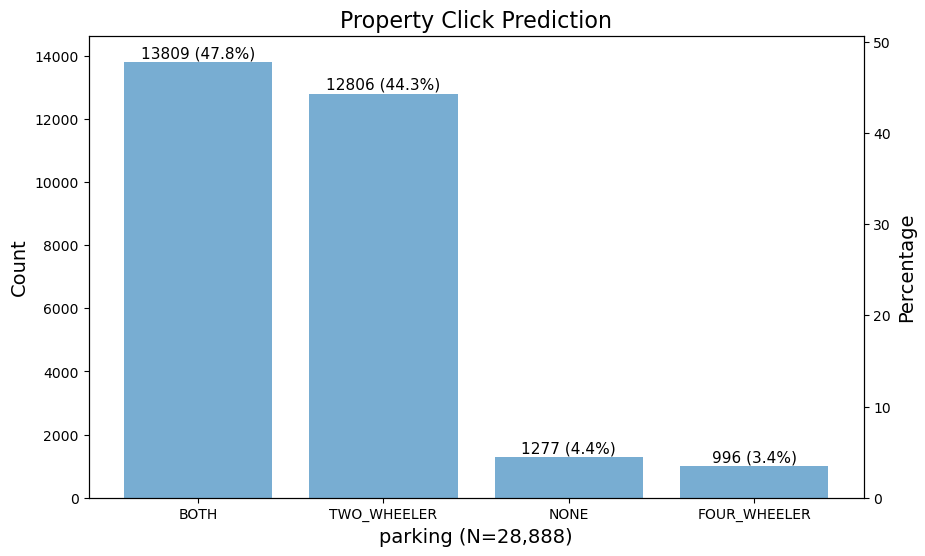

In [170]:
plot_bar_categorical(dict(vc_parking),
                     title='Property Click Prediction',
                     xlabel=f'parking ({N=:,})',
                    )

In [171]:
### Feature Encoding

In [172]:
import pandas as pd

# One hot encode the "parking" feature
one_hot_encoded = pd.get_dummies(df_encoded['parking'], prefix='parking')

# Concatenate the one hot encoded columns with the original dataframe
df_encoded = pd.concat([df_encoded, one_hot_encoded], axis=1)

# Drop one of the encoded columns, for example, 'parking_NONE'
df_encoded = df_encoded.drop('parking_NONE', axis=1)

#copy paste and watch out for version number
df_encoded

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,bedroom,hall,furnishing_FULLY_FURNISHED,furnishing_SEMI_FURNISHED,lease_type_BACHELOR,lease_type_COMPANY,lease_type_FAMILY,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,2,1,0,1,0,0,1,1,0,0
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,2,1,0,1,0,0,1,1,0,0
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,2,1,0,0,0,0,0,0,1,0
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4,SEMI_FURNISHED,0,12.888169,77.591282,...,3,1,0,1,0,0,0,1,0,0
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2,SEMI_FURNISHED,0,12.990243,77.712962,...,1,1,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2,SEMI_FURNISHED,0,12.942613,77.621890,...,2,1,0,1,0,0,1,1,0,0
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3,SEMI_FURNISHED,0,12.906331,77.591790,...,3,1,0,1,0,0,1,1,0,0
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14,SEMI_FURNISHED,1,12.904363,77.526863,...,2,1,0,1,0,0,1,1,0,0
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,2,1,0,1,0,0,0,0,0,1


## 14 - "property_age"

+ property_age
    + discrete - technically categorical, but high cardinality (nunique=49)
    + no missing values


In [173]:
df_property_features.query("column == 'property_age'")

,column,dtype,num_nans,nunique,unique
14,property_age,int64,0,49,NaN


In [174]:
df_property['property_age'].nunique()

49

In [175]:
vc_property_age = df_property['property_age'].value_counts()
len(vc_property_age)
vc_property_age

49

0      8199
5      3175
1      2697
10     2614
2      2551
3      2326
4      1477
6      1391
8      1259
7       909
15      683
20      454
9       293
12      281
25       92
11       86
30       77
13       67
14       46
16       40
18       36
17       28
40       16
22       13
35       12
19        9
50        8
28        7
24        6
23        6
26        3
80        3
45        3
27        3
21        3
29        2
70        1
37        1
100       1
34        1
800       1
31        1
60        1
457       1
94        1
55        1
33        1
32        1
42        1
Name: property_age, dtype: int64

In [176]:
N = vc_locality.sum()
N
# type(N)   # numpy.int64

28888

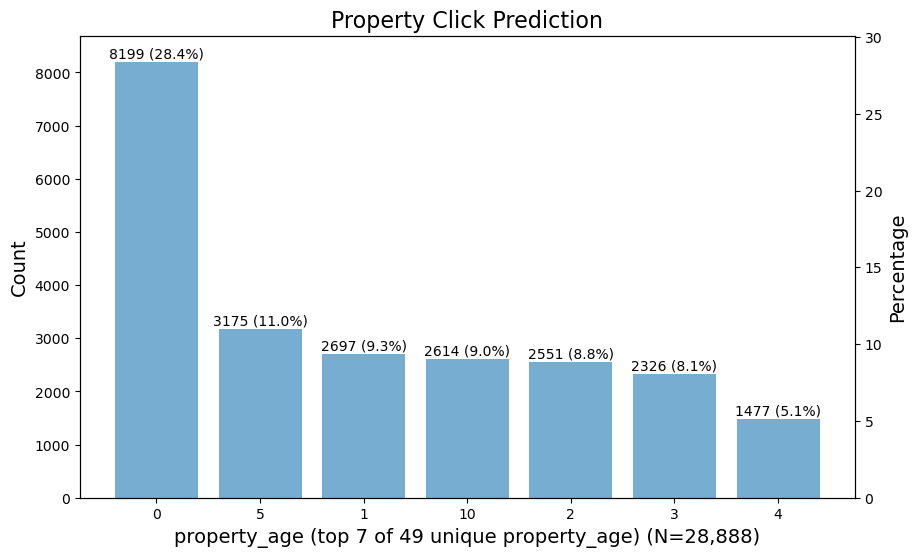

In [177]:
n_largest = 7

plot_bar_categorical(dict(vc_property_age[:n_largest]),
                     title='Property Click Prediction',
                     xlabel=f'property_age (top {n_largest} of {len(vc_property_age)} unique property_age) ({N=:,})',
                     # xtick_rotation=90,
                     fontsize_top_of_bar=10,
                     total=N,   # <---------
                    )


## 15 - "property_size"

+ property_size
    + continuous? / discrete?
    + no missing data

In [178]:
df_property_features.query("column == 'property_size'")

,column,dtype,num_nans,nunique,unique
15,property_size,int64,0,1241,NaN


In [179]:
vc_property_size = df_property['property_size'].value_counts()
len(vc_property_size)
vc_property_size

1241

1200    2327
600     1944
800     1789
1000    1556
400     1393
        ... 
3150       1
355        1
695        1
1322       1
892        1
Name: property_size, Length: 1241, dtype: int64

In [180]:
N = vc_property_size.sum()
N

28888

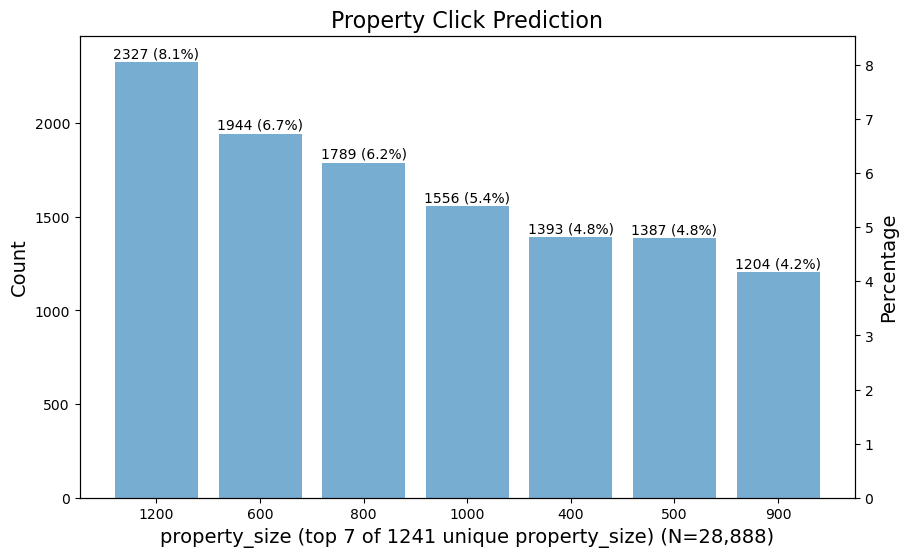

In [181]:
n_largest = 7

plot_bar_categorical(dict(vc_property_size[:n_largest]),
                     title='Property Click Prediction',
                     xlabel=f'property_size (top {n_largest} of {len(vc_property_size)} unique property_size) ({N=:,})',
                     fontsize_top_of_bar=10,
                     total=N,   # <---------
                    )

## 16 - "swimming_pool"

+ swimming_pool
    + discrete - categorical - 2 classes

In [182]:
df_property_features.query("column == 'swimming_pool'")

,column,dtype,num_nans,nunique,unique
16,swimming_pool,int64,0,2,"[0, 1]"


In [183]:
vc_swimming_pool = df_property['swimming_pool'].value_counts()
vc_swimming_pool

0    24769
1     4119
Name: swimming_pool, dtype: int64

In [184]:
N = vc_property_size.sum()
N

28888

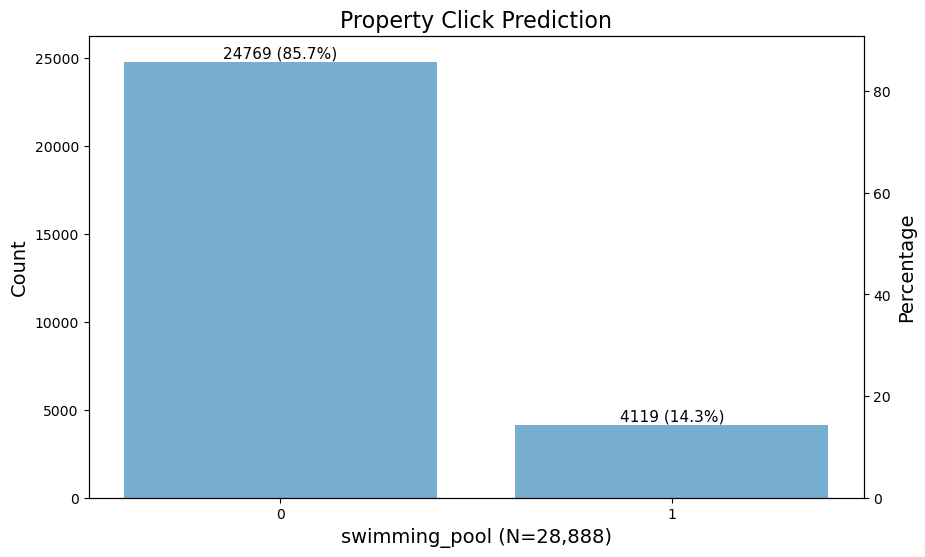

In [185]:
plot_bar_categorical(dict(vc_swimming_pool),
                     title='Property Click Prediction',
                     xlabel=f'swimming_pool ({N=:,})',
                    )

## 17 - "pin_code"

+ pin_code
    + <U>P</U>ostal <U>I</U>dentification <U>N</U>umber
    + discrete - technically categorical, but high cardinality (nunique=212)

In [186]:
df_property_features.query("column == 'pin_code'")

,column,dtype,num_nans,nunique,unique
17,pin_code,float64,325,212,NaN


In [187]:
n_largest = 7

In [188]:
# KeyError: 7
# vc_pin_code[:n_largest]

In [189]:
vc_pin_code = df_property['pin_code'].value_counts()
len(vc_pin_code)
type(vc_pin_code)
vc_pin_code
vcd = dict(vc_pin_code)
len(vcd)
type(vcd)

212

pandas.core.series.Series

560076.0     1722
560068.0     1464
560078.0     1370
560100.0     1241
560016.0     1129
             ... 
500029.0        1
567100.0        1
5600018.0       1
500067.0        1
411048.0        1
Name: pin_code, Length: 212, dtype: int64

212

dict

In [190]:
# Get the first n_largest elements from the dictionary
first_n_elements = list(vcd.items())[:n_largest]

# Convert it back to dictionary if needed
first_n_dict = dict(first_n_elements)

first_n_dict

{560076.0: 1722,
 560068.0: 1464,
 560078.0: 1370,
 560100.0: 1241,
 560016.0: 1129,
 560037.0: 1096,
 560043.0: 1055}

In [191]:
N = vc_pin_code.sum()
N

28563

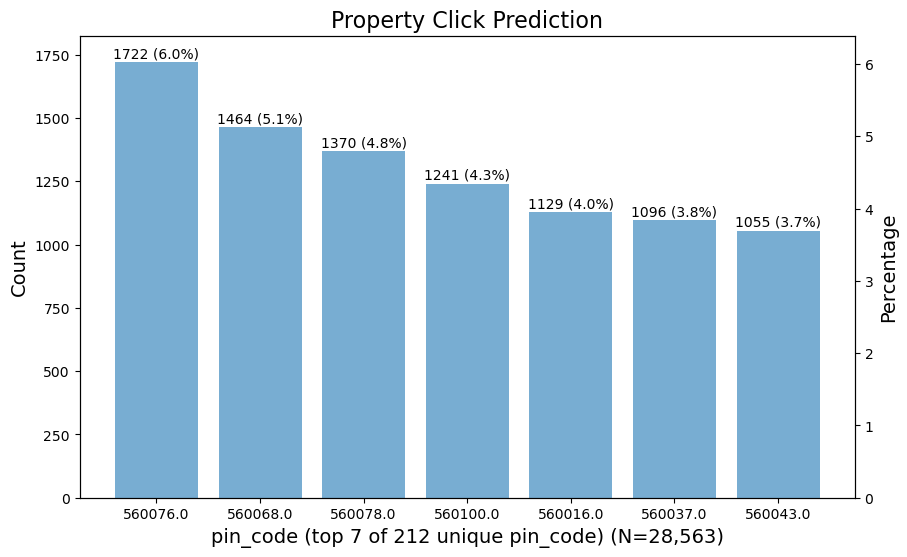

In [192]:
n_largest = 7

plot_bar_categorical(# dict(vc_pin_code[:n_largest]),   # KeyError: 7
                     first_n_dict,
                     title='Property Click Prediction',
                     xlabel=f'pin_code (top {n_largest} of {len(vc_pin_code)} unique pin_code) ({N=:,})',
                     fontsize_top_of_bar=10,
                     total=N,   # <---------
                    )

In [193]:
df_property['pin_code']

0        560076.0
1        560016.0
2        560075.0
3        560076.0
4        560048.0
           ...   
28883    560030.0
28884    560078.0
28885         NaN
28886    560034.0
28887    560093.0
Name: pin_code, Length: 28888, dtype: float64

In [194]:
df_property['pin_code'].min()

0.0

In [195]:
df_property['pin_code'].max()

5601000.0

In [196]:
df_property['pin_code'].describe()

count    2.856300e+04
mean     5.615600e+05
std      8.979452e+04
min      0.000000e+00
25%      5.600400e+05
50%      5.600670e+05
75%      5.600840e+05
max      5.601000e+06
Name: pin_code, dtype: float64

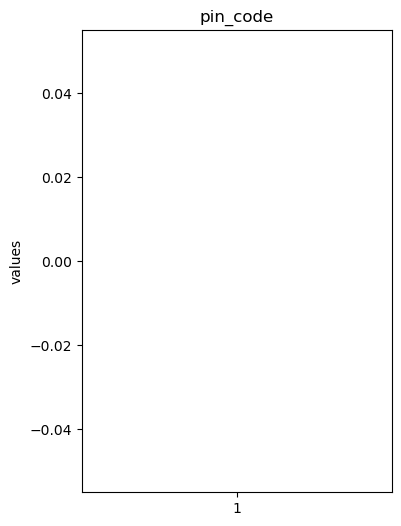

In [197]:
plt.figure(figsize=(4, 6))
plt.boxplot(df_property['pin_code'])
plt.title('pin_code')
plt.ylabel('values')
plt.show();

Notes:

+ Need to drop the NaN

In [198]:
df_property['pin_code'].isna().sum()

325

In [199]:
df_property['pin_code'].dropna()

0        560076.0
1        560016.0
2        560075.0
3        560076.0
4        560048.0
           ...   
28882    560003.0
28883    560030.0
28884    560078.0
28886    560034.0
28887    560093.0
Name: pin_code, Length: 28563, dtype: float64

In [200]:
df_property['pin_code'] = df_property['pin_code'].fillna(-1)

In [201]:
df_property['pin_code'].isna().sum()

0

In [202]:
df_encoded["pin_code"] = df_property['pin_code']

In [203]:
df_encoded

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,bedroom,hall,furnishing_FULLY_FURNISHED,furnishing_SEMI_FURNISHED,lease_type_BACHELOR,lease_type_COMPANY,lease_type_FAMILY,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,2,1,0,1,0,0,1,1,0,0
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,2,1,0,1,0,0,1,1,0,0
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,2,1,0,0,0,0,0,0,1,0
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4,SEMI_FURNISHED,0,12.888169,77.591282,...,3,1,0,1,0,0,0,1,0,0
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2,SEMI_FURNISHED,0,12.990243,77.712962,...,1,1,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2,SEMI_FURNISHED,0,12.942613,77.621890,...,2,1,0,1,0,0,1,1,0,0
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3,SEMI_FURNISHED,0,12.906331,77.591790,...,3,1,0,1,0,0,1,1,0,0
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14,SEMI_FURNISHED,1,12.904363,77.526863,...,2,1,0,1,0,0,1,1,0,0
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,2,1,0,1,0,0,0,0,0,1


Using `matplotlib`

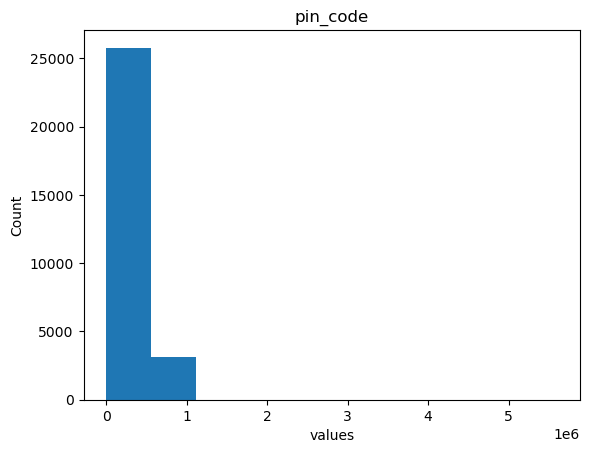

In [204]:
plt.hist(df_property['pin_code'],
         # df_property['pin_code'].dropna(),
         # bins=20
        )
plt.title('pin_code')
plt.ylabel('Count')
plt.xlabel('values')
plt.show();


Notes:

+ There is/are outlier(s) on the high end.

Using `matplotlib`.

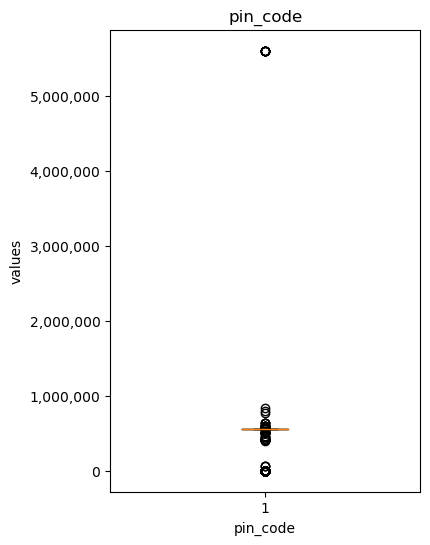

In [205]:
from matplotlib.ticker import FuncFormatter

# Define a custom formatting function to add commas
def format_with_commas(value, _):
    return f'{value:,.0f}'
    
plt.figure(figsize=(4, 6))
plt.boxplot(df_property['pin_code'].dropna())   # <---------
plt.title('pin_code')
plt.ylabel('values')
plt.xlabel('pin_code')

# Set the y-axis tick labels to plain format (no exponential notation)
# plt.ticklabel_format(style='plain', axis='y')

# Set the y-axis tick labels using the custom formatter
plt.gca().yaxis.set_major_formatter(FuncFormatter(format_with_commas))

plt.show();

Notes:

+ boxplot indicates problems
+ do outlier analysis

Using `seaborn`.

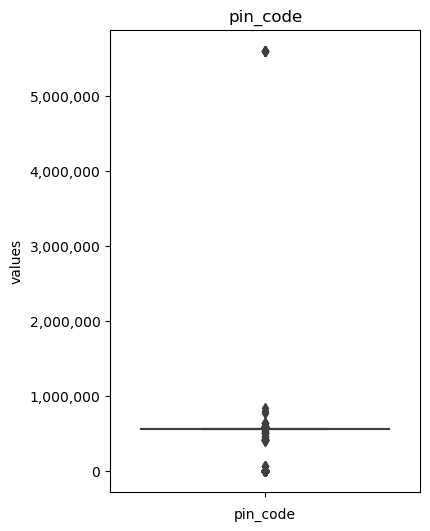

In [206]:
from matplotlib.ticker import FuncFormatter

# Define a custom formatting function to add commas
def format_with_commas(value, _):
    return f'{value:,.0f}'
    
plt.figure(figsize=(4, 6))
# plt.boxplot(df_property['pin_code'].dropna())   # --------->
sns.boxplot(data=df_property, y='pin_code')   # <---------

plt.title('pin_code')
plt.ylabel('values')
plt.xlabel('pin_code')

# Set the y-axis tick labels to plain format (no exponential notation)
# plt.ticklabel_format(style='plain', axis='y')

# Set the y-axis tick labels using the custom formatter
plt.gca().yaxis.set_major_formatter(FuncFormatter(format_with_commas))

plt.show();

Using `plotly` Express.

In [207]:
# Format the y-axis tick labels with commas
# def format_with_commas(value):
#     # return f'{value:,.0f}'
#     return value   # do nothing

# df_property['pin_code_formatted'] = df_property['pin_code'].apply(format_with_commas)

# Create the box plot using Plotly Express
fig = px.box(df_property, y='pin_code', labels={'pin_code': 'pin_code values'}, title='pin_code')

# Update the y-axis tick labels with formatted values
fig.update_yaxes(tickvals=df_property['pin_code'], ticktext=df_property['pin_code'])

# Set the figure height and width
fig.update_layout(height=700, width=400)  # Adjust the values as needed for your desired dimensions

# Show the plot
fig.show();


In [208]:
df_property['pin_code'].dropna()

0        560076.0
1        560016.0
2        560075.0
3        560076.0
4        560048.0
           ...   
28883    560030.0
28884    560078.0
28885        -1.0
28886    560034.0
28887    560093.0
Name: pin_code, Length: 28888, dtype: float64

## 18 - "rent"

+ rent
    + continuous - int - high cardinality
    + high variance?

In [209]:
df_property_features.query("column == 'property_age'")

,column,dtype,num_nans,nunique,unique
14,property_age,int64,0,49,NaN


In [210]:
vc_property_age = df_property['property_age'].value_counts()
len(vc_property_age)
vc_property_age

49

0      8199
5      3175
1      2697
10     2614
2      2551
3      2326
4      1477
6      1391
8      1259
7       909
15      683
20      454
9       293
12      281
25       92
11       86
30       77
13       67
14       46
16       40
18       36
17       28
40       16
22       13
35       12
19        9
50        8
28        7
24        6
23        6
26        3
80        3
45        3
27        3
21        3
29        2
70        1
37        1
100       1
34        1
800       1
31        1
60        1
457       1
94        1
55        1
33        1
32        1
42        1
Name: property_age, dtype: int64

In [211]:
N = vc_property_age.sum()
N

28888

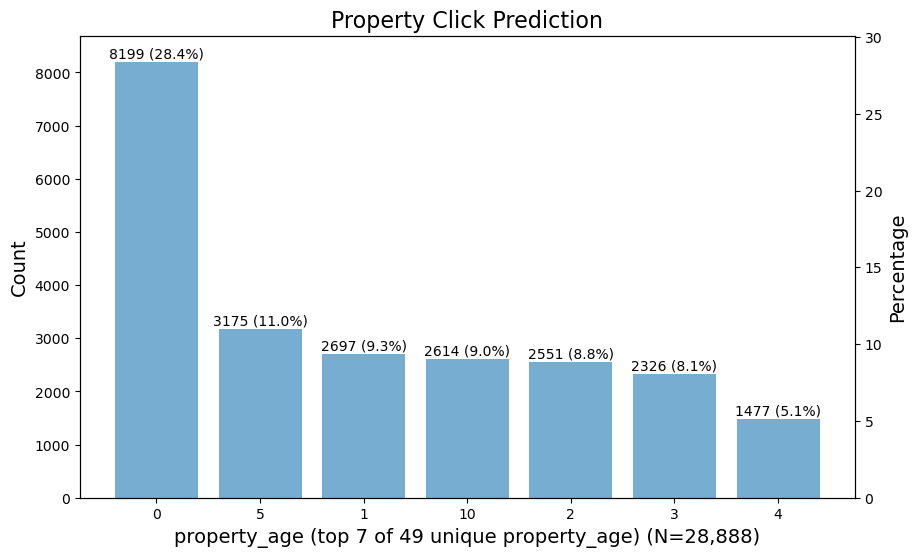

In [212]:
n_largest = 7

plot_bar_categorical(dict(vc_property_age[:n_largest]),
                     title='Property Click Prediction',
                     xlabel=f'property_age (top {n_largest} of {len(vc_property_age)} unique property_age) ({N=:,})',
                     fontsize_top_of_bar=10,
                     total=N,   # <---------
                    )

## 19 - "deposit"

+ deposit
    + str - unique - key
    + contnuous - int64 - high cardinality (nunique=358)
    + variance?


In [213]:
df_property_features.query("column == 'deposit'")

,column,dtype,num_nans,nunique,unique
19,deposit,int64,0,356,NaN


In [214]:
vc_deposit = df_property['deposit'].value_counts()
len(vc_deposit)
vc_deposit

356

100000     4332
50000      2972
150000     2532
200000     1746
60000      1246
           ... 
64000         1
41667         1
1450000       1
219000        1
313500        1
Name: deposit, Length: 356, dtype: int64

In [215]:
N = vc_deposit.sum()
N

28888

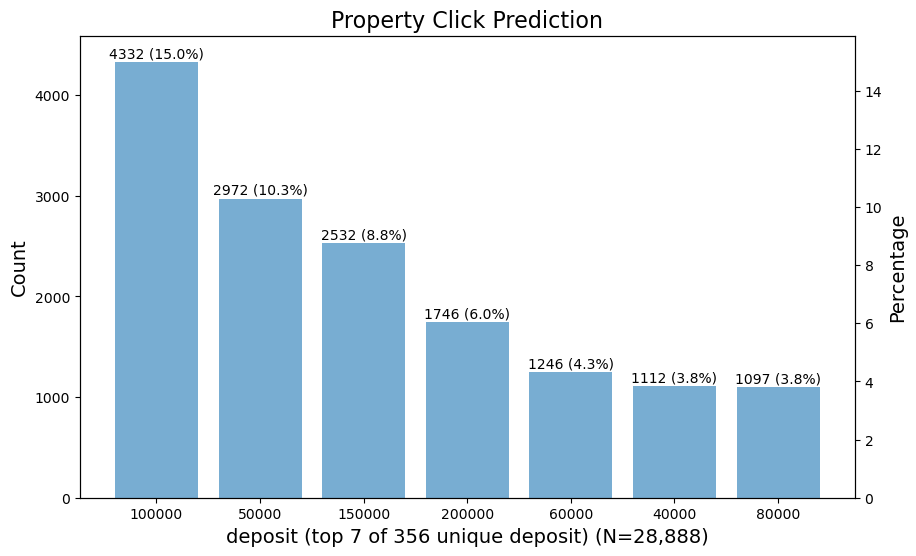

In [216]:
n_largest = 7

plot_bar_categorical(dict(vc_deposit[:n_largest]),
                     title='Property Click Prediction',
                     xlabel=f'deposit (top {n_largest} of {len(vc_deposit)} unique deposit) ({N=:,})',
                     fontsize_top_of_bar=10,
                     total=N,   # <---------
                    )

## 20 - "building_type"

+ building_type
    + discrete - categorical - 3 classes
+ Here's what they might stand for based on some educated guesses:
    + AP (Apartment Building): This is a common type of residential building that houses multiple separate housing units. The units are typically rented out to tenants.
    + IF (Industrial Facility): This might refer to a building designed for industrial purposes, such as manufacturing, assembly, warehousing, or research and development.
    + IH (Institutional Housing): This could refer to a housing facility meant for a particular group of people, like students (dormitories), seniors (assisted living facilities), or staff members of an institution (staff housing).

In [217]:
df_property_features.query("column == 'building_type'")

,column,dtype,num_nans,nunique,unique
20,building_type,object,79,3,"[AP, IF, IH, nan]"


In [218]:
vc_building_type = df_property['building_type'].value_counts()
len(vc_building_type)
vc_building_type

3

IF    16557
AP    10193
IH     2059
Name: building_type, dtype: int64

In [219]:
N = vc_building_type.sum()
N

28809

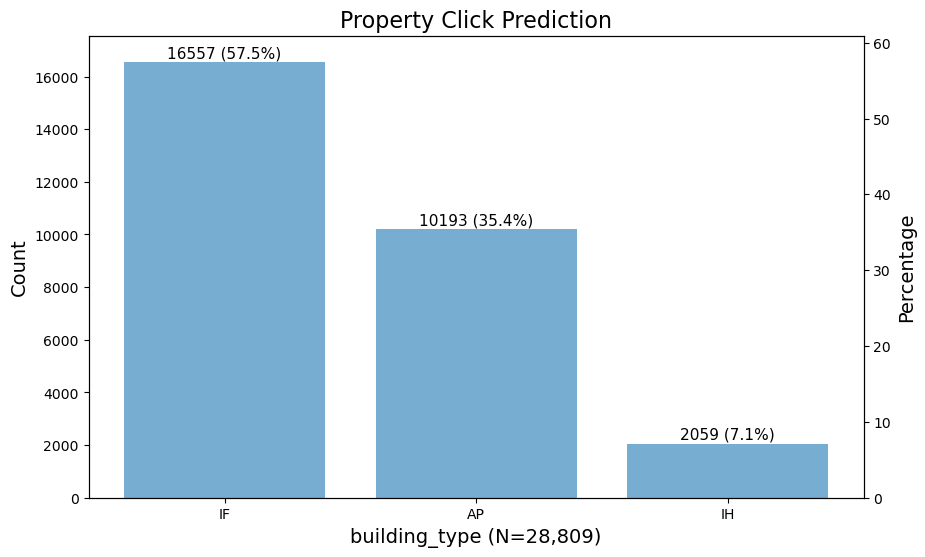

In [220]:
plot_bar_categorical(dict(vc_building_type),
                     title='Property Click Prediction',
                     xlabel=f'building_type ({N=:,})',
                    )

Notes:

+ this may be a good parameter to:
    + grouby
    + use as a category on varuous charts to encode:
        + color, size, shape

### Feature Encoding

In [221]:
import pandas as pd

# One hot encode the "building_type" feature
one_hot_encoded = pd.get_dummies(df_encoded['building_type'], prefix='building_type')

# Concatenate the one hot encoded columns with the original dataframe
df_encoded = pd.concat([df_encoded, one_hot_encoded], axis=1)

# Drop one of the encoded columns, for example, 'parking_NONE'
#df_encoded = df_encoded.drop('parking_NONE', axis=1)

#copy paste and watch out for version number
df_encoded

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,furnishing_SEMI_FURNISHED,lease_type_BACHELOR,lease_type_COMPANY,lease_type_FAMILY,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,1,0,0,1,0,0
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,1,0,0,1,1,0,0,1,0,0
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,0,0,0,0,0,1,0,1,0,0
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4,SEMI_FURNISHED,0,12.888169,77.591282,...,1,0,0,0,1,0,0,1,0,0
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2,SEMI_FURNISHED,0,12.990243,77.712962,...,1,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2,SEMI_FURNISHED,0,12.942613,77.621890,...,1,0,0,1,1,0,0,0,1,0
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3,SEMI_FURNISHED,0,12.906331,77.591790,...,1,0,0,1,1,0,0,1,0,0
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14,SEMI_FURNISHED,1,12.904363,77.526863,...,1,0,0,1,1,0,0,1,0,0
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,1,0,0,0,0,0,1,0,1,0


---
# Photos - "property_photos.tsv"

+ from "Property Click Prediction.docx":  
    property_photos.tsv:  
    + Data containing photo counts of properties.
    + photo_urls column contains string values that you have to parse to obtain the number of photos uploaded on a property.
    + Each value in the photo_url column is supposed to be a string representation of an array of JSON [in Python terms a list of dictionaries] where each JSON object represents one image. However, due to some unforeseen events, these values got corrupted and lost their valid JSON array representation. You can see this if you observe the data closely. Hint: There is a missing “before ‘title’ for the first JSON object in each value. There is also an additional “at the end of each value. Also, you must remove all the \\ to get a valid JSON representation.
    + Your objective is to get the number of photos uploaded for a property. For this, you should correct the corrupt string and make it a valid JSON. Once you have a valid JSON string, you can get the length of this array, which would be the number of photos uploaded on the property.
    + Also note that these are not images, but just names that we use to point to images. You are NOT given the images, nor do we expect you to have them. All that you are expected to do it get the number of photos on each property by cleaning up the corrupt invalid json array string.
    + NULL/NaN values indicate the absence of photos on the property, ie; photo_count = 0


## Data

In [222]:
df_photos = pd.read_csv(r'data/property_photos.tsv',
                        sep='\t',   # <---------
                       )
df_photos

,property_id,photo_urls
0,ff808081469fd6e20146a5af948000ea,"[{\title\"":\""Balcony\"",\""name\"":\""IMG_20131006..."
1,ff8080814702d3d10147068359d200cd,NaN
2,ff808081470c645401470fb03f5800a6,"[{\title\"":\""Bedroom\"",\""name\"":\""ff808081470c..."
3,ff808081470c6454014715eaa5960281,"[{\title\"":\""Bedroom\"",\""name\"":\""Screenshot_7..."
4,ff808081474aa867014771a0298f0aa6,"[{\title\"":\""Other\"",\""name\"":\""ff808081474aa8..."
...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,NaN
28884,ff8081815b1fdda8015b1ffee8a305d2,"[{\title\"":\""\"",\""name\"":\""files[]\"",\""imagesM..."
28885,ff8081815b1fdda8015b2000369205fd,"[{\title\"":\""\"",\""name\"":\""files[]\"",\""imagesM..."
28886,ff8081815b200540015b20158b0103c9,NaN


Notes:

+ all "property_id" are represented, even if the "proprty_id" does not have photo(s).

In [223]:
df_photos['property_id'].nunique()

28888

In [224]:
df_photos.iloc[0]

property_id                     ff808081469fd6e20146a5af948000ea
photo_urls     [{\title\":\"Balcony\",\"name\":\"IMG_20131006...
Name: 0, dtype: object

In [225]:
photo_url = df_photos.iloc[0]['photo_urls']
photo_url

'[{\\title\\":\\"Balcony\\",\\"name\\":\\"IMG_20131006_120837.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_65149_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg\\",\\"medium\\":\\"ff808081469fd6e20146a5af948000ea_65149_medium.jpg\\",\\"large\\":\\"ff808081469fd6e20146a5af948000ea_65149_large.jpg\\"},\\"displayPic\\":false},{\\"title\\":\\"Bathroom\\",\\"name\\":\\"IMG_20131006_120734.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_63511_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg\\",\\"medium\\":\\"ff808081469fd6e20146a5af948000ea_63511_medium.jpg\\",\\"large\\":\\"ff808081469fd6e20146a5af948000ea_63511_large.jpg\\"},\\"displayPic\\":false},{\\"title\\":\\"Bedroom\\",\\"name\\":\\"IMG_20131006_120643.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_16708_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea_

In [226]:
type(photo_url)
len(photo_url)

str

2555

In [227]:
photo_url[-1]

'"'

In [228]:
photo_url[:10]   # __repr__()

'[{\\title\\"'

In [229]:
print(photo_url[:10])    # __str__()

[{\title\"


In [230]:
for index, c in enumerate(photo_url[:10]):
    print(index, c)

0 [
1 {
2 \
3 t
4 i
5 t
6 l
7 e
8 \
9 "


In [231]:
photo_url.count('title')

7

In [232]:
photo_url.count('jpg')

35

In [233]:
photo_url.count('png')

0

In [234]:
len(photo_url)

2555

In [235]:
# Find the first occurrence of "title"
index = photo_url.find("title")

if index != -1:
    # Replace the first occurrence of "title" with "\"title"
    photo_url = photo_url.replace("title", "\"title", 1)

len(photo_url)
photo_url

2556

'[{\\"title\\":\\"Balcony\\",\\"name\\":\\"IMG_20131006_120837.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_65149_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg\\",\\"medium\\":\\"ff808081469fd6e20146a5af948000ea_65149_medium.jpg\\",\\"large\\":\\"ff808081469fd6e20146a5af948000ea_65149_large.jpg\\"},\\"displayPic\\":false},{\\"title\\":\\"Bathroom\\",\\"name\\":\\"IMG_20131006_120734.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_63511_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg\\",\\"medium\\":\\"ff808081469fd6e20146a5af948000ea_63511_medium.jpg\\",\\"large\\":\\"ff808081469fd6e20146a5af948000ea_63511_large.jpg\\"},\\"displayPic\\":false},{\\"title\\":\\"Bedroom\\",\\"name\\":\\"IMG_20131006_120643.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_16708_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea

In [236]:
# remove trailing double quote
photo_url = photo_url[0:-1]
len(photo_url)
photo_url

2555

'[{\\"title\\":\\"Balcony\\",\\"name\\":\\"IMG_20131006_120837.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_65149_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg\\",\\"medium\\":\\"ff808081469fd6e20146a5af948000ea_65149_medium.jpg\\",\\"large\\":\\"ff808081469fd6e20146a5af948000ea_65149_large.jpg\\"},\\"displayPic\\":false},{\\"title\\":\\"Bathroom\\",\\"name\\":\\"IMG_20131006_120734.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_63511_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg\\",\\"medium\\":\\"ff808081469fd6e20146a5af948000ea_63511_medium.jpg\\",\\"large\\":\\"ff808081469fd6e20146a5af948000ea_63511_large.jpg\\"},\\"displayPic\\":false},{\\"title\\":\\"Bedroom\\",\\"name\\":\\"IMG_20131006_120643.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_16708_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea

In [237]:
print(photo_url[0:20])

[{\"title\":\"Balcon


In [238]:
photo_url.count('\\')

196

In [239]:
# Replace all '\\' with ''
# photo_url = photo_url.replace('\\', '')
photo_url = photo_url.replace('\\', '')
len(photo_url)
photo_url

2359

'[{"title":"Balcony","name":"IMG_20131006_120837.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_65149_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_65149_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_65149_large.jpg"},"displayPic":false},{"title":"Bathroom","name":"IMG_20131006_120734.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_63511_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_63511_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_63511_large.jpg"},"displayPic":false},{"title":"Bedroom","name":"IMG_20131006_120643.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_16708_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_16708_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_16708_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_16708_large.jpg"},"di

In [240]:
2555-196

2359

In [241]:
type(photo_url)

str

In [242]:
# demo/illustration
import ast   # Abstract Syntax Tree

# Your string containing the list representation
pu = "['item1', 'item2', 'item3']"

# Use ast.literal_eval to safely parse the string into a list
try:
    photo_list = ast.literal_eval(pu)
    if isinstance(photo_list, list):
        print("Extracted list:", photo_list)
    else:
        print("The extracted value is not a list.")
except (SyntaxError, ValueError) as e:
    print("Error parsing the string:", e)


Extracted list: ['item1', 'item2', 'item3']


In [243]:
type(photo_list)

list

In [244]:
import ast   # Abstract Syntax Tree

# Use ast.literal_eval to safely parse the string into a list
try:
    photo_list = ast.literal_eval(photo_url)
    print(photo_list)
    if isinstance(photo_list, list):
        print("Extracted list:", photo_list)
    else:
        print("The extracted value is not a list.")
except (SyntaxError, ValueError) as e:
    print("Error parsing the string:", e)


Error parsing the string: malformed node or string on line 1: <ast.Name object at 0x000002845F8494E0>


In [245]:
type(photo_url)

str

In [246]:
photo_url

'[{"title":"Balcony","name":"IMG_20131006_120837.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_65149_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_65149_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_65149_large.jpg"},"displayPic":false},{"title":"Bathroom","name":"IMG_20131006_120734.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_63511_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_63511_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_63511_large.jpg"},"displayPic":false},{"title":"Bedroom","name":"IMG_20131006_120643.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_16708_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_16708_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_16708_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_16708_large.jpg"},"di

In [247]:
photo_url[0]

'['

In [248]:
photo_url[-1]

']'

In [249]:
import json

s = '[{"title":"Balcony","name":"IMG_20131006_120837.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_65149_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_65149_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_65149_large.jpg"},"displayPic":false},{"title":"Bathroom","name":"IMG_20131006_120734.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_63511_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_63511_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_63511_large.jpg"},"displayPic":false},{"title":"Bedroom","name":"IMG_20131006_120643.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_16708_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_16708_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_16708_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_16708_large.jpg"},"displayPic":false},{"title":"Hall","name":"IMG_20131006_120745.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_69828_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_69828_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_69828_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_69828_large.jpg"},"displayPic":false},{"title":"Hall","name":"IMG_20131006_120919.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_32711_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_32711_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_32711_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_32711_large.jpg"},"displayPic":true},{"title":"Kitchen","name":"IMG_20131006_120612.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_32363_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_32363_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_32363_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_32363_large.jpg"},"displayPic":false},{"title":"Other","name":"IMG_20131006_120853.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_29724_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_29724_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_29724_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_29724_large.jpg"},"displayPic":false}]'

# Parse the JSON string into a Python object
data = json.loads(s)

# Now, 'data' contains the Python object
print(data)


[{'title': 'Balcony', 'name': 'IMG_20131006_120837.jpg', 'imagesMap': {'original': 'ff808081469fd6e20146a5af948000ea_65149_original.jpg', 'thumbnail': 'ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg', 'medium': 'ff808081469fd6e20146a5af948000ea_65149_medium.jpg', 'large': 'ff808081469fd6e20146a5af948000ea_65149_large.jpg'}, 'displayPic': False}, {'title': 'Bathroom', 'name': 'IMG_20131006_120734.jpg', 'imagesMap': {'original': 'ff808081469fd6e20146a5af948000ea_63511_original.jpg', 'thumbnail': 'ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg', 'medium': 'ff808081469fd6e20146a5af948000ea_63511_medium.jpg', 'large': 'ff808081469fd6e20146a5af948000ea_63511_large.jpg'}, 'displayPic': False}, {'title': 'Bedroom', 'name': 'IMG_20131006_120643.jpg', 'imagesMap': {'original': 'ff808081469fd6e20146a5af948000ea_16708_original.jpg', 'thumbnail': 'ff808081469fd6e20146a5af948000ea_16708_thumbnail.jpg', 'medium': 'ff808081469fd6e20146a5af948000ea_16708_medium.jpg', 'large': 'ff808081469fd

In [250]:
type(data)

list

In [251]:
photo_url.count('title')

7

In [252]:
help(str.find)

Help on method_descriptor:

find(...)
    S.find(sub[, start[, end]]) -> int
    
    Return the lowest index in S where substring sub is found,
    such that sub is contained within S[start:end].  Optional
    arguments start and end are interpreted as in slice notation.
    
    Return -1 on failure.



In [253]:
positions = []

position = 0

while True:
    position = photo_url.find("title", position)
    if position == -1:
        break
    print(f'{position = }')
    positions.append(position)
    position += 5 


positions

position = 3
position = 341
position = 680
position = 1018
position = 1353
position = 1687
position = 2025


[3, 341, 680, 1018, 1353, 1687, 2025]

In [254]:
len(photo_url)

2359

In [255]:
positions.append(len(photo_url)+2)

In [256]:
for i in range(len(positions)-1):
    # print(photo_url[pos:pos+5])
    s = photo_url[positions[i]-2 : positions[i+1]-3]
    print(i)
    print(type(s), '\n', s) 
    # d = dict(s)
    print('-'*90)

0
<class 'str'> 
 {"title":"Balcony","name":"IMG_20131006_120837.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_65149_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_65149_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_65149_large.jpg"},"displayPic":false}
------------------------------------------------------------------------------------------
1
<class 'str'> 
 {"title":"Bathroom","name":"IMG_20131006_120734.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_63511_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_63511_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_63511_large.jpg"},"displayPic":false}
------------------------------------------------------------------------------------------
2
<class 'str'> 
 {"title":"Bedroom","name":"IMG_20131006_120643.jpg","imagesMap":{"original":"ff80808146

In [257]:
import json

s = '{"title":"Balcony","name":"IMG_20131006_120837.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_65149_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_65149_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_65149_large.jpg"},"displayPic":false}'

# Parse the JSON string into a Python dictionary
data = json.loads(s)

# Now, 'data' contains the Python dictionary
print(data)
type(data)

{'title': 'Balcony', 'name': 'IMG_20131006_120837.jpg', 'imagesMap': {'original': 'ff808081469fd6e20146a5af948000ea_65149_original.jpg', 'thumbnail': 'ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg', 'medium': 'ff808081469fd6e20146a5af948000ea_65149_medium.jpg', 'large': 'ff808081469fd6e20146a5af948000ea_65149_large.jpg'}, 'displayPic': False}


dict

In [258]:
data.keys()

dict_keys(['title', 'name', 'imagesMap', 'displayPic'])

In [259]:
from pprint import pprint

pprint(data)

{'displayPic': False,
 'imagesMap': {'large': 'ff808081469fd6e20146a5af948000ea_65149_large.jpg',
               'medium': 'ff808081469fd6e20146a5af948000ea_65149_medium.jpg',
               'original': 'ff808081469fd6e20146a5af948000ea_65149_original.jpg',
               'thumbnail': 'ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg'},
 'name': 'IMG_20131006_120837.jpg',
 'title': 'Balcony'}


In [260]:
two = df_photos.iloc[2]['photo_urls']
two

'[{\\title\\":\\"Bedroom\\",\\"name\\":\\"ff808081470c645401470fb03f5800a6_1968_large.jpg\\",\\"imagesMap\\":{\\"medium\\":\\"ff808081470c645401470fb03f5800a6_46868_medium.jpg\\",\\"large\\":\\"ff808081470c645401470fb03f5800a6_46868_large.jpg\\",\\"original\\":\\"ff808081470c645401470fb03f5800a6_46868_original.jpg\\",\\"thumbnail\\":\\"ff808081470c645401470fb03f5800a6_46868_thumbnail.jpg\\"},\\"displayPic\\":true},{\\"title\\":\\"Balcony\\",\\"name\\":\\"ff808081470c645401470fb03f5800a6_95169_large.jpg\\",\\"imagesMap\\":{\\"medium\\":\\"ff808081470c645401470fb03f5800a6_96389_medium.jpg\\",\\"large\\":\\"ff808081470c645401470fb03f5800a6_96389_large.jpg\\",\\"original\\":\\"ff808081470c645401470fb03f5800a6_96389_original.jpg\\",\\"thumbnail\\":\\"ff808081470c645401470fb03f5800a6_96389_thumbnail.jpg\\"},\\"displayPic\\":false},{\\"title\\":\\"Balcony\\",\\"name\\":\\"ff808081470c645401470fb03f5800a6_47540_large.jpg\\",\\"imagesMap\\":{\\"medium\\":\\"ff808081470c645401470fb03f5800a6_2023

In [261]:
two.count('title')

12

In [262]:
import math

def is_nan(value):
    try:
        # Convert the string to a float and check if it's NaN
        return math.isnan(float(value))
    except (TypeError, ValueError):
        # If the conversion to float fails, it's not NaN
        return False

# Test cases
string1 = ''
string2 = 'NaN'
string3 = 'np.NaN'

print(is_nan(string1))  # False
print(is_nan(string2))  # True
print(is_nan(string3))  # False


False
True
False


In [263]:
def count_photos(json_string):
    if is_nan(json_string):
        return 0  
    return json_string.count('title')

In [264]:
df_photos["photo_count"] = df_photos["photo_urls"].apply(count_photos)
df_photos

,property_id,photo_urls,photo_count
0,ff808081469fd6e20146a5af948000ea,"[{\title\"":\""Balcony\"",\""name\"":\""IMG_20131006...",7
1,ff8080814702d3d10147068359d200cd,NaN,0
2,ff808081470c645401470fb03f5800a6,"[{\title\"":\""Bedroom\"",\""name\"":\""ff808081470c...",12
3,ff808081470c6454014715eaa5960281,"[{\title\"":\""Bedroom\"",\""name\"":\""Screenshot_7...",9
4,ff808081474aa867014771a0298f0aa6,"[{\title\"":\""Other\"",\""name\"":\""ff808081474aa8...",7
...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,NaN,0
28884,ff8081815b1fdda8015b1ffee8a305d2,"[{\title\"":\""\"",\""name\"":\""files[]\"",\""imagesM...",7
28885,ff8081815b1fdda8015b2000369205fd,"[{\title\"":\""\"",\""name\"":\""files[]\"",\""imagesM...",6
28886,ff8081815b200540015b20158b0103c9,NaN,0


In [265]:
#df_count_photos = df_photos.copy()
df_count_photos = df_photos.drop("photo_urls", axis=1)
df_count_photos

,property_id,photo_count
0,ff808081469fd6e20146a5af948000ea,7
1,ff8080814702d3d10147068359d200cd,0
2,ff808081470c645401470fb03f5800a6,12
3,ff808081470c6454014715eaa5960281,9
4,ff808081474aa867014771a0298f0aa6,7
...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,0
28884,ff8081815b1fdda8015b1ffee8a305d2,7
28885,ff8081815b1fdda8015b2000369205fd,6
28886,ff8081815b200540015b20158b0103c9,0


### Merging

In [266]:
df_encoded = pd.merge(df_encoded, df_count_photos, on='property_id')
df_encoded

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,lease_type_BACHELOR,lease_type_COMPANY,lease_type_FAMILY,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,1,0,0,1,0,0,7
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,1,0,0,1,0,0,0
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,0,0,0,0,1,0,1,0,0,12
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4,SEMI_FURNISHED,0,12.888169,77.591282,...,0,0,0,1,0,0,1,0,0,9
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2,SEMI_FURNISHED,0,12.990243,77.712962,...,0,0,0,1,0,0,0,1,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2,SEMI_FURNISHED,0,12.942613,77.621890,...,0,0,1,1,0,0,0,1,0,0
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3,SEMI_FURNISHED,0,12.906331,77.591790,...,0,0,1,1,0,0,1,0,0,7
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14,SEMI_FURNISHED,1,12.904363,77.526863,...,0,0,1,1,0,0,1,0,0,6
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,0,0,0,0,0,1,0,1,0,0


---
# Interactions - "property_interactions.csv"

+ from "Property Click Prediction.docx":  
    property_interactions.csv:  
    + Data containing the timestamps of interaction on the properties.
    + Each request_date value represents the timestamp of a unique valid interaction on a property (contact owner happened and a user received the owner contact phone number)
    + Therefore, if you count the number of times each property has appeared in this table, it tells you the number of interactions received on this property
    + You will use this request_date along with the activation_date in our first table and other features in our study.

In [267]:
# BBBB

## Data

In [268]:
df_interactions = pd.read_csv(r'data/property_interactions.csv')
df_interactions

,property_id,request_date
0,ff808081469fd6e20146a5af948000ea,2017-03-10 17:42:34
1,ff808081469fd6e20146a5af948000ea,2017-03-09 15:51:17
2,ff808081469fd6e20146a5af948000ea,2017-03-10 17:30:22
3,ff808081469fd6e20146a5af948000ea,2017-03-11 17:48:46
4,ff8080814702d3d10147068359d200cd,2017-03-30 19:59:15
...,...,...
170606,ff8081815b2007fc015b201c77a20395,2017-04-03 16:13:55
170607,ff8081815b2007fc015b201c77a20395,2017-04-02 21:54:14
170608,ff8081815b2007fc015b201c77a20395,2017-04-09 11:33:14
170609,ff8081815b2007fc015b201c77a20395,2017-04-04 10:01:12


In [269]:
df_interactions['request_date'] = pd.to_datetime(df_interactions['request_date'],
                                             # format="%d-%m-%Y %H:%M"
                                            )

In [270]:
df_interactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170611 entries, 0 to 170610
Data columns (total 2 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   property_id   170611 non-null  object        
 1   request_date  170611 non-null  datetime64[ns]
dtypes: datetime64[ns](1), object(1)
memory usage: 2.6+ MB


In [271]:
df_property.columns

Index(['property_id', 'type', 'activation_date', 'bathroom', 'floor',
       'total_floor', 'furnishing', 'gym', 'latitude', 'longitude',
       'lease_type', 'lift', 'locality', 'parking', 'property_age',
       'property_size', 'swimming_pool', 'pin_code', 'rent', 'deposit',
       'building_type', 'bedroom', 'hall', 'distance_to_center'],
      dtype='object')

In [272]:
prop_id = 'ff808081469fd6e20146a5af948000ea'

df = df_property.query("property_id == @prop_id")
df

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type,bedroom,hall,distance_to_center
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,2,850,1,560076.0,12000,120000,AP,2,1,9.08504


In [273]:
activation_date = df['activation_date']
activation_date

0   2017-03-09 14:36:00
Name: activation_date, dtype: datetime64[ns]

In [274]:
df = df_interactions.query("property_id == @prop_id")
df

,property_id,request_date
0,ff808081469fd6e20146a5af948000ea,2017-03-10 17:42:34
1,ff808081469fd6e20146a5af948000ea,2017-03-09 15:51:17
2,ff808081469fd6e20146a5af948000ea,2017-03-10 17:30:22
3,ff808081469fd6e20146a5af948000ea,2017-03-11 17:48:46


In [275]:
req_dates = df['request_date']
req_dates

0   2017-03-10 17:42:34
1   2017-03-09 15:51:17
2   2017-03-10 17:30:22
3   2017-03-11 17:48:46
Name: request_date, dtype: datetime64[ns]

In [276]:
len(req_dates)

4

In [277]:
req_dates.shape

(4,)

In [278]:
req_dates.shape[0]

4

In [279]:
print(activation_date, '\n')
for req_date in req_dates:
    delta_datetime = req_date - activation_date
    print(req_date, delta_datetime, '\n')

0   2017-03-09 14:36:00
Name: activation_date, dtype: datetime64[ns] 

2017-03-10 17:42:34 0   1 days 03:06:34
Name: activation_date, dtype: timedelta64[ns] 

2017-03-09 15:51:17 0   0 days 01:15:17
Name: activation_date, dtype: timedelta64[ns] 

2017-03-10 17:30:22 0   1 days 02:54:22
Name: activation_date, dtype: timedelta64[ns] 

2017-03-11 17:48:46 0   2 days 03:12:46
Name: activation_date, dtype: timedelta64[ns] 



In [280]:
df_merged = pd.merge(df_encoded, df_interactions, on='property_id')
df_merged

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,lease_type_COMPANY,lease_type_FAMILY,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,1,1,0,0,1,0,0,7,2017-03-10 17:42:34
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,1,1,0,0,1,0,0,7,2017-03-09 15:51:17
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,1,1,0,0,1,0,0,7,2017-03-10 17:30:22
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,1,1,0,0,1,0,0,7,2017-03-11 17:48:46
4,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,1,1,0,0,1,0,0,0,2017-03-30 19:59:15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170606,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,1,1,0,0,1,0,0,11,2017-04-03 16:13:55
170607,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,1,1,0,0,1,0,0,11,2017-04-02 21:54:14
170608,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,1,1,0,0,1,0,0,11,2017-04-09 11:33:14
170609,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,1,1,0,0,1,0,0,11,2017-04-04 10:01:12


In [281]:
df_merged.columns

Index(['property_id', 'type', 'activation_date', 'bathroom', 'floor',
       'total_floor', 'furnishing', 'gym', 'latitude', 'longitude',
       'lease_type', 'lift', 'locality', 'parking', 'property_age',
       'property_size', 'swimming_pool', 'pin_code', 'rent', 'deposit',
       'building_type', 'bedroom', 'hall', 'furnishing_FULLY_FURNISHED',
       'furnishing_SEMI_FURNISHED', 'lease_type_BACHELOR',
       'lease_type_COMPANY', 'lease_type_FAMILY', 'parking_BOTH',
       'parking_FOUR_WHEELER', 'parking_TWO_WHEELER', 'building_type_AP',
       'building_type_IF', 'building_type_IH', 'photo_count', 'request_date'],
      dtype='object')

In [282]:
df_merged[['property_id', 'activation_date', 'request_date']]

,property_id,activation_date,request_date
0,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:42:34
1,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-09 15:51:17
2,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:30:22
3,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-11 17:48:46
4,ff8080814702d3d10147068359d200cd,2017-03-07 12:02:00,2017-03-30 19:59:15
...,...,...,...
170606,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-03 16:13:55
170607,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-02 21:54:14
170608,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-09 11:33:14
170609,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-04 10:01:12


In [283]:
df_merged['delta_date'] = df_merged['request_date'] - df_merged['activation_date']

In [284]:
df_merged[['property_id', 'activation_date', 'request_date', 'delta_date']]

,property_id,activation_date,request_date,delta_date
0,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:42:34,1 days 03:06:34
1,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-09 15:51:17,0 days 01:15:17
2,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:30:22,1 days 02:54:22
3,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-11 17:48:46,2 days 03:12:46
4,ff8080814702d3d10147068359d200cd,2017-03-07 12:02:00,2017-03-30 19:59:15,23 days 07:57:15
...,...,...,...,...
170606,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-03 16:13:55,3 days 17:40:55
170607,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-02 21:54:14,2 days 23:21:14
170608,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-09 11:33:14,9 days 13:00:14
170609,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-04 10:01:12,4 days 11:28:12


In [285]:
df_merged['delta_date'].dt.days

0          1
1          0
2          1
3          2
4         23
          ..
170606     3
170607     2
170608     9
170609     4
170610     0
Name: delta_date, Length: 170611, dtype: int64

In [286]:
df_merged['delta_date_days'] = df_merged['delta_date'].dt.total_seconds() / (24 * 3600)
df_merged['delta_date_days']

0          1.129560
1          0.052280
2          1.121088
3          2.133866
4         23.331424
            ...    
170606     3.736748
170607     2.973079
170608     9.541829
170609     4.477917
170610     0.529236
Name: delta_date_days, Length: 170611, dtype: float64

In [287]:
df_merged[['property_id', 'activation_date', 'request_date', 'delta_date', 'delta_date_days']]

,property_id,activation_date,request_date,delta_date,delta_date_days
0,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:42:34,1 days 03:06:34,1.129560
1,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-09 15:51:17,0 days 01:15:17,0.052280
2,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:30:22,1 days 02:54:22,1.121088
3,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-11 17:48:46,2 days 03:12:46,2.133866
4,ff8080814702d3d10147068359d200cd,2017-03-07 12:02:00,2017-03-30 19:59:15,23 days 07:57:15,23.331424
...,...,...,...,...,...
170606,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-03 16:13:55,3 days 17:40:55,3.736748
170607,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-02 21:54:14,2 days 23:21:14,2.973079
170608,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-09 11:33:14,9 days 13:00:14,9.541829
170609,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-04 10:01:12,4 days 11:28:12,4.477917


In [288]:
df_days = df_merged[df_merged['delta_date_days'] <= 7]

In [289]:
df_days[['property_id', 'activation_date', 'request_date', 'delta_date', 'delta_date_days']]

,property_id,activation_date,request_date,delta_date,delta_date_days
0,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:42:34,1 days 03:06:34,1.129560
1,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-09 15:51:17,0 days 01:15:17,0.052280
2,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:30:22,1 days 02:54:22,1.121088
3,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-11 17:48:46,2 days 03:12:46,2.133866
5,ff8080814702d3d10147068359d200cd,2017-03-07 12:02:00,2017-03-13 00:18:47,5 days 12:16:47,5.511655
...,...,...,...,...,...
170601,ff8081815b200540015b20158b0103c9,2017-03-30 22:30:00,2017-03-31 16:14:39,0 days 17:44:39,0.739340
170606,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-03 16:13:55,3 days 17:40:55,3.736748
170607,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-02 21:54:14,2 days 23:21:14,2.973079
170609,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-04 10:01:12,4 days 11:28:12,4.477917


In [290]:
len(df_merged)

170611

In [291]:
69781/170611

0.4090064532767524

In [292]:
df_merged['delta_date_days'].describe()

count    170611.000000
mean         12.824682
std          11.207197
min           0.000799
25%           3.700046
50%           9.660324
75%          19.538472
max          67.829988
Name: delta_date_days, dtype: float64

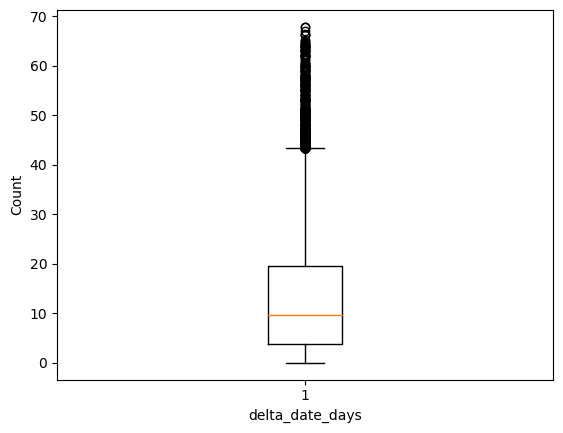

In [293]:
plt.boxplot(df_merged['delta_date_days'])
plt.xlabel("delta_date_days")
plt.ylabel("Count")
plt.show();

In [294]:
import math

num_days = []
percent_interactions = []

for num_day in range(0, math.ceil(df_merged['delta_date_days'].max()+1)):
    df_days = df_merged[df_merged['delta_date_days'] <= num_day]
    percent_interaction = len(df_days)/len(df_merged)
    num_days.append(num_day)
    percent_interactions.append(percent_interaction * 100)
    
    
for num_day, percent_interaction in enumerate(percent_interactions):
    print(num_day, percent_interaction)

0 0.0
1 8.439080715780342
2 15.48434743363558
3 21.701414328501677
4 27.14830813956896
5 32.11164579071689
6 36.71275591843433
7 40.90064532767524
8 44.69055336408555
9 48.14226515289167
10 51.51074666932378
11 54.56506321397799
12 57.45878050067111
13 60.20889626108515
14 62.75855601338718
15 65.33693607094501
16 67.71544624906952
17 69.95035490091495
18 72.13485648639302
19 74.10249046075576
20 75.93941773977059
21 77.7353160112771
22 79.40578274554395
23 81.03697885833856
24 82.56267180896894
25 84.01451254608436
26 85.33212981577975
27 86.62806032436362
28 87.78976736552742
29 88.92861538822233
30 90.02643440340893
31 90.99940801003453
32 91.90146004653862
33 92.73141825556382
34 93.51917519972335
35 94.29462344163038
36 95.04193750696028
37 95.71481323009654
38 96.34607381704579
39 96.88589833011939
40 97.41575865565525
41 97.92275996272221
42 98.38580161888741
43 98.80078072340001
44 99.23979110373892
45 99.64246150599902
46 99.86460427522258
47 99.87808523483245
48 99.8892216797

In [295]:
num_days

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68]

In [296]:
percent_interactions

[0.0,
 8.439080715780342,
 15.48434743363558,
 21.701414328501677,
 27.14830813956896,
 32.11164579071689,
 36.71275591843433,
 40.90064532767524,
 44.69055336408555,
 48.14226515289167,
 51.51074666932378,
 54.56506321397799,
 57.45878050067111,
 60.20889626108515,
 62.75855601338718,
 65.33693607094501,
 67.71544624906952,
 69.95035490091495,
 72.13485648639302,
 74.10249046075576,
 75.93941773977059,
 77.7353160112771,
 79.40578274554395,
 81.03697885833856,
 82.56267180896894,
 84.01451254608436,
 85.33212981577975,
 86.62806032436362,
 87.78976736552742,
 88.92861538822233,
 90.02643440340893,
 90.99940801003453,
 91.90146004653862,
 92.73141825556382,
 93.51917519972335,
 94.29462344163038,
 95.04193750696028,
 95.71481323009654,
 96.34607381704579,
 96.88589833011939,
 97.41575865565525,
 97.92275996272221,
 98.38580161888741,
 98.80078072340001,
 99.23979110373892,
 99.64246150599902,
 99.86460427522258,
 99.87808523483245,
 99.88922167972757,
 99.89918586726529,
 99.9114945695

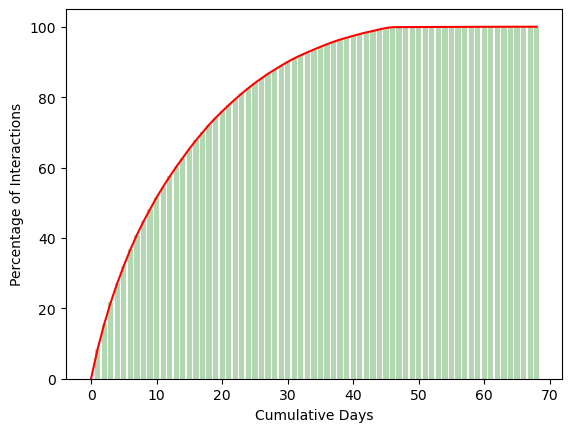

In [297]:
plt.bar(num_days, percent_interactions, color='green', alpha=0.3)
plt.plot(num_days, percent_interactions, color='red')
plt.xlabel("Cumulative Days")
plt.ylabel("Percentage of Interactions")
plt.show();

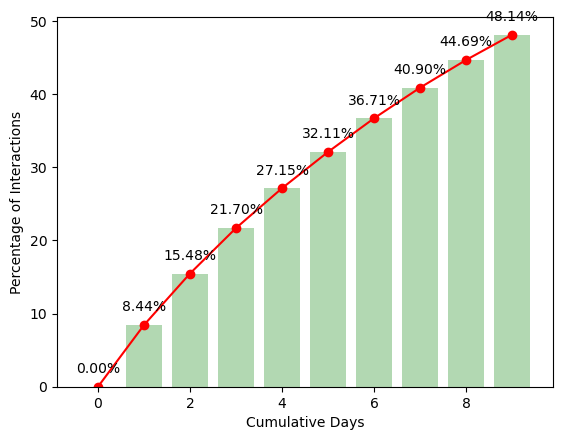

In [298]:
num_days_interactions = 10

num_days_subset = num_days[:num_days_interactions]
percent_interactions_subset = percent_interactions[:num_days_interactions]

# Bar plot
plt.bar(num_days_subset, percent_interactions_subset, color='green', alpha=0.3)

# Line plot
plt.plot(num_days_subset, percent_interactions_subset, color='red')

# Scatter plot
plt.scatter(num_days_subset, percent_interactions_subset, color='red')

# Annotate each bar with its value (one decimal place)
for i, (x, y) in enumerate(zip(num_days_subset, percent_interactions_subset)):
    plt.annotate(f'{y:.2f}%', (x, y), textcoords="offset points", xytext=(0,10), ha='center')

plt.xlabel("Cumulative Days")
plt.ylabel("Percentage of Interactions")
plt.show();

Text(0, 30, 'Correlation Coefficient: 0.86')

Text(0.5, 0, 'Cumulative Days')

Text(0, 0.5, 'Percentage of Interactions')

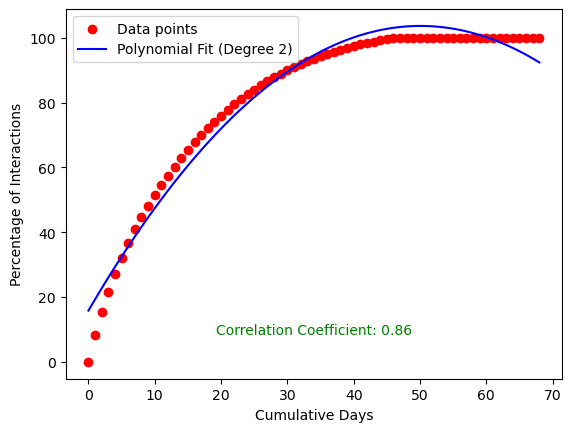

In [299]:
import numpy as np
import matplotlib.pyplot as plt

# Degree of the polynomial fit
degree = 2

# Fit a polynomial to the data
fit_coefficients = np.polyfit(num_days, percent_interactions, degree)
fit_poly = np.poly1d(fit_coefficients)

# Calculate the correlation coefficient
correlation_coefficient = np.corrcoef(num_days, percent_interactions)[0, 1]

# Plot the original data
plt.scatter(num_days, percent_interactions, color='red', label='Data points')

# Plot the fitted polynomial
x_values = np.linspace(min(num_days), max(num_days), 100)
plt.plot(x_values, fit_poly(x_values), color='blue', label=f'Polynomial Fit (Degree {degree})')

# Add the correlation coefficient to the plot
plt.annotate(f'Correlation Coefficient: {correlation_coefficient:.2f}', 
             xy=(0.5, 0), xytext=(0, 30),
             xycoords='axes fraction', textcoords='offset points',
             ha='center', va='bottom', fontsize=10, color='green')


# Labels and legend
plt.xlabel("Cumulative Days")
plt.ylabel("Percentage of Interactions")
plt.legend()

# Show the plot
plt.show()


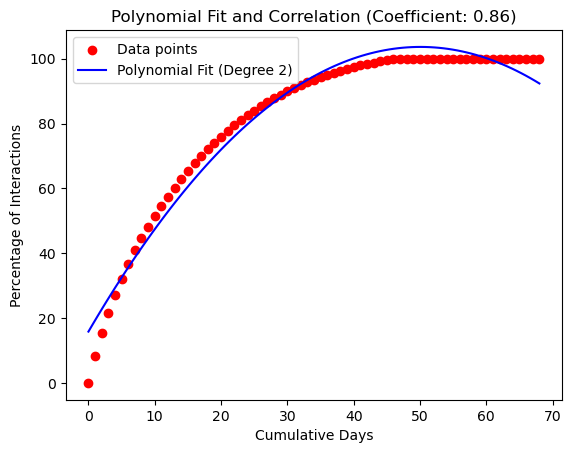

In [300]:
import numpy as np
import matplotlib.pyplot as plt

# Degree of the polynomial fit
degree = 2

# Fit a polynomial to the data
fit_coefficients = np.polyfit(num_days, percent_interactions, degree)
fit_poly = np.poly1d(fit_coefficients)

# Calculate the correlation coefficient
correlation_coefficient = np.corrcoef(num_days, percent_interactions)[0, 1]

# Plot the original data
plt.scatter(num_days, percent_interactions, color='red', label='Data points')

# Plot the fitted polynomial
x_values = np.linspace(min(num_days), max(num_days), 100)
plt.plot(x_values, fit_poly(x_values), color='blue', label=f'Polynomial Fit (Degree {degree})')

# Add the correlation coefficient to the plot label
plt.title(f'Polynomial Fit and Correlation (Coefficient: {correlation_coefficient:.2f})')

# Labels and legend
plt.xlabel("Cumulative Days")
plt.ylabel("Percentage of Interactions")
plt.legend()

# Show the plot
plt.show();

In [301]:
fit_coefficients

array([-0.03502975,  3.5075483 , 15.83098707])

In [302]:
help(np.poly1d)

Help on class poly1d in module numpy:

class poly1d(builtins.object)
 |  poly1d(c_or_r, r=False, variable=None)
 |  
 |  A one-dimensional polynomial class.
 |  
 |  .. note::
 |     This forms part of the old polynomial API. Since version 1.4, the
 |     new polynomial API defined in `numpy.polynomial` is preferred.
 |     A summary of the differences can be found in the
 |     :doc:`transition guide </reference/routines.polynomials>`.
 |  
 |  A convenience class, used to encapsulate "natural" operations on
 |  polynomials so that said operations may take on their customary
 |  form in code (see Examples).
 |  
 |  Parameters
 |  ----------
 |  c_or_r : array_like
 |      The polynomial's coefficients, in decreasing powers, or if
 |      the value of the second parameter is True, the polynomial's
 |      roots (values where the polynomial evaluates to 0).  For example,
 |      ``poly1d([1, 2, 3])`` returns an object that represents
 |      :math:`x^2 + 2x + 3`, whereas ``poly1d([1, 2

In [303]:
print(np.poly1d(fit_coefficients))
print(correlation_coefficient)

          2
-0.03503 x + 3.508 x + 15.83
0.8640557659713041


In [304]:
fit_poly(3)

26.038364202693025

In [305]:
fit_poly(7)

38.66736736033481

----------------------------------------------------------------------
degree = 1
 
5.237 x + 3.966
0.9907855095968384


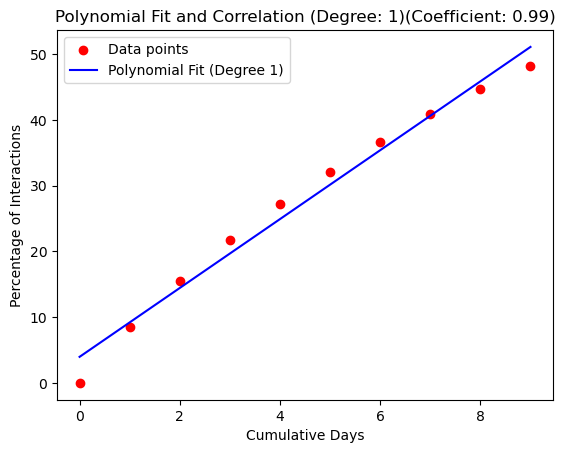

----------------------------------------------------------------------
degree = 2
         2
-0.2786 x + 7.745 x + 0.6228
0.9907855095968384


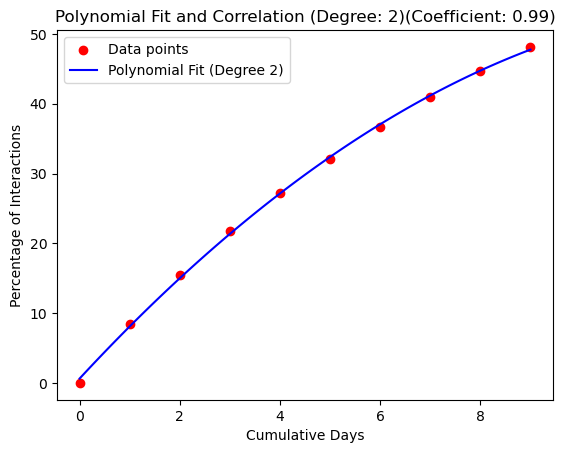

----------------------------------------------------------------------
degree = 3
         3          2
0.01942 x - 0.5408 x + 8.64 x + 0.1334
0.9907855095968384


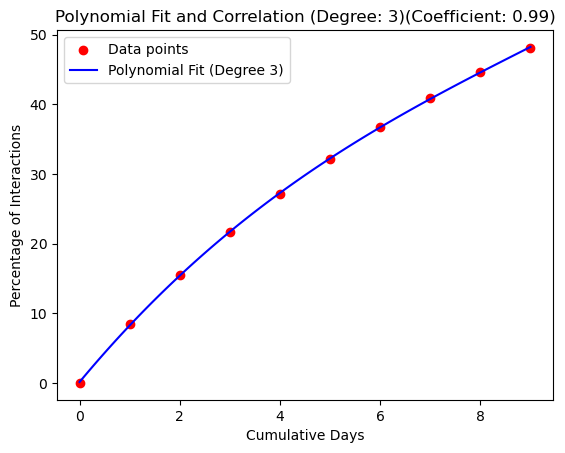

[array([5.23708816, 3.96620489]),
 array([-0.27861538,  7.74462658,  0.62282033]),
 array([ 0.01941967, -0.5407809 ,  8.63987328,  0.1334447 ])]

In [306]:
import numpy as np
import matplotlib.pyplot as plt

num_days_interactions = 10

num_days_subset = num_days[:num_days_interactions]
percent_interactions_subset = percent_interactions[:num_days_interactions]

fit_coeff_list = []

for degree in range(1,4):

    # Fit a polynomial to the data
    fit_coefficients = np.polyfit(num_days_subset, percent_interactions_subset, degree)
    fit_coeff_list.append(fit_coefficients)
    fit_poly = np.poly1d(fit_coefficients)
    
    # Calculate the correlation coefficient
    correlation_coefficient = np.corrcoef(num_days_subset, percent_interactions_subset)[0,1]

    # Plot the original data
    _= plt.scatter(num_days_subset, percent_interactions_subset, color='red', label='Data points')

    # Plot the fitted polynomial
    x_values = np.linspace(min(num_days_subset), max(num_days_subset), 100)
    _= plt.plot(x_values, fit_poly(x_values), color='blue', label=f'Polynomial Fit (Degree {degree})')

    # Add the correlation coefficient to the plot label
    _= plt.title(f'Polynomial Fit and Correlation (Degree: {degree})(Coefficient: {correlation_coefficient:.2f})')

    # Labels and legend
    _= plt.xlabel("Cumulative Days")
    _= plt.ylabel("Percentage of Interactions")
    _= plt.legend()
    
    print("-"*70)
    print("degree =", degree)
    print(np.poly1d(fit_coefficients))
    print(correlation_coefficient)
    
    # Show the plot
    #plt.xlim(0,10)
    #plt.ylim(0,0.5)
    plt.show();

fit_coeff_list    

In [307]:
num_days_interactions = 10

for n_days in range(num_days_interactions):
    y_actual = percent_interactions_subset[n_days]
    print(f'{n_days = }')
    print(f'{y_actual = }')

    for fit_coefficients in fit_coeff_list:
        #print(fit_coefficients)
        degree = len(fit_coefficients) - 1 
        print(f'\t{degree = }')
        fit_poly = np.poly1d(fit_coefficients)
        y_pred = fit_poly(n_days)
        print(f'\t{y_pred = }')
        error = y_pred - y_actual 
        print(f'\t{error = :0.4f}')
        print("\t", "-"*30, sep="")

n_days = 0
y_actual = 0.0
	degree = 1
	y_pred = 3.9662048860752357
	error = 3.9662
	------------------------------
	degree = 2
	y_pred = 0.6228203339761209
	error = 0.6228
	------------------------------
	degree = 3
	y_pred = 0.13344469504974665
	error = 0.1334
	------------------------------
n_days = 1
y_actual = 8.439080715780342
	degree = 1
	y_pred = 9.203293048531634
	error = 0.7642
	------------------------------
	degree = 2
	y_pred = 8.08883153116526
	error = -0.3502
	------------------------------
	degree = 3
	y_pred = 8.251956744140708
	error = -0.1871
	------------------------------
n_days = 2
y_actual = 15.48434743363558
	degree = 1
	y_pred = 14.440381210988035
	error = -1.0440
	------------------------------
	degree = 2
	y_pred = 14.997611969671212
	error = -0.4867
	------------------------------
	degree = 3
	y_pred = 15.40542500210984
	error = -0.0789
	------------------------------
n_days = 3
y_actual = 21.701414328501677
	degree = 1
	y_pred = 19.677469373444435
	error = -

In [308]:
num_days_subset
percent_interactions_subset 

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

[0.0,
 8.439080715780342,
 15.48434743363558,
 21.701414328501677,
 27.14830813956896,
 32.11164579071689,
 36.71275591843433,
 40.90064532767524,
 44.69055336408555,
 48.14226515289167]

----------------------------------------------------------------------
degree = 1
 
6.041 x + 2.105
0.9942431026112815


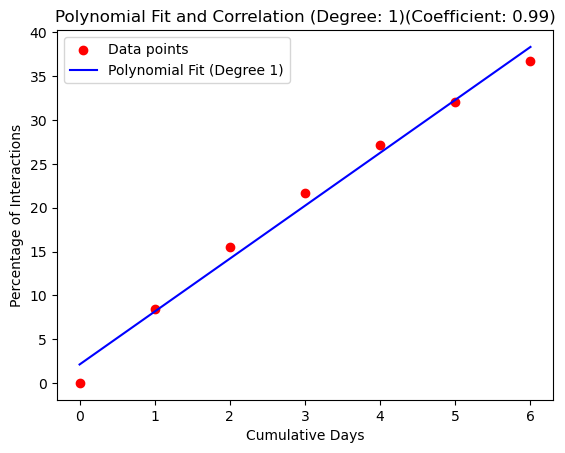

----------------------------------------------------------------------
degree = 2
         2
-0.3707 x + 8.265 x + 0.2517
0.9942431026112815


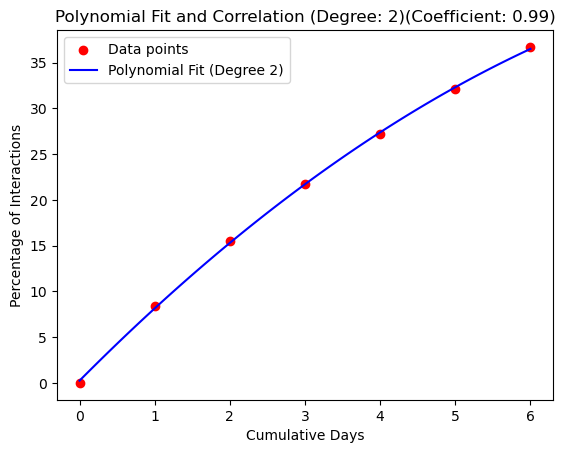

----------------------------------------------------------------------
degree = 3
         3          2
0.03823 x - 0.7148 x + 9.03 x + 0.02236
0.9942431026112815


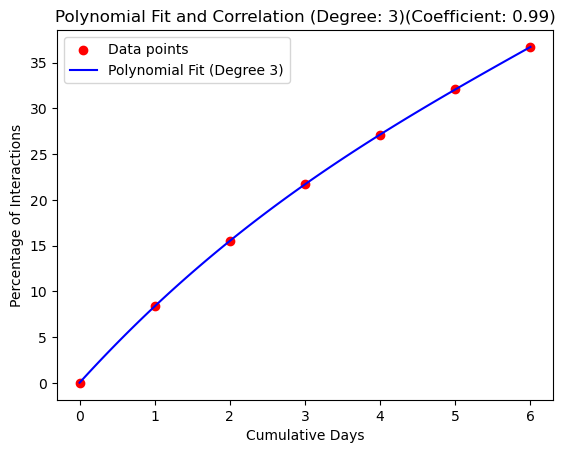

[array([6.04097709, 2.10529048]),
 array([-0.37071243,  8.2652517 ,  0.25172831]),
 array([ 0.03822861, -0.71476997,  9.02982399,  0.02235662])]

In [309]:
import numpy as np
import matplotlib.pyplot as plt

num_days_interactions = 7

num_days_subset = num_days[:num_days_interactions]
percent_interactions_subset = percent_interactions[:num_days_interactions]

fit_coeff_list = []

for degree in range(1,4):

    # Fit a polynomial to the data
    fit_coefficients = np.polyfit(num_days_subset, percent_interactions_subset, degree)
    fit_coeff_list.append(fit_coefficients)
    fit_poly = np.poly1d(fit_coefficients)
    
    # Calculate the correlation coefficient
    correlation_coefficient = np.corrcoef(num_days_subset, percent_interactions_subset)[0,1]

    # Plot the original data
    _= plt.scatter(num_days_subset, percent_interactions_subset, color='red', label='Data points')

    # Plot the fitted polynomial
    x_values = np.linspace(min(num_days_subset), max(num_days_subset), 100)
    _= plt.plot(x_values, fit_poly(x_values), color='blue', label=f'Polynomial Fit (Degree {degree})')

    # Add the correlation coefficient to the plot label
    _= plt.title(f'Polynomial Fit and Correlation (Degree: {degree})(Coefficient: {correlation_coefficient:.2f})')

    # Labels and legend
    _= plt.xlabel("Cumulative Days")
    _= plt.ylabel("Percentage of Interactions")
    _= plt.legend()
    
    print("-"*70)
    print("degree =", degree)
    print(np.poly1d(fit_coefficients))
    print(correlation_coefficient)
    
    # Show the plot
    #plt.xlim(0,10)
    #plt.ylim(0,0.5)
    plt.show();

fit_coeff_list    

In [310]:
num_days_interactions = 8

num_days_subset = num_days[:num_days_interactions]
percent_interactions_subset = percent_interactions[:num_days_interactions]

for n_days in range(num_days_interactions):
    y_actual = percent_interactions_subset[n_days]
    print(f'{n_days = }')
    print(f'{y_actual = }')

    for fit_coefficients in fit_coeff_list:
        #print(fit_coefficients)
        degree = len(fit_coefficients) - 1 
        print(f'\t{degree = }')
        fit_poly = np.poly1d(fit_coefficients)
        y_pred = fit_poly(n_days)
        print(f'\t{y_pred = }')
        error = y_pred - y_actual 
        print(f'\t{error = :0.4f}')
        print("\t", "-"*30, sep="")

n_days = 0
y_actual = 0.0
	degree = 1
	y_pred = 2.105290481186542
	error = 2.1053
	------------------------------
	degree = 2
	y_pred = 0.2517283120526914
	error = 0.2517
	------------------------------
	degree = 3
	y_pred = 0.02235662245860005
	error = 0.0224
	------------------------------
n_days = 1
y_actual = 8.439080715780342
	degree = 1
	y_pred = 8.14626757444045
	error = -0.2928
	------------------------------
	degree = 2
	y_pred = 8.14626757444045
	error = -0.2928
	------------------------------
	degree = 3
	y_pred = 8.3756392640345
	error = -0.0634
	------------------------------
n_days = 2
y_actual = 15.48434743363558
	degree = 1
	y_pred = 14.18724466769436
	error = -1.2971
	------------------------------
	degree = 2
	y_pred = 15.299381969174672
	error = -0.1850
	------------------------------
	degree = 3
	y_pred = 15.528753658768721
	error = 0.0444
	------------------------------
n_days = 3
y_actual = 21.701414328501677
	degree = 1
	y_pred = 20.228221760948273
	error = -1.47

In [311]:
df_merged.head()

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date,delta_date,delta_date_days
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-10 17:42:34,1 days 03:06:34,1.129560
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-09 15:51:17,0 days 01:15:17,0.052280
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-10 17:30:22,1 days 02:54:22,1.121088
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-11 17:48:46,2 days 03:12:46,2.133866
4,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,1,0,0,1,0,0,0,2017-03-30 19:59:15,23 days 07:57:15,23.331424


In [312]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 170611 entries, 0 to 170610
Data columns (total 38 columns):
 #   Column                      Non-Null Count   Dtype          
---  ------                      --------------   -----          
 0   property_id                 170611 non-null  object         
 1   type                        170611 non-null  object         
 2   activation_date             170611 non-null  datetime64[ns] 
 3   bathroom                    170611 non-null  int64          
 4   floor                       170611 non-null  int64          
 5   total_floor                 170611 non-null  int32          
 6   furnishing                  170611 non-null  object         
 7   gym                         170611 non-null  int64          
 8   latitude                    170611 non-null  float64        
 9   longitude                   170611 non-null  float64        
 10  lease_type                  170611 non-null  object         
 11  lift                      

In [313]:
unique_ids = df_merged["property_id"].nunique()
unique_ids

22779

In [314]:
propid_vc = df_merged["property_id"].value_counts()
propid_vc

ff80818159e061800159e4614bf4368d    193
ff8081815ae03cc6015aeb9caaf065ee    183
ff80818159c49a360159c600065a0c66    168
ff8081815a8d7af5015a8d85892d05ef    165
ff80818156b651790156b6cb4b360940    145
                                   ... 
ff808181553483e40155349397170173      1
ff8081815a52a425015a56934cc31473      1
ff80818155388516015538beb1fc043e      1
ff8081815ab805ff015abd5da64406f5      1
ff8081815470b1de0154765ab7ad5a9d      1
Name: property_id, Length: 22779, dtype: int64

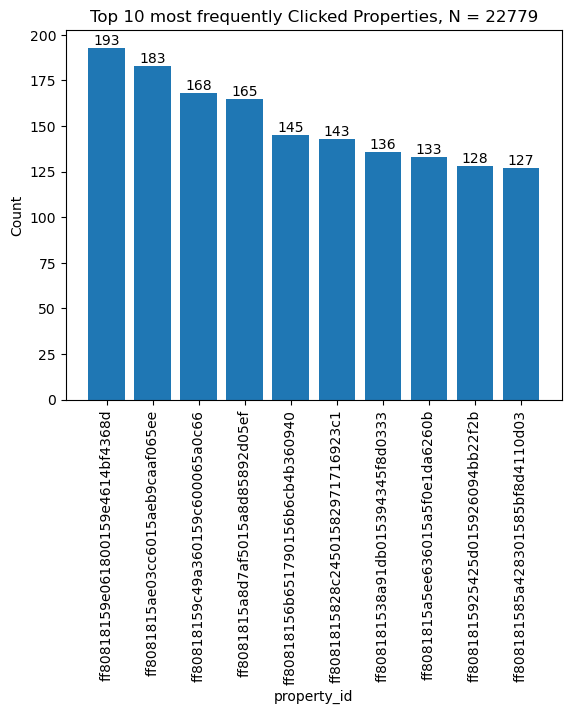

In [315]:
n_largest = 10
plt.bar(propid_vc.index[:n_largest], propid_vc.values[:n_largest])
plt.xticks(rotation=90)
plt.title(f"Top {n_largest} most frequently Clicked Properties, N = {unique_ids}")
plt.xlabel("property_id")
plt.ylabel("Count")
# Annotating each bar with its count
for i, v in enumerate(propid_vc.values[:n_largest]):
    plt.text(i, v + 0.1, str(v), ha='center', va='bottom')
plt.show();

In [316]:
propid_vc.values[:n_largest]

array([193, 183, 168, 165, 145, 143, 136, 133, 128, 127], dtype=int64)

In [317]:
df_merged.groupby("property_id")["delta_date_days"].agg(["mean","std","count","min","max"])

,mean,std,count,min,max
property_id,,,,,
ff808081469fd6e20146a5af948000ea,1.109198,0.850015,4,0.052280,2.133866
ff8080814702d3d10147068359d200cd,11.590041,10.551856,12,1.077211,34.315822
ff808081470c645401470fb03f5800a6,3.312425,2.869540,27,0.075613,8.918657
ff808081470c6454014715eaa5960281,10.983554,12.540024,13,0.615660,34.550093
ff808081474aa867014771a0298f0aa6,4.564446,3.171682,68,0.012280,11.666400
...,...,...,...,...,...
ff8081815b1fdda8015b1fe675ae0146,4.075255,2.970595,10,0.609074,8.721204
ff8081815b1fdda8015b1ffee8a305d2,2.493997,1.053083,3,1.758669,3.700382
ff8081815b1fdda8015b2000369205fd,5.390214,1.698996,2,4.188843,6.591586


In [318]:
# var within 0-n days since activation
num_day_range = 7

In [319]:
(df_merged["delta_date_days"] <= num_day_range).sum()

69781

In [320]:
69781/170611

0.4090064532767524

In [321]:
df_merged_filter = df_merged[df_merged["delta_date_days"] <= num_day_range]
df_merged_filter

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date,delta_date,delta_date_days
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-10 17:42:34,1 days 03:06:34,1.129560
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-09 15:51:17,0 days 01:15:17,0.052280
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-10 17:30:22,1 days 02:54:22,1.121088
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-11 17:48:46,2 days 03:12:46,2.133866
5,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,1,0,0,1,0,0,0,2017-03-13 00:18:47,5 days 12:16:47,5.511655
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170601,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,0,0,1,0,1,0,0,2017-03-31 16:14:39,0 days 17:44:39,0.739340
170606,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,1,0,0,1,0,0,11,2017-04-03 16:13:55,3 days 17:40:55,3.736748
170607,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,1,0,0,1,0,0,11,2017-04-02 21:54:14,2 days 23:21:14,2.973079
170609,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,1,0,0,1,0,0,11,2017-04-04 10:01:12,4 days 11:28:12,4.477917


In [322]:
df_merged_filter["delta_date_days"].describe()

count    69781.000000
mean         3.041394
std          2.029319
min          0.000799
25%          1.166192
50%          2.867106
75%          4.814884
max          6.999965
Name: delta_date_days, dtype: float64

In [323]:
df_merged_filter.groupby("property_id")["delta_date_days"].agg(["mean","std","count","min","max"])

,mean,std,count,min,max
property_id,,,,,
ff808081469fd6e20146a5af948000ea,1.109198,0.850015,4,0.052280,2.133866
ff8080814702d3d10147068359d200cd,2.540333,1.878666,5,1.077211,5.511655
ff808081470c645401470fb03f5800a6,2.174467,1.686715,22,0.075613,6.014757
ff808081470c6454014715eaa5960281,2.707812,2.462552,7,0.615660,6.599097
ff808081474aa867014771a0298f0aa6,3.126960,1.949584,52,0.012280,6.826157
...,...,...,...,...,...
ff8081815b1fdda8015b1fe675ae0146,2.920770,1.931134,8,0.609074,6.492465
ff8081815b1fdda8015b1ffee8a305d2,2.493997,1.053083,3,1.758669,3.700382
ff8081815b1fdda8015b2000369205fd,5.390214,1.698996,2,4.188843,6.591586


In [324]:
df_filtered_propid_count = df_merged_filter.groupby("property_id")["delta_date_days"].agg("count")
df_filtered_propid_count

property_id
ff808081469fd6e20146a5af948000ea     4
ff8080814702d3d10147068359d200cd     5
ff808081470c645401470fb03f5800a6    22
ff808081470c6454014715eaa5960281     7
ff808081474aa867014771a0298f0aa6    52
                                    ..
ff8081815b1fdda8015b1fe675ae0146     8
ff8081815b1fdda8015b1ffee8a305d2     3
ff8081815b1fdda8015b2000369205fd     2
ff8081815b200540015b20158b0103c9     2
ff8081815b2007fc015b201c77a20395     4
Name: delta_date_days, Length: 17386, dtype: int64

In [325]:
df_merged_filter.shape
df_filtered_propid_count.shape
type(df_filtered_propid_count)

(69781, 38)

(17386,)

pandas.core.series.Series

In [326]:
df_merged_filter

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date,delta_date,delta_date_days
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-10 17:42:34,1 days 03:06:34,1.129560
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-09 15:51:17,0 days 01:15:17,0.052280
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-10 17:30:22,1 days 02:54:22,1.121088
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-11 17:48:46,2 days 03:12:46,2.133866
5,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,1,0,0,1,0,0,0,2017-03-13 00:18:47,5 days 12:16:47,5.511655
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170601,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,0,0,1,0,1,0,0,2017-03-31 16:14:39,0 days 17:44:39,0.739340
170606,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,1,0,0,1,0,0,11,2017-04-03 16:13:55,3 days 17:40:55,3.736748
170607,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,1,0,0,1,0,0,11,2017-04-02 21:54:14,2 days 23:21:14,2.973079
170609,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,1,0,0,1,0,0,11,2017-04-04 10:01:12,4 days 11:28:12,4.477917


In [327]:
# Merge the Series with the DataFrame based on their index
df_merged_filter = pd.merge(df_merged_filter, df_filtered_propid_count.to_frame(), on="property_id")
df_merged_filter

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date,delta_date,delta_date_days_x,delta_date_days_y
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:42:34,1 days 03:06:34,1.129560,4
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-09 15:51:17,0 days 01:15:17,0.052280,4
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:30:22,1 days 02:54:22,1.121088,4
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-11 17:48:46,2 days 03:12:46,2.133866,4
4,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-13 00:18:47,5 days 12:16:47,5.511655,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69776,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,0,1,0,1,0,0,2017-03-31 16:14:39,0 days 17:44:39,0.739340,2
69777,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-03 16:13:55,3 days 17:40:55,3.736748,4
69778,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-02 21:54:14,2 days 23:21:14,2.973079,4
69779,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-04 10:01:12,4 days 11:28:12,4.477917,4


In [328]:
#df_merged_filter = df_merged_filter.drop(columns=["delta_date_days_y"])

In [329]:
#df_merged_filter

In [330]:
df_merged_filter = df_merged_filter.rename(columns={'delta_date_days_y': 'n_interactions'})

In [331]:
df_merged_filter

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date,delta_date,delta_date_days_x,n_interactions
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:42:34,1 days 03:06:34,1.129560,4
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-09 15:51:17,0 days 01:15:17,0.052280,4
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:30:22,1 days 02:54:22,1.121088,4
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-11 17:48:46,2 days 03:12:46,2.133866,4
4,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-13 00:18:47,5 days 12:16:47,5.511655,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69776,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,0,1,0,1,0,0,2017-03-31 16:14:39,0 days 17:44:39,0.739340,2
69777,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-03 16:13:55,3 days 17:40:55,3.736748,4
69778,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-02 21:54:14,2 days 23:21:14,2.973079,4
69779,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-04 10:01:12,4 days 11:28:12,4.477917,4


In [332]:
df_merged_filter = df_merged_filter.rename(columns={'delta_date_days_x': 'delta_date_days'})
df_merged_filter

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date,delta_date,delta_date_days,n_interactions
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:42:34,1 days 03:06:34,1.129560,4
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-09 15:51:17,0 days 01:15:17,0.052280,4
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:30:22,1 days 02:54:22,1.121088,4
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-11 17:48:46,2 days 03:12:46,2.133866,4
4,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-13 00:18:47,5 days 12:16:47,5.511655,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69776,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,0,1,0,1,0,0,2017-03-31 16:14:39,0 days 17:44:39,0.739340,2
69777,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-03 16:13:55,3 days 17:40:55,3.736748,4
69778,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-02 21:54:14,2 days 23:21:14,2.973079,4
69779,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-04 10:01:12,4 days 11:28:12,4.477917,4


In [333]:
df_merged_filter.head(15)

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date,delta_date,delta_date_days,n_interactions
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:42:34,1 days 03:06:34,1.129560,4
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-09 15:51:17,0 days 01:15:17,0.052280,4
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:30:22,1 days 02:54:22,1.121088,4
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-11 17:48:46,2 days 03:12:46,2.133866,4
4,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-13 00:18:47,5 days 12:16:47,5.511655,5
5,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-08 22:30:59,1 days 10:28:59,1.436794,5
6,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-10 19:13:04,3 days 07:11:04,3.299352,5
7,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-08 21:04:23,1 days 09:02:23,1.376655,5
8,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-08 13:53:11,1 days 01:51:11,1.077211,5
9,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,1,0,1,0,0,12,2017-03-11 09:41:29,0 days 19:58:29,0.832280,22


In [334]:
df_merged_filter.to_csv("Property Clicks interactions Within 0-7 Days.csv")

In [335]:
%ls -l "Property Clicks interactions Within 0-7 Days.csv"

 Volume in drive C is OS
 Volume Serial Number is A240-F140

 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction


 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction

12/02/2023  05:20 PM        18,148,486 Property Clicks interactions Within 0-7 Days.csv
               1 File(s)     18,148,486 bytes
               0 Dir(s)  194,595,983,360 bytes free


In [336]:
df_merged_filter.shape

(69781, 39)

In [337]:
df_merged_filter.columns

Index(['property_id', 'type', 'activation_date', 'bathroom', 'floor',
       'total_floor', 'furnishing', 'gym', 'latitude', 'longitude',
       'lease_type', 'lift', 'locality', 'parking', 'property_age',
       'property_size', 'swimming_pool', 'pin_code', 'rent', 'deposit',
       'building_type', 'bedroom', 'hall', 'furnishing_FULLY_FURNISHED',
       'furnishing_SEMI_FURNISHED', 'lease_type_BACHELOR',
       'lease_type_COMPANY', 'lease_type_FAMILY', 'parking_BOTH',
       'parking_FOUR_WHEELER', 'parking_TWO_WHEELER', 'building_type_AP',
       'building_type_IF', 'building_type_IH', 'photo_count', 'request_date',
       'delta_date', 'delta_date_days', 'n_interactions'],
      dtype='object')

In [338]:
df_merged_filter.isna().sum()

property_id                     0
type                            0
activation_date                 0
bathroom                        0
floor                           0
total_floor                     0
furnishing                      0
gym                             0
latitude                        0
longitude                       0
lease_type                      0
lift                            0
locality                        0
parking                         0
property_age                    0
property_size                   0
swimming_pool                   0
pin_code                        0
rent                            0
deposit                         0
building_type                 131
bedroom                         0
hall                            0
furnishing_FULLY_FURNISHED      0
furnishing_SEMI_FURNISHED       0
lease_type_BACHELOR             0
lease_type_COMPANY              0
lease_type_FAMILY               0
parking_BOTH                    0
parking_FOUR_W

# Modeling Finally!

The Bolded Models/Algorithms are the ones we implemented

| Model/Algorithm Category | Specific Model/Algorithm | Description |
| :------------------------ | :------------------------ | :----------- |
| Linear Models | Linear Regression | Models linear relationship between dependent and independent variables |
|  | Ridge Regression (L2 Regularization) | Adds L2 regularization to prevent overfitting |
|  | Lasso Regression (L1 Regularization) | Implements L1 regularization, leading to sparse models |
|  | Elastic Net Regression | Combines L1 and L2 regularization |
|  | Polynomial Regression | Models as an nth degree polynomial for a nonlinear relationship |
|  | Bayesian Linear Regression | Incorporates Bayesian methods for probabilistic outputs |
|  | Generalized Linear Models (GLM) <BR> <li> <b>Poisson Regression <BR> <li> <b>Negative Binomial Regression| Extends linear models for non-normal error distributions |
| Support Vector Machines | <b>Support Vector Regression (SVR) | Adapts SVM for regression, fitting within a threshold |
|  | Epsilon-Support Vector Regression (ε-SVR) | SVR with a specified margin of tolerance |
| Decision Trees and Ensembles | Decision Trees for Regression | Uses decision trees for regression tasks |
|  | <b>Random Forest Regression | An ensemble of regression trees |
|  | Gradient Boosting Machines (GBM) | Sequentially adds models to correct errors |
|  | Extreme Gradient Boosting (XGBoost) | Efficient and scalable implementation of GBM |
|  | LightGBM | Optimized for speed and efficiency, good for large datasets |
|  | CatBoost | Effective with categorical data and robust to overfitting |
| Nearest Neighbors | K-Nearest Neighbors (KNN) for Regression | Uses 'k' nearest points for predicting output |
| Bayesian Methods | Gaussian Process Regression (GPR) | Assumes a Gaussian process prior over functions |
| Regularization and Optimization Techniques | Regularized Gradient Descent | Minimizes the cost function with regularization |
|  | Quantile Regression | Focuses on estimating medians or other quantiles |
| Additional Techniques | Neural Networks for Regression | Flexible and powerful, suitable for complex relationships |
|  | Robust Regression | Designed to overcome limitations like outliers in data |
|  | Sparse Regression | Useful when dealing with high-dimensional data |
|  | Functional Regression | Deals with data where inputs or outputs are functions |


# CREATE THE SUMMARY TABLE FOR THE MODELS


In [339]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

In [393]:
summary_df = pd.DataFrame(columns=["Model", "MAE", "MSE", "RMSE", "R Squared"])
summary_df
summary_df.shape

,Model,MAE,MSE,RMSE,R Squared


(0, 5)

In [340]:
# df_merged_filter_X_features = [
#  #'property_id',     
#  #'type',
#  #'activation_date',  
#  'bathroom',
#  'floor',
#  'total_floor',
#  'furnishing',
#  'gym',
#  'latitude',
#  'longitude',
#  'lease_type',
#  'lift',
#  'locality',
#  'parking',
#  'property_age',
#  'property_size',
#  'swimming_pool',
#  'pin_code',
#  'rent',
#  'deposit',
#  'building_type',
#  #'distance_to_center',
#  #'request_date',
#  #'delta_date',
#  #'delta_date_days',
#  #'n_interactions'
# ]



df_merged_filter_X_features = [
#'property_id',
#'type',
#'activation_date',
'bathroom',
'floor',
'total_floor',
#'furnishing',
'gym',
#'latitude',
#'longitude',
#'lease_type',
'lift',
#'locality',
#'parking',
'property_age',
'property_size',
'swimming_pool',
'pin_code',
'rent',
'deposit',
#'building_type',
'bedroom',
'hall',
'furnishing_FULLY_FURNISHED',
'furnishing_SEMI_FURNISHED',
'lease_type_BACHELOR',
'lease_type_COMPANY',
'lease_type_FAMILY',
'parking_BOTH',
'parking_FOUR_WHEELER',
'parking_TWO_WHEELER',
'building_type_AP',
'building_type_IF',
'building_type_IH',
'photo_count',   
#'request_date',
#'delta_date',
#'delta_date_days',
#'n_interactions'
]

In [341]:
df_merged_filter_X_features

['bathroom',
 'floor',
 'total_floor',
 'gym',
 'lift',
 'property_age',
 'property_size',
 'swimming_pool',
 'pin_code',
 'rent',
 'deposit',
 'bedroom',
 'hall',
 'furnishing_FULLY_FURNISHED',
 'furnishing_SEMI_FURNISHED',
 'lease_type_BACHELOR',
 'lease_type_COMPANY',
 'lease_type_FAMILY',
 'parking_BOTH',
 'parking_FOUR_WHEELER',
 'parking_TWO_WHEELER',
 'building_type_AP',
 'building_type_IF',
 'building_type_IH',
 'photo_count']

In [394]:
# ALLLLL The DATA
X = df_merged_filter[df_merged_filter_X_features] 
y = df_merged_filter['n_interactions']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f'{X_train.shape = }', "\n", f'{X_test.shape = }', "\n", f'{y_train.shape = }', "\n", f'{y_test.shape = }')

X_train.shape = (55824, 25) 
 X_test.shape = (13957, 25) 
 y_train.shape = (55824,) 
 y_test.shape = (13957,)


In [343]:
np.array(y_train).shape

(55824,)

In [344]:
np.array(y_train).reshape(-1,1)

array([[ 5],
       [21],
       [ 7],
       ...,
       [ 7],
       [20],
       [11]], dtype=int64)

In [345]:
np.array(y_train).reshape(-1,1).shape

(55824, 1)

In [346]:
np.array(y_test).shape

(13957,)

In [347]:
np.array(y_test).reshape(-1,1)

array([[ 3],
       [ 8],
       [31],
       ...,
       [ 4],
       [32],
       [ 3]], dtype=int64)

In [348]:
np.array(y_test).reshape(-1,1).shape

(13957, 1)

In [395]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

y_train_reshaped = np.array(y_train).reshape(-1,1)
y_test_reshaped = np.array(y_test).reshape(-1,1)

# Scale Features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

y_train_scaled = scaler.fit_transform(y_train_reshaped)
y_test_scaled = scaler.transform(y_test_reshaped)

print(f'{X_train_scaled.shape = }', "\n",
      f'{X_test_scaled.shape = }', "\n",
      f'{y_train_scaled.shape = }', "\n",
      f'{y_test_scaled.shape = }') 

X_train_scaled.shape = (55824, 25) 
 X_test_scaled.shape = (13957, 25) 
 y_train_scaled.shape = (55824, 1) 
 y_test_scaled.shape = (13957, 1)


In [404]:
from sklearn import metrics

def perf_metrics(y_test, y_pred):
    
    # Evaluate the model
    mae = metrics.mean_absolute_error(y_test, y_pred)
    mse = metrics.mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))

    # Calculate R-squared
    r_squared = metrics.r2_score(y_test, y_pred)
    
    return mae, mse, rmse, r_squared 


In [412]:
def append_to_summary(record):
    summary_df.loc[len(summary_df)] = record

# Random Forest Regressor

In [396]:
from sklearn.ensemble import RandomForestRegressor
#help(RandomForestRegressor)

In [401]:
%%time 
from sklearn.ensemble import RandomForestRegressor

# Create and fit the Random Forest regression model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_RFR_pred = rf_model.predict(X_test)


CPU times: total: 27.8 s
Wall time: 47 s


In [407]:
mae, mse, rmse, r_squared = perf_metrics(y_test, y_pred) 
#["Model", "MAE", "MSE", "RMSE", "R Squared"]
record = ["Random Forest Regression", mae, mse, rmse, r_squared]
record

['Random Forest Regression',
 0.4504335329683094,
 1.7633596588995941,
 1.327915531537904,
 0.9860125623589227]

In [410]:
append_to_summary(record)
summary_df

,Model,MAE,MSE,RMSE,R Squared
0,Random Forest Regression,0.450434,1.76336,1.327916,0.986013


In [411]:
len(summary_df)

1

# SVR

In [403]:
%%time 
from sklearn.svm import SVR
from sklearn import metrics

# Train SVR Model
svr_model = SVR(kernel='linear')  # You can choose different kernels and tune hyperparameters
svr_model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_SVR_pred = svr_model.predict(X_test_scaled)

Mean Absolute Error: 6.486086901120783
Mean Squared Error: 125.38501673652353
Root Mean Squared Error: 11.197545120986275
R-squared: 0.005412710971272716
CPU times: total: 3min 49s
Wall time: 6min 35s


In [413]:
mae, mse, rmse, r_squared = perf_metrics(y_test, y_SVR_pred) 
#["Model", "MAE", "MSE", "RMSE", "R Squared"]
record = ["Support Vector Regression", mae, mse, rmse, r_squared]
record

['Support Vector Regression',
 6.486086901120783,
 125.38501673652353,
 11.197545120986275,
 0.005412710971272716]

In [415]:
append_to_summary(record)
summary_df

,Model,MAE,MSE,RMSE,R Squared
0,Random Forest Regression,0.450434,1.763360,1.327916,0.986013
1,Support Vector Regression,6.486087,125.385017,11.197545,0.005413


# Poisson Regressor

In [417]:
%%time 
from sklearn import linear_model
from sklearn import metrics

clf = linear_model.PoissonRegressor()

clf.fit(X_train_scaled, y_train)
score = clf.score(X_train_scaled, y_train)
print(f'{score = }')
print(f'{clf.coef_ = }')
print(f'{clf.intercept_ = }')

# Make predictions on the test set
y_Poi_pred = clf.predict(X_test_scaled)

score = 0.14452178975669938
clf.coef_ = array([-0.03455337, -0.03348675,  0.03903862, -0.03437471, -0.04625929,
       -0.04827235, -0.0033794 , -0.0521335 , -0.04473579,  0.09779882,
       -0.17977726, -0.20283219,  0.14045504, -0.005456  ,  0.12428855,
        0.04333784, -0.01212076, -0.08019431,  0.00852604,  0.03035714,
       -0.01370703,  0.03672083, -0.00585254, -0.02408578,  0.11228471])
clf.intercept_ = 2.2910229620765046
CPU times: total: 234 ms
Wall time: 72.1 ms


In [419]:
mae, mse, rmse, r_squared = perf_metrics(y_test, y_Poi_pred) 
#["Model", "MAE", "MSE", "RMSE", "R Squared"]
record = ["Poisson Regression", mae, mse, rmse, r_squared]
record

['Poisson Regression',
 7.080682579676959,
 113.35495116031481,
 10.64682822066341,
 0.1008383895706676]

In [421]:
append_to_summary(record)
summary_df

,Model,MAE,MSE,RMSE,R Squared
0,Random Forest Regression,0.450434,1.763360,1.327916,0.986013
1,Support Vector Regression,6.486087,125.385017,11.197545,0.005413
2,Poisson Regression,7.080683,113.354951,10.646828,0.100838


In [354]:
%%timeit 
for i in range(10000000):
    x = (i**2) * (7.1**4) 

1.48 s ± 29.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


# Negative Binomial Regession

In [355]:
df_merged_filter_X_features

['bathroom',
 'floor',
 'total_floor',
 'gym',
 'lift',
 'property_age',
 'property_size',
 'swimming_pool',
 'pin_code',
 'rent',
 'deposit',
 'bedroom',
 'hall',
 'furnishing_FULLY_FURNISHED',
 'furnishing_SEMI_FURNISHED',
 'lease_type_BACHELOR',
 'lease_type_COMPANY',
 'lease_type_FAMILY',
 'parking_BOTH',
 'parking_FOUR_WHEELER',
 'parking_TWO_WHEELER',
 'building_type_AP',
 'building_type_IF',
 'building_type_IH',
 'photo_count']

In [356]:
X_feat_df = df_merged_filter[df_merged_filter_X_features] 
X_feat_df

,bathroom,floor,total_floor,gym,lift,property_age,property_size,swimming_pool,pin_code,rent,...,lease_type_BACHELOR,lease_type_COMPANY,lease_type_FAMILY,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count
0,1,3,4,1,1,2,850,1,560076.0,12000,...,0,0,1,1,0,0,1,0,0,7
1,1,3,4,1,1,2,850,1,560076.0,12000,...,0,0,1,1,0,0,1,0,0,7
2,1,3,4,1,1,2,850,1,560076.0,12000,...,0,0,1,1,0,0,1,0,0,7
3,1,3,4,1,1,2,850,1,560076.0,12000,...,0,0,1,1,0,0,1,0,0,7
4,2,4,11,1,1,1,1233,1,560016.0,20000,...,0,0,1,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69776,1,1,2,0,0,5,600,0,560034.0,14000,...,0,0,0,0,0,1,0,1,0,0
69777,2,0,4,1,1,1,1550,0,560093.0,24000,...,0,0,1,1,0,0,1,0,0,11
69778,2,0,4,1,1,1,1550,0,560093.0,24000,...,0,0,1,1,0,0,1,0,0,11
69779,2,0,4,1,1,1,1550,0,560093.0,24000,...,0,0,1,1,0,0,1,0,0,11


In [357]:
print(X_feat_df["bathroom"].values)
print(type(X_feat_df["bathroom"].values))
print(X_feat_df["bathroom"].shape)

[1 1 1 ... 2 2 2]
<class 'numpy.ndarray'>
(69781,)


In [358]:
# Create empty dictionaries to store lists for each column
X_column_lists = {}

# Iterate over columns and create lists
for column in X_feat_df.columns:
    X_column_lists[column] = X_feat_df[column].tolist()

In [359]:
X_column_lists.keys()
len(X_column_lists.keys())

dict_keys(['bathroom', 'floor', 'total_floor', 'gym', 'lift', 'property_age', 'property_size', 'swimming_pool', 'pin_code', 'rent', 'deposit', 'bedroom', 'hall', 'furnishing_FULLY_FURNISHED', 'furnishing_SEMI_FURNISHED', 'lease_type_BACHELOR', 'lease_type_COMPANY', 'lease_type_FAMILY', 'parking_BOTH', 'parking_FOUR_WHEELER', 'parking_TWO_WHEELER', 'building_type_AP', 'building_type_IF', 'building_type_IH', 'photo_count'])

25

In [360]:
len(X_column_lists['bathroom'])

69781

In [361]:
#Left off HERE
X_column_lists['bathroom']

[1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 3,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 4,
 4,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 2,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 2,


In [362]:
# Print the lists
#for column, values in X_column_lists.items():
#    print(f"{column}: {values}")

In [368]:
# Data for Negative Binomial Regression

#     'y': [5, 12, 8, 15, 10, 18, 6, 22, 16, 25],
#     'x1': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
#     'x2': [1, 0, 1, 0, 1, 0, 1, 0, 1, 0],


Neg_Bi_R_data = X_column_lists.copy()

Neg_Bi_R_data['n_interactions'] = df_merged_filter['n_interactions'].tolist()

print(len(Neg_Bi_R_data))
Neg_Bi_R_data.keys()

26


dict_keys(['bathroom', 'floor', 'total_floor', 'gym', 'lift', 'property_age', 'property_size', 'swimming_pool', 'pin_code', 'rent', 'deposit', 'bedroom', 'hall', 'furnishing_FULLY_FURNISHED', 'furnishing_SEMI_FURNISHED', 'lease_type_BACHELOR', 'lease_type_COMPANY', 'lease_type_FAMILY', 'parking_BOTH', 'parking_FOUR_WHEELER', 'parking_TWO_WHEELER', 'building_type_AP', 'building_type_IF', 'building_type_IH', 'photo_count', 'n_interactions'])

In [380]:
%%time
import pandas as pd
import statsmodels.api as sm

# Make sure you have the dependent variable (response) and independent variables (features) in your DataFrame

Neg_Bi_R_df = pd.DataFrame(Neg_Bi_R_data)


# Specify the model
formula = 'n_interactions ~ '
for column in Neg_Bi_R_data.keys():
    if column != "n_interactions":
        formula += column + " + "
formula = formula[:-2]                


Neg_Bi_R_model = sm.GLM.from_formula(formula, data=Neg_Bi_R_df, family=sm.families.NegativeBinomial())

# Fit the model
Neg_Bi_R_model_results = Neg_Bi_R_model.fit()

# Display model summary
print(Neg_Bi_R_model_results.summary())

C:\Users\sabde\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning:

Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.



                 Generalized Linear Model Regression Results                  
Dep. Variable:         n_interactions   No. Observations:                69781
Model:                            GLM   Df Residuals:                    69755
Model Family:        NegativeBinomial   Df Model:                           25
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -2.3209e+05
Date:                Sat, 02 Dec 2023   Deviance:                       48654.
Time:                        19:53:24   Pearson chi2:                 6.25e+04
No. Iterations:                    22   Pseudo R-squ. (CS):             0.1124
Covariance Type:            nonrobust                                         
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept           

In [379]:
help(Neg_Bi_R_model)

Help on GLM in module statsmodels.genmod.generalized_linear_model object:

class GLM(statsmodels.base.model.LikelihoodModel)
 |  GLM(endog, exog, family=None, offset=None, exposure=None, freq_weights=None, var_weights=None, missing='none', **kwargs)
 |  
 |  Generalized Linear Models
 |  
 |  GLM inherits from statsmodels.base.model.LikelihoodModel
 |  
 |  Parameters
 |  ----------
 |  endog : array_like
 |      1d array of endogenous response variable.  This array can be 1d or 2d.
 |      Binomial family models accept a 2d array with two columns. If
 |      supplied, each observation is expected to be [success, failure].
 |  exog : array_like
 |      A nobs x k array where `nobs` is the number of observations and `k`
 |      is the number of regressors. An intercept is not included by default
 |      and should be added by the user (models specified using a formula
 |      include an intercept by default). See `statsmodels.tools.add_constant`.
 |  family : family class instance
 |   

In [386]:
type(Neg_Bi_R_model_results.params)

pandas.core.series.Series

In [388]:
# Concatenating the two Series horizontally (along axis 1)
merged_series_H_df = pd.concat([Neg_Bi_R_model_results.params, Neg_Bi_R_model_results.pvalues], axis=1,
                               keys=['Coefficients', 'P-values'])

# Display the horizontally merged Series
merged_series_H_df


,Coefficients,P-values
Intercept,1.736939e+00,1.402374e-70
bathroom,1.220946e-02,2.943768e-01
floor,-2.088312e-02,3.551207e-12
total_floor,1.163741e-02,2.107494e-06
gym,-8.243473e-02,3.976199e-05
lift,-1.206438e-01,8.236235e-14
property_age,-2.421141e-03,2.483330e-05
property_size,-1.671957e-06,8.800575e-01
swimming_pool,-2.103595e-01,1.034204e-22
pin_code,-4.004379e-07,7.399443e-14


In [389]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Exclude the 'n_interactions' column
Neg_Bi_R_df_T_excluded = Neg_Bi_R_df.drop(['n_interactions'], axis=1)

# Get the predicted values from the model
y_Neg_Bi_R_pred = Neg_Bi_R_model_results.predict(Neg_Bi_R_df_T_excluded)

# Get the actual values
y_Neg_Bi_R_test = Neg_Bi_R_df['n_interactions']

# Calculate metrics
mae = mean_absolute_error(y_Neg_Bi_R_test, y_Neg_Bi_R_pred)
mse = mean_squared_error(y_Neg_Bi_R_test, y_Neg_Bi_R_pred)
rmse = np.sqrt(mse)

print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')

MAE: 7.105968774965604
MSE: 117.72491714269154
RMSE: 10.850111388492357


In [426]:
len(y_Neg_Bi_R_test) == len(y_test)

False

In [427]:
y_Neg_Bi_R_test.shape

(69781,)

In [428]:
y_test.shape

(13957,)

In [429]:
y_Neg_Bi_R_pred.shape

(69781,)

In [384]:
from sklearn.metrics import r2_score

# Calculate R-squared
r_squared = r2_score(y_Neg_Bi_R_test, y_Neg_Bi_R_pred)

print(f'R-squared: {r_squared}')


R-squared: 0.10047215901942463


In [430]:
mae, mse, rmse, r_squared = perf_metrics(y_Neg_Bi_R_test, y_Neg_Bi_R_pred) 
#["Model", "MAE", "MSE", "RMSE", "R Squared"]
record = ["Negative Binomial Regression", mae, mse, rmse, r_squared]
record

['Negative Binomial Regression',
 7.105968774965604,
 117.72491714269154,
 10.850111388492357,
 0.10047215901942463]

In [431]:
append_to_summary(record)
summary_df

,Model,MAE,MSE,RMSE,R Squared
0,Random Forest Regression,0.450434,1.763360,1.327916,0.986013
1,Support Vector Regression,6.486087,125.385017,11.197545,0.005413
2,Poisson Regression,7.080683,113.354951,10.646828,0.100838
3,Negative Binomial Regression,7.105969,117.724917,10.850111,0.100472


In [432]:
summary_df.to_csv("Property Clicks Model Summary Data.csv")

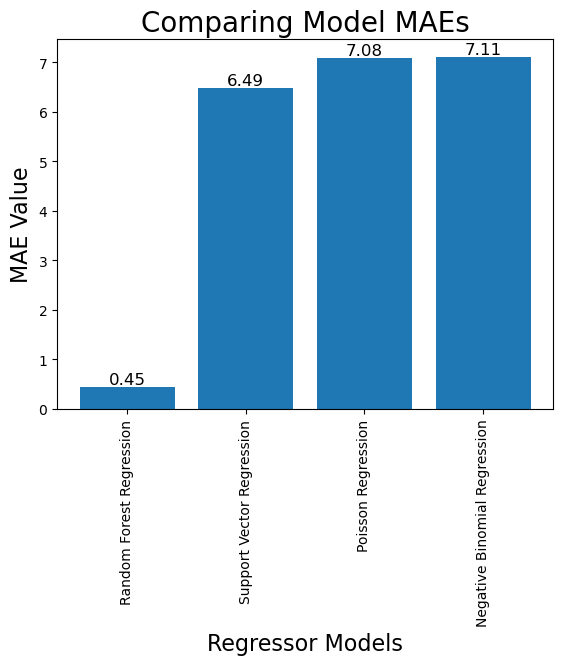

In [449]:
plt.bar(summary_df["Model"], summary_df["MAE"])
plt.title("Comparing Model MAEs", fontsize=20)
plt.ylabel("MAE Value", fontsize=16)
plt.xticks(rotation=90)
plt.xlabel("Regressor Models",fontsize=16)
# Annotate the top of each bar with the corresponding values
spacing = 0  # Adjust the spacing as needed
for i, value in enumerate(summary_df["MAE"]):
    plt.text(i, value + spacing, f"{value:.2f}", ha='center', va='bottom', fontsize=12)

plt.show();

| Metric                               | Description                                                  | Range            | Ideal Value      | Sensitivity to Outliers  |
|---------------------------------------|--------------------------------------------------------------|------------------|------------------|--------------------------|
| **Mean Absolute Error (MAE)**         | Average of absolute differences between predicted and actual  | 0 to +∞          | 0 (lower is better)| Moderate                 |
| **Mean Squared Error (MSE)**          | Average of squared differences between predicted and actual   | 0 to +∞          | 0 (lower is better)| Sensitive                |
| **Root Mean Squared Error (RMSE)**    | Square root of MSE                                          | 0 to +∞          | 0 (lower is better)| Sensitive                |
| **R-squared (R2) Score**              | Proportion of variance in dependent variable explained       | 0 to 1           | 1 (higher is better)| -                        |
| **Mean Absolute Percentage Error (MAPE)** | Average percentage difference between predicted and actual | 0% to +∞         | 0% (lower is better)| Sensitive                |
| **Mean Squared Logarithmic Error (MSLE)** | Mean squared logarithmic difference between predicted and actual | 0 to +∞        | 0 (lower is better)| Sensitive (log scale)    |
| **Huber Loss**                        | Combination of MSE and MAE, less sensitive to outliers       | 0 to +∞          | 0 (lower is better)| Moderate                 |
| **Median Absolute Error (MedAE or MAD)** | Median of absolute differences between predicted and actual  | 0 to +∞          | 0 (lower is better)| Robust                   |
| **Explained Variance Score**          | Proportion of variance explained by the model                | 0 to 1           | 1 (higher is better)| -                        |
| **Fraction of Variance Unexplained (FVU)** | Complementary to R-squared, fraction of variance not explained | 0 to 1         | 0 (lower is better)| -                        |
| **Theil's U Statistic**               | Ratio of RMSE to standard deviation of actual values         | 0 to +∞          | 0 (lower is better)| Moderate                 |
| **Cohen's Kappa**                     | Agreement between predicted and actual values (adapted for regression) | -1 to 1      | 1 (higher is better)| -                        |
